# **Déterminer le besoin métier** 


<font color=red>Analyse exploratoire pour déterminer si les données sur l’éducation de la banque mondiale permettent d’informer le projet d’expansion : </font>
- **Inspecter le dataset** 
- **Extraction des indicateurs pertinentes**
- **Statistiques descriptives indicateurs** 
- **Segmentation des pays pour l'expansion des contenus de formation en ligne pour un public de niveau lycée et université.**
- **Evolution des pays ciblés pour clients potentiels**
- **Dans quel pays l'entreprise doit-elle opérer en priorité**


# **Importer les librairies**
- [X] Importer ou installer librairies 


In [ ]:
# installer traducteur pour indicateur et topics
!pip install -U deep-translator
from deep_translator import GoogleTranslator
%load_ext google.colab.data_table
!pip install chart_studio
!pip install plotly

     |████████████████████████████████| 97 kB 3.5 MB/s 
     |████████████████████████████████| 97 kB 5.7 MB/s 
  Attempting uninstall: click
    Found existing installation: click 7.1.2
    Uninstalling click-7.1.2:
      Successfully uninstalled click-7.1.2
  Attempting uninstall: beautifulsoup4
    Found existing installation: beautifulsoup4 4.6.3
    Uninstalling beautifulsoup4-4.6.3:
      Successfully uninstalled beautifulsoup4-4.6.3
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
flask 1.1.4 requires click<8.0,>=5.1, but you have click 8.0.3 which is incompatible.
     |████████████████████████████████| 64 kB 1.7 MB/s 


In [ ]:
from IPython.display import Markdown
from DS_P2_TOOLBOX1 import *
from tabulate import tabulate
import pandas as pd 
import matplotlib.pyplot as plt 
import numpy as np
from IPython.display import Markdown
from termcolor import colored
from google.colab import data_table
from IPython.core.display import display, HTML
display(HTML("<style>.container { width:100% !important; }</style>"))
from scipy.stats import norm
from scipy.stats import shapiro
import scipy.stats as stats
from scipy.stats import normaltest
from statsmodels.graphics.gofplots import qqplot
from sklearn.preprocessing import OrdinalEncoder, OneHotEncoder
from plotly import __version__
from plotly.offline import download_plotlyjs, init_notebook_mode, plot, iplot
from plotly.offline import iplot
print(__version__)
import cufflinks as cf
init_notebook_mode(connected=True)
#cf.go_offline()
import plotly.express as px
from IPython.display import HTML
from statsmodels.stats.outliers_influence import variance_inflation_factor
from sklearn.cluster import KMeans


/usr/local/lib/python3.7/dist-packages/statsmodels/tools/_testing.py:19: FutureWarning: pandas.util.testing is deprecated. Use the functions in the public API at pandas.testing instead.
  import pandas.util.testing as tm


4.4.1


# **Upload le fichier Csv merged et reduce memory**

<font color=blue>Inspection de base </font>


- [x] Le fichier merged contient 3 tables (EDSTATSDATA, EDSTATSSERIES et 
EDSTATSCOUNTRY)


- [x] les dimensions du dataset merged est de 886930 lignes et 113 colonnes (le dataset contient énormément de valeurs manquantes )


- [x] Il y a 68 (float 64) et 45 (object) pour le type des variables


- [X] Il y a 242 observations 


- [X] il ya 3665 indicateurs et 32 topics (unique)


- [X] Il y a 7 régions, 5 Income Group (unique)


- [x] Years de 1970 à 2100


- [x] Le dataset contient plus de longues définitions que de petites définitions 


- [x] Il n'y a pas de target (Problématique Non supervisée)




In [ ]:
# drive poour récuperer path des fichiers désirés 
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [6]:
# importer fichier merged 
df_fusion = pd.read_csv('/content/df_fusion_reduce_memory.csv')
df_fusion.head()

/usr/local/lib/python3.7/dist-packages/IPython/core/interactiveshell.py:2718: DtypeWarning:

Columns (8,9,89,90,92,94,95,96,97,98,99,100,101,102,103,104,105,106,107,108,109) have mixed types.Specify dtype option on import or set low_memory=False.



,Country Name,Country Code,Series Code,Topic,Indicator Name,Indicator Code,Short definition,Long definition,Region,Income Group,1970,1971,1972,1973,1974,1975,1976,1977,1978,1979,1980,1981,1982,1983,1984,1985,1986,1987,1988,1989,1990,1991,1992,1993,1994,1995,1996,1997,1998,1999,...,2095,2100,Periodicity,Base Period,Other notes,Aggregation method,Limitations and exceptions,General comments,Source,Statistical concept and methodology,Development relevance,Related source links,Short Name,Table Name,Long Name,2-alpha code,Currency Unit,Special Notes,WB-2 code,National accounts base year,National accounts reference year,SNA price valuation,Lending category,Other groups,System of National Accounts,Alternative conversion factor,PPP survey year,Balance of Payments Manual in use,External debt Reporting status,System of trade,Government Accounting concept,IMF data dissemination standard,Latest population census,Latest household survey,Source of most recent Income and expenditure data,Vital registration complete,Latest agricultural census,Latest industrial data,Latest trade data,Latest water withdrawal data
0,Arab World,ARB,UIS.NERA.2,Secondary,"Adjusted net enrolment rate, lower secondary, ...",UIS.NERA.2,NaN,Total number of students of the official lower...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,UNESCO Institute for Statistics,NaN,NaN,NaN,Arab World,Arab World,Arab World,1A,NaN,Arab World aggregate. Arab World is composed o...,1A,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,Arab World,ARB,UIS.NERA.2.F,Secondary,"Adjusted net enrolment rate, lower secondary, ...",UIS.NERA.2.F,NaN,Total number of female students of the officia...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,UNESCO Institute for Statistics,NaN,NaN,NaN,Arab World,Arab World,Arab World,1A,NaN,Arab World aggregate. Arab World is composed o...,1A,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,Arab World,ARB,UIS.NERA.2.GPI,Secondary,"Adjusted net enrolment rate, lower secondary, ...",UIS.NERA.2.GPI,NaN,Ratio of female adjusted net enrolment rate fo...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,UNESCO Institute for Statistics,NaN,NaN,NaN,Arab World,Arab World,Arab World,1A,NaN,Arab World aggregate. Arab World is composed o...,1A,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,Arab World,ARB,UIS.NERA.2.M,Secondary,"Adjusted net enrolment rate, lower secondary, ...",UIS.NERA.2.M,NaN,Total number of male students of the official ...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,UNESCO Institute for Statistics,NaN,NaN,NaN,Arab World,Arab World,Arab World,1A,NaN,Arab World aggregate. Arab World is composed o...,1A,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,Arab World,ARB,SE.PRM.TENR,Primary,"Adjusted net enrolment rate, primary, both sex...",SE.PRM.TENR,NaN,Total number of students of the official prima...,NaN,NaN,54.82212,54.89414,56.20944,57.26711,57.99114,59.36554,60.99996,61.92268,62.69342,64.38319,65.61777,66.08515,66.60814,67.29045,68.51009,69.03321,69.94491,71.04187,71.69378,71.6991,71.99582,72.60284,70.03272,70.46482,72.64568,71.81176,73.90351,74.4252,75.11082,76.25432,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,UNESCO Institute for Statistics,NaN,NaN,NaN,Arab World,Arab World,Arab World,1A,NaN,Arab World aggregate. Arab World is composed o...,1A,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [ ]:
#les dimensions du df fusion
df_fusion.shape

(886930, 113)

In [ ]:
# voir info df_fusion
df_fusion.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 886930 entries, 0 to 886929
Columns: 113 entries, Country Name to Latest water withdrawal data
dtypes: float64(68), object(45)
memory usage: 764.6+ MB


In [ ]:
# decrire le dataset
df_fusion.describe(include='all')

,Country Name,Country Code,Series Code,Topic,Indicator Name,Indicator Code,Short definition,Long definition,Region,Income Group,1970,1971,1972,1973,1974,1975,1976,1977,1978,1979,1980,1981,1982,1983,1984,1985,1986,1987,1988,1989,1990,1991,1992,1993,1994,1995,1996,1997,1998,1999,...,2095,2100,Periodicity,Base Period,Other notes,Aggregation method,Limitations and exceptions,General comments,Source,Statistical concept and methodology,Development relevance,Related source links,Short Name,Table Name,Long Name,2-alpha code,Currency Unit,Special Notes,WB-2 code,National accounts base year,National accounts reference year,SNA price valuation,Lending category,Other groups,System of National Accounts,Alternative conversion factor,PPP survey year,Balance of Payments Manual in use,External debt Reporting status,System of trade,Government Accounting concept,IMF data dissemination standard,Latest population census,Latest household survey,Source of most recent Income and expenditure data,Vital registration complete,Latest agricultural census,Latest industrial data,Latest trade data,Latest water withdrawal data
count,886930,886930,775126,775126,886930,886930,775126,775126,784310,784310,7.228800e+04,3.553700e+04,3.561900e+04,3.554500e+04,3.573000e+04,8.730600e+04,3.748300e+04,3.757400e+04,3.757600e+04,3.680900e+04,8.912200e+04,3.877700e+04,3.751100e+04,3.846000e+04,3.860600e+04,9.029600e+04,3.937200e+04,3.864100e+04,3.855200e+04,3.754000e+04,1.244050e+05,7.443700e+04,7.554300e+04,7.579300e+04,7.746200e+04,1.313610e+05,7.680700e+04,7.345300e+04,8.491400e+04,1.188390e+05,...,5.143600e+04,5.143600e+04,775126,775126,775126,775126,775126,775126,775126,775126,775126,775126,883265,883265,883265,872270,787975,531425,879600,751325,117280.000000,722005,527760,212570,787975,172255,531425.0,663365,454460,733000,590065,663365,780645.0,516765,586400,406815,520430.0,392155.000000,678025.000000,656035.0
unique,242,242,3203,32,3665,3665,1125,1977,7,5,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,2,3,13,4,4,5,25,2,1,2,241,241,241,238,152,131,240,62,NaN,2,3,2,3,34,5.0,1,3,2,2,2,37.0,60,75,2,45.0,NaN,NaN,21.0
top,Jordan,EAP,UIS.AFR.GTCTR.2.F,Learning Outcomes,Repetition rate in Grade 3 of primary educatio...,UIS.AFR.GTCTR.2.F,NaN,Data Interpretation: 1=Latent; 2=Emerging; 3=E...,Europe & Central Asia,Upper middle income,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,UNESCO Institute for Statistics,NaN,NaN,NaN,Jordan,Jordan,Burkina Faso,EC,Euro,April 2012 database update: Based on official ...,EC,Original chained constant price data are resca...,NaN,Value added at basic prices (VAB),IBRD,HIPC,Country uses the 1993 System of National Accou...,1990–95,2005.0,"IMF Balance of Payments Manual, 6th edition.",Actual,General trade system,Consolidated central government,General Data Dissemination System (GDDS),2011.0,"Demographic and Health Survey (DHS), 2013","Integrated household survey (IHS), 2012",Yes,2010.0,NaN,NaN,2005.0
freq,3665,3665,242,242484,242,242,272250,44528,208905,201575,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,770286,774158,654852,770286,774400,773916,307098,770286,775126,730598,3665,3665,3665,3665,84295,21990,3665,102620,NaN,597395,245555,146600,604725,29320,243373.0,663365,392155,388490,348175,403150,205469.0,36650,54975,403150,89901.0,NaN,NaN,146600.0
mean,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.974772e+09,4.253638e+09,4.592365e+09,5.105006e+09,5.401493e+09,2.314288e+09,5.731808e+09,6.124437e+09,6.671489e+09,7.436724e+09,3.283898e+09,7.664969e+09,7.913722e+09,7.856908e+09,8.118002e+09,3.622763e+09,9.156550e+09,1.014901e+10,1.104709e+10,1.195436e+10,9.084424e+09,1.571674e+10,1.604668e+10,1.643532e+10,1.684022e+10,1.052543e+10,1.874630e+10,2.027385e+10,1.794678e+10,1.331558

Les valeurs manquantes dans chaque colonne :

+---------------------------------------------------+-----------+-----------+----------------------+------------------+---------+
|                                                   | Count_NaN | %_NaN_col | Total_NaN_in_dataset | %_NaN_in_dataset |  Types  |
+---------------------------------------------------+-----------+-----------+----------------------+------------------+---------+
|                       2017                        |  886787   |   99.98   |       61987600       |      61.85       | float64 |
|                       2016                        |  870470   |   98.14   |       61987600       |      61.85       | float64 |
|                       1971                        |  851393   |   95.99   |       61987600       |      61.85       | float64 |
|                       1973                        |  851385   |   95.99   |       61987600       |      61.85       | float64 |
|                       1972                

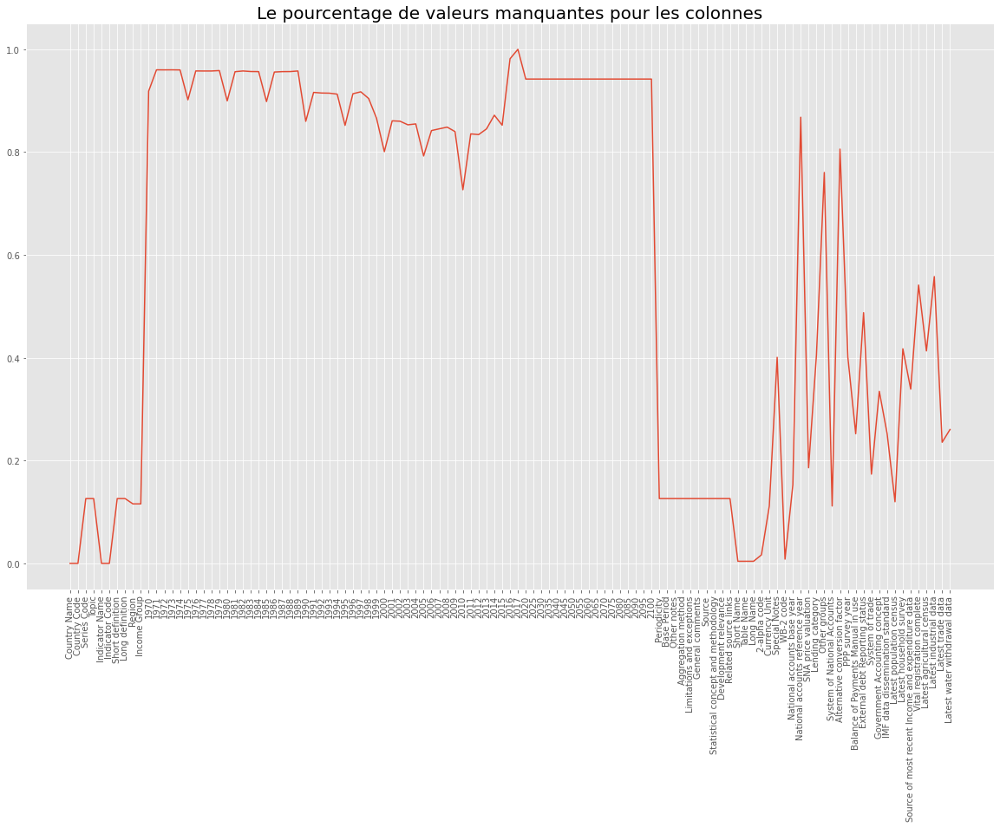


----------------------------------------------------------------------------------



In [ ]:
def NaN_columns_df(df):
    

        
        #print(f"Le dataset : {colored(keys.upper(),'red')}")
        #print(f'Les dimensions du {keys} : {df.shape}')
        
        dtypes = df.dtypes
        missing_count = df.isnull().sum()
        value_counts = df.isnull().count()
        missing_pct = (missing_count/value_counts)*100
        missing_total = df.isna().sum().sum()
        pct_NaN_total_in_dataset= (missing_total/df.size)*100
        df_missing = pd.DataFrame({'Count_NaN':missing_count, '%_NaN_col':missing_pct, 'Total_NaN_in_dataset': missing_total, '%_NaN_in_dataset':pct_NaN_total_in_dataset,'Types':dtypes})
        df_missing = df_missing.sort_values(by='%_NaN_col', ascending=False)
        
        print('Les valeurs manquantes dans chaque colonne :')
        print('')
        print(tabulate(round(df_missing,2),headers='keys',tablefmt='pretty'))
        
        plt.style.use('ggplot')
        plt.figure(figsize=(20,12))
        plt.title(f'Le pourcentage de valeurs manquantes pour les colonnes', size=20)
        plt.plot( df.isna().sum()/df.shape[0])
        plt.xticks(rotation = 90) 
        plt.show()
        print('')
        print('----------------------------------------------------------------------------------')
        print('')
        
NaN_columns_df(df_fusion)            
   

# **Data wrangling et cleaning**

- [X] Les étapes :

> Détecter les doublons , les valeurs uniques, supprimer les colonnes et row non essentielles, conserver les indicateurs biens renseignés, Conserver les mêmes pays pour statistiques descriptives et analyses

## **Détecter les doublons**

- [x] Vérifier les doublons car cela peut affecter une analyse (0 doublon)

In [ ]:
# fonction pour detecter les doublons dans plusieurs df 
def detecte_doublons(df):
  print("Les doublons dans df_fusion :",len(df[df.duplicated()]))
detecte_doublons(df_fusion)

Les doublons dans df_fusion : 0


## **Les valeurs Uniques pour chaque colonne**


- [x] Vérifier les valeurs uniques de chaque colonne afin d'avoir une idée 

> **Dans la colonne Country Name (pays), il y a des zones géographiques income 
groupe**

> **Il y a des nan (pour les années, Income group, Region, Topic, Short definition, etc...)**

- [x] Vérifier le nombres de valeurs uniques de chaque colonne afin d'avoir une idée 

In [ ]:
# fonction pour voir les valeurs uniques pour chaque colonne 

def unique_multi_cols(df):
  
  for col in list(df.columns):
    pct_nan = (df[col].isna().sum()/df[col].shape[0])
    unique = df[col].unique()
    nunique = df[col].nunique()
  
    print('')
    print(colored(col, 'red'))
    print('') 
    print((f'Le pourcentage NaN : {pct_nan*100}%'))
    print(f'Nombre de valeurs unique : {nunique}')
    print('')
    print(unique)
    print('')
    print('---------------------------------------------------------------------------------------')

unique_multi_cols(df_fusion)


Country Name

Le pourcentage NaN : 0.0%
Nombre de valeurs unique : 242

['Arab World' 'East Asia & Pacific'
 'East Asia & Pacific (excluding high income)' 'Euro area'
 'Europe & Central Asia' 'Europe & Central Asia (excluding high income)'
 'European Union' 'Heavily indebted poor countries (HIPC)' 'High income'
 'Latin America & Caribbean'
 'Latin America & Caribbean (excluding high income)'
 'Least developed countries: UN classification' 'Low & middle income'
 'Low income' 'Lower middle income' 'Middle East & North Africa'
 'Middle East & North Africa (excluding high income)' 'Middle income'
 'North America' 'OECD members' 'South Asia' 'Sub-Saharan Africa'
 'Sub-Saharan Africa (excluding high income)' 'Upper middle income'
 'World' 'Afghanistan' 'Albania' 'Algeria' 'American Samoa' 'Andorra'
 'Angola' 'Antigua and Barbuda' 'Argentina' 'Armenia' 'Aruba' 'Australia'
 'Austria' 'Azerbaijan' 'Bahamas, The' 'Bahrain' 'Bangladesh' 'Barbados'
 'Belarus' 'Belgium' 'Belize' 'Benin' 'Bermuda' 

## **Supprimer des variables non pertinentes**

- [x] Conservation toutes les années (essayer d'extraire des informations malgré le taux de pourcentage élevés)

> **Année 2010 avec moins pourcentage valeurs manquantes avec 72.66%**

> **Année 2017 avec le plus de pourcentage valeurs manquantes avec  99.98%**

- [x] Supprimer les colonnes non pertinentes (colonnes 75 à 113) 
- [x] Les dimensions après avoir supprimer colonnes (886930 lignes et 74 colonnes) 

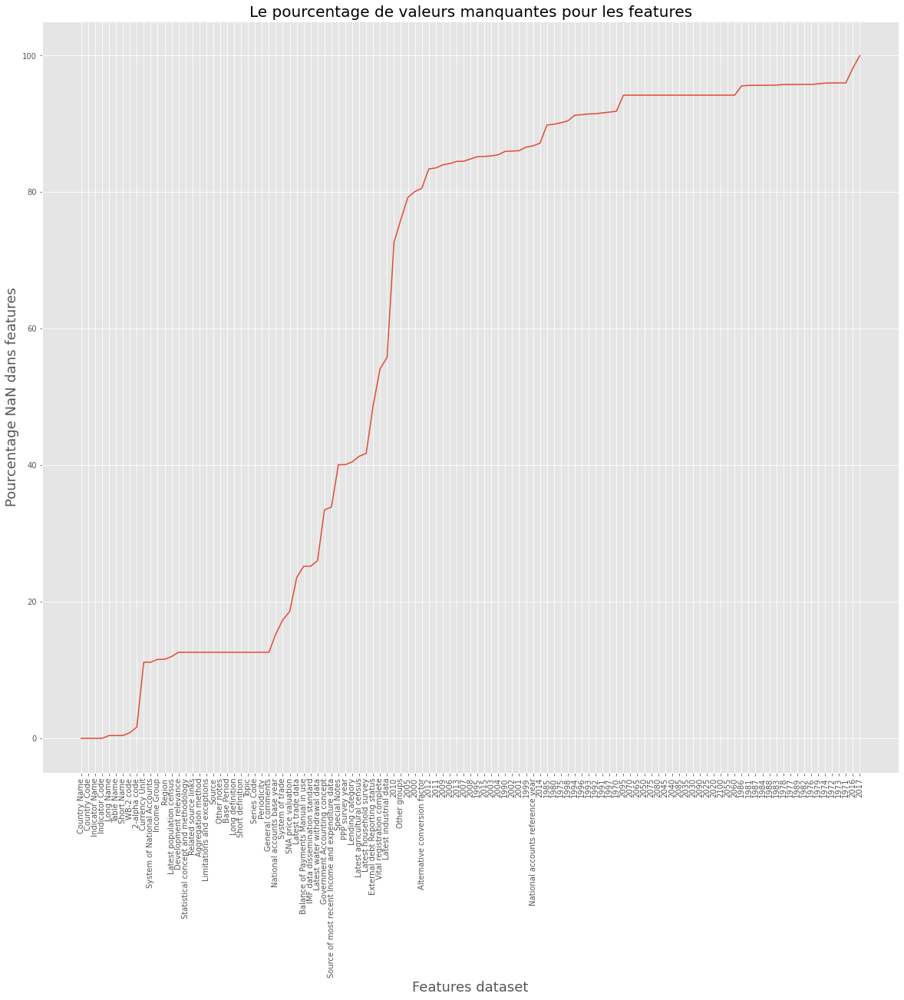

,Pct_NaN_colonne
2017,99.983877
2016,98.144160
1971,95.993258
1973,95.992356
1972,95.984012
1974,95.971497
1979,95.849842
1976,95.773849
1982,95.770692
1989,95.767422


In [ ]:
# Graphique pour voir le pourcentage de valeurs manquantes pour les colonnes 
def plot_pourcentage_NaN_features(df):
    plt.style.use('ggplot')
    plt.figure(figsize=(20,18))
    plt.title('Le pourcentage de valeurs manquantes pour les features', size=20)
    plt.plot((df.isna().sum()/df.shape[0]*100).sort_values(ascending=True))
    plt.xlabel('Features dataset', fontsize=18)
    plt.ylabel('Pourcentage NaN dans features', fontsize=18)
    plt.xticks(rotation = 90) # Rotates X-Axis Ticks by 45-degrees
    plt.show()

    pct_dataset = pd.DataFrame((df.isna().sum()/df.shape[0]*100).sort_values(ascending=False))
    pct_dataset = pct_dataset.rename(columns={0:'Pct_NaN_colonne'})
    pct_dataset = pct_dataset.style.background_gradient(cmap='YlOrRd')
    return pct_dataset

plot_pourcentage_NaN_features(df_fusion)



In [ ]:
# premiere selection des variables pertinentes
df_fusion1 = df_fusion.iloc[:,:75]
df_fusion1.drop('Short definition', axis=1, inplace=True)
df_fusion1

,Country Name,Country Code,Series Code,Topic,Indicator Name,Indicator Code,Long definition,Region,Income Group,1970,1971,1972,1973,1974,1975,1976,1977,1978,1979,1980,1981,1982,1983,1984,1985,1986,1987,1988,1989,1990,1991,1992,1993,1994,1995,1996,1997,1998,1999,2000,2001,2002,2003,2004,2005,2006,2007,2008,2009,2010,2011,2012,2013,2014,2015,2016,2017,2020,2025,2030,2035,2040,2045,2050,2055,2060,2065,2070,2075,2080,2085,2090,2095,2100
0,Arab World,ARB,UIS.NERA.2,Secondary,"Adjusted net enrolment rate, lower secondary, ...",UIS.NERA.2,Total number of students of the official lower...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,Arab World,ARB,UIS.NERA.2.F,Secondary,"Adjusted net enrolment rate, lower secondary, ...",UIS.NERA.2.F,Total number of female students of the officia...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,Arab World,ARB,UIS.NERA.2.GPI,Secondary,"Adjusted net enrolment rate, lower secondary, ...",UIS.NERA.2.GPI,Ratio of female adjusted net enrolment rate fo...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,Arab World,ARB,UIS.NERA.2.M,Secondary,"Adjusted net enrolment rate, lower secondary, ...",UIS.NERA.2.M,Total number of male students of the official ...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,Arab World,ARB,SE.PRM.TENR,Primary,"Adjusted net enrolment rate, primary, both sex...",SE.PRM.TENR,Total number of students of the official prima...,NaN,NaN,54.82212,54.89414,56.20944,57.26711,57.99114,59.36554,60.99996,61.92268,62.69342,64.38319,65.61777,66.08515,66.60814,67.29045,68.51009,69.03321,69.94491,71.04187,71.69378,71.6991,71.99582,72.60284,70.03272,70.46482,72.64568,71.81176,73.90351,74.4252,75.11082,76.25432,77.24568,78.80052,80.0514,80.80539,81.60706,82.48949,82.68551,83.28034,84.01187,84.19596,85.212,85.24514,86.10167,85.51194,85.32015,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
886925,Zimbabwe,ZWE,UIS.LP.Ag15t24.M,Literacy,"Youth illiterate population, 15-24 years, male...",UIS.LP.AG15T24.M,Total number of males between age 15 and age 2...,Sub-Saharan Africa,Low income,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,47631.00000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,38800.00000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,166679.00000,NaN,NaN,199464.00000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
886926,Zimbabwe,ZWE,SE.ADT.1524.LT.ZS,Literacy,"Youth literacy rate, population 15-24 years, b...",SE.ADT.1524.LT.ZS,Number of people age 15 to 24 years who can bo...,Sub-Saharan Africa,Low income,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,89.02185,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,95.41136,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,90.93070,NaN,NaN,90.42812,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN

## **Supprimer les rows non pertinentes**

- [x] Supprimer les lignes contenant 100% de valeurs manquantes pour les années  
- [x] Vérifier pourcentage valeurs manquantes par ligne 
- [x] Après suppressions  des lignes 357405 lignes et 74 colonnes 

In [ ]:
# il y 74 colonnes 
df_fusion1.shape[1]

74

In [ ]:
# voir les valeurs manquantes pour chaque rows 
nb_cols = pd.DataFrame( df_fusion1.T.isnull().count()).rename(columns={0:'Nb_cols'})
missing_count_rows = pd.DataFrame(df_fusion1.T.isnull().sum()).rename(columns={0:'Count_NaN'})
pct_rows_NaN = pd.DataFrame((df_fusion1.T.isnull().sum()/df_fusion1.T.isnull().count()*100)).rename(columns={0:'Pct_NaN_rows'})
df_rows_NaN = pd.concat([missing_count_rows,nb_cols, pct_rows_NaN], axis=1)
df_rows_NaN = df_rows_NaN.sort_values(by=['Pct_NaN_rows'], ascending=False)
df_rows_NaN

,Count_NaN,Nb_cols,Pct_NaN_rows
35338,70,74,94.594595
25397,70,74,94.594595
25419,70,74,94.594595
25418,70,74,94.594595
25417,70,74,94.594595
...,...,...,...
211237,18,74,24.324324
211238,18,74,24.324324
211239,18,74,24.324324
526402,18,74,24.324324


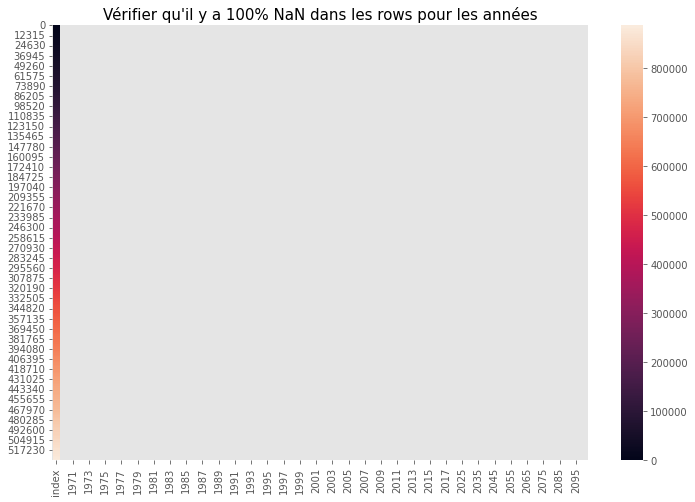

In [ ]:
# Création filtre seulement sur les années pour avoir les rows 100% NaN 
filter_year_NaN = df_fusion1.iloc[:,9:]
plt.figure(figsize=(12,8))
plt.title("Vérifier qu'il y a 100% NaN dans les rows pour les années",size=15)
sns.heatmap(filter_year_NaN[filter_year_NaN.isnull().all(axis=1)].reset_index())

In [ ]:
# List pour supprimer les index avec 100% NaN 
list_index_100_NaN = list(filter_year_NaN[filter_year_NaN.isnull().all(axis=1)].reset_index()['index'])

In [ ]:
# supprimer les rows qui sont dans la liste des rows 100% NaN pour les années
df_drop_row_100_NaN = df_fusion1.reset_index()
df_topic = df_drop_row_100_NaN[~df_drop_row_100_NaN['index'].isin(list_index_100_NaN)]
print("Les dimensions :", df_topic.shape)
df_topic.head()

Les dimensions : (357405, 75)


,index,Country Name,Country Code,Series Code,Topic,Indicator Name,Indicator Code,Long definition,Region,Income Group,1970,1971,1972,1973,1974,1975,1976,1977,1978,1979,1980,1981,1982,1983,1984,1985,1986,1987,1988,1989,1990,1991,1992,1993,1994,1995,1996,1997,1998,1999,2000,2001,2002,2003,2004,2005,2006,2007,2008,2009,2010,2011,2012,2013,2014,2015,2016,2017,2020,2025,2030,2035,2040,2045,2050,2055,2060,2065,2070,2075,2080,2085,2090,2095,2100
4,4,Arab World,ARB,SE.PRM.TENR,Primary,"Adjusted net enrolment rate, primary, both sex...",SE.PRM.TENR,Total number of students of the official prima...,NaN,NaN,54.82212,54.89414,56.209440,57.26711,57.991140,59.365540,60.999960,61.922680,62.693420,64.383190,65.617770,66.08515,66.608140,67.290450,68.51009,69.03321,69.944910,71.041870,71.69378,71.69910,71.995820,72.602840,70.03272,70.46482,72.64568,71.811760,73.90351,74.42520,75.11082,76.254320,77.24568,78.80052,80.05140,80.80539,81.60706,82.48949,82.68551,83.280340,84.01187,84.19596,85.212000,85.24514,86.10167,85.51194,85.32015,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
5,5,Arab World,ARB,SE.PRM.TENR.FE,Primary,"Adjusted net enrolment rate, primary, female (%)",SE.PRM.TENR.FE,Total number of female students of the officia...,NaN,NaN,43.35110,43.31815,44.640700,45.84572,46.449500,48.363890,50.046190,51.245280,52.242320,54.754370,56.486790,57.31466,58.226050,59.289230,60.74818,61.52087,62.734950,64.115880,65.09966,65.12920,65.827490,66.797030,63.26043,63.97211,67.03304,65.761560,68.78080,69.26705,70.43539,72.047290,73.27562,75.13298,76.64102,77.65358,78.48540,79.47577,79.60833,80.582420,81.47380,81.69569,82.871650,82.86139,84.40141,83.91403,83.82083,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
6,6,Arab World,ARB,UIS.NERA.1.GPI,Primary,"Adjusted net enrolment rate, primary, gender p...",UIS.NERA.1.GPI,Ratio of female adjusted net enrolment rate fo...,NaN,NaN,0.65857,0.65640,0.663290,0.67204,0.672610,0.691760,0.699950,0.710140,0.718430,0.743740,0.759440,0.76925,0.779860,0.790710,0.79961,0.80677,0.816060,0.825130,0.83419,0.83476,0.844660,0.854320,0.82649,0.83408,0.85909,0.847310,0.87266,0.87269,0.88494,0.897370,0.90406,0.91275,0.91979,0.92630,0.92768,0.93084,0.92962,0.938460,0.94250,0.94347,0.947620,0.94670,0.96208,0.96409,0.96620,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
7,7,Arab World,ARB,SE.PRM.TENR.MA,Primary,"Adjusted net enrolment rate, primary, male (%)",SE.PRM.TENR.MA,Total number of male students of the official ...,NaN,NaN,65.82623,65.99358,67.301860,68.21908,69.059010,69.914550,71.499510,72.162060,72.717690,73.619970,74.379980,74.50713,74.662630,74.981830,75.97254,76.25549,76.875050,77.703860,78.03937,78.02189,77.933850,78.187490,76.54110,76.69742,78.02813,77.611900,78.81749,79.37204,79.59354,80.287530,81.05137,82.31505,83.32406,83.83223,84.60439,85.38029,85.63508,85.866690,86.44414,86.59069,87.452580,87.52652,87.72817,87.03988,86.75339,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
12,12,Arab World,ARB,UIS.NIRA.1,Primary,Adjusted net intake rate to Grade 1 of primary...,UIS.NIRA.1,Total enrolment in primary education of the of...,NaN,NaN,52.44892,52.48975,52.635593,53.32700,54.184654,54.865627,58.701626,58.876965,59.452522,62.776375,62.559566,62.59433,62.447292,63.409138,65.83738,64.61309,65.926895,66.775635,66.44735,66.93183,67.080444,67.508705,67.65328,67.44469,68.65227,69.208015,68.65168,69.61156,66.86764,68.321686,70.73758,73.59420,74.97616,75.32858,76.42851,76.13177,75.22256,75.595695,74.89394,74.81455,76.197044,76.47497,77.31937,76.56671,76.62057,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


## **Sélections des topics et indicateurs** 

### **Sélectionner les pays et les régions pour l'étude**

- [x] Supprimer les régions et income group dans colonne Country Name
> **Les dimensions (346347, 73) aprés avoir supprimer les régions et income Group dans colonne country**
- [x] Supprimer les colonnes ['Series Code', 'Indicator Code'] car utilisation Indicator Name pour recherche d'indicateur 
- [x] 214 pays dans colonne Country Name 
- [x] 5 Income Group 
- [x] 7 régions
- [x] 32 topics 
- [x] 3665 indicateurs 
- [x] nan dans colonne topic sont des projections 
- [x] 3 pays n'ont pas de correspondances avec Region et Incomne Group ['British Virgin Islands' 'Gibraltar' 'Nauru']


In [ ]:
# voir les colonnes
df_topic.columns

Index(['index', 'Country Name', 'Country Code', 'Series Code', 'Topic',
       'Indicator Name', 'Indicator Code', 'Long definition', 'Region',
       'Income Group', '1970', '1971', '1972', '1973', '1974', '1975', '1976',
       '1977', '1978', '1979', '1980', '1981', '1982', '1983', '1984', '1985',
       '1986', '1987', '1988', '1989', '1990', '1991', '1992', '1993', '1994',
       '1995', '1996', '1997', '1998', '1999', '2000', '2001', '2002', '2003',
       '2004', '2005', '2006', '2007', '2008', '2009', '2010', '2011', '2012',
       '2013', '2014', '2015', '2016', '2017', '2020', '2025', '2030', '2035',
       '2040', '2045', '2050', '2055', '2060', '2065', '2070', '2075', '2080',
       '2085', '2090', '2095', '2100'],
      dtype='object')

In [ ]:
#Supprimer les colonnes Series Code et Indicator Code
df_topic.drop(['Series Code', 'Indicator Code'], axis=1 , inplace=True)

In [ ]:
# voir les valeurs uniques pour Coutry Name
# Il y a des zones géographiques , group income dans colonne Country Name
df_topic['Country Name'].unique()

array(['Arab World', 'East Asia & Pacific',
       'East Asia & Pacific (excluding high income)', 'Euro area',
       'Europe & Central Asia',
       'Europe & Central Asia (excluding high income)', 'European Union',
       'Heavily indebted poor countries (HIPC)', 'High income',
       'Latin America & Caribbean',
       'Latin America & Caribbean (excluding high income)',
       'Least developed countries: UN classification',
       'Low & middle income', 'Low income', 'Lower middle income',
       'Middle East & North Africa',
       'Middle East & North Africa (excluding high income)',
       'Middle income', 'North America', 'OECD members', 'South Asia',
       'Sub-Saharan Africa', 'Sub-Saharan Africa (excluding high income)',
       'Upper middle income', 'World', 'Afghanistan', 'Albania',
       'Algeria', 'American Samoa', 'Andorra', 'Angola',
       'Antigua and Barbuda', 'Argentina', 'Armenia', 'Aruba',
       'Australia', 'Austria', 'Azerbaijan', 'Bahamas, The', 'Bahrain',


In [ ]:
# J'ai seulement utiliser la la list_regions qui élimine les zones, income groupe qui ne sont pas des pays (colonne Country Name )

#Création liste supprimer nan
list_regions = list(df_topic['Region'].unique())
list_regions.pop(0)
print(f'Le nombre de région dans la liste : {len(list_regions)}')
print(f'Régions : {list_regions}')
print('')

#Création liste supprimer nan qui correspond à des projections 
list_topics = list(df_topic['Topic'].unique())
list_topics.pop(6)

print(f'Le nombre de topic dans la liste : {len(list_topics)}')
print(f'Topics:{list_topics}')
print('')
#Création liste supprimer nan
list_income_group = list(df_topic['Income Group'].unique())
list_income_group.pop(0)

print(f'Le nombre de group income dans la liste : {len(list_income_group)}')
print(f'income group : {list_income_group}')
print('')


# liste pays avec nan 
list_pays = list(df_topic['Country Name'].unique())
list_pays

print(f'Le nombre de (pays, regions, zone géo) dans la liste : {len(list_pays)}')
print(f'Country Name  : {list_pays}')


#Voir les valeurs uniques pour colonne region avec NaN et les country name 
print('')
print("Le nombre de country name avec region NAN dans la liste :", len(df_topic[df_topic['Region'].isnull()]['Country Name'].unique()))
print(df_topic[df_topic['Region'].isnull()]['Country Name'].unique())

Le nombre de région dans la liste : 7
Régions : ['South Asia', 'Europe & Central Asia', 'Middle East & North Africa', 'East Asia & Pacific', 'Sub-Saharan Africa', 'Latin America & Caribbean', 'North America']

Le nombre de topic dans la liste : 32
Topics:['Primary', 'Literacy', 'Secondary', 'Early Childhood Education', 'Tertiary', 'Post-Secondary/Non-Tertiary', 'Economic Policy & Debt: National accounts: US$ at current prices: Aggregate indicators', 'Economic Policy & Debt: Purchasing power parity', 'Economic Policy & Debt: National accounts: Atlas GNI & GNI per capita', 'Pre-Primary', 'Infrastructure: Communications', 'Social Protection & Labor: Labor force structure', 'Teachers', 'Health: Population: Dynamics', 'Population', 'Health: Population: Structure', 'Health: Risk factors', 'Expenditures', 'Attainment', 'Education Equality', 'Background', 'Education Management Information Systems (SABER)', 'Learning Outcomes', 'Early Child Development (SABER)', 'EMIS', 'Student Assessment (SAB

In [ ]:
# voir fin df 
df_topic.tail()

,index,Country Name,Country Code,Topic,Indicator Name,Long definition,Region,Income Group,1970,1971,1972,1973,1974,1975,1976,1977,1978,1979,1980,1981,1982,1983,1984,1985,1986,1987,1988,1989,1990,1991,1992,1993,1994,1995,1996,1997,1998,1999,2000,2001,2002,2003,2004,2005,2006,2007,2008,2009,2010,2011,2012,2013,2014,2015,2016,2017,2020,2025,2030,2035,2040,2045,2050,2055,2060,2065,2070,2075,2080,2085,2090,2095,2100
886925,886925,Zimbabwe,ZWE,Literacy,"Youth illiterate population, 15-24 years, male...",Total number of males between age 15 and age 2...,Sub-Saharan Africa,Low income,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,47631.00000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,38800.00000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,166679.00000,NaN,NaN,199464.00000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
886926,886926,Zimbabwe,ZWE,Literacy,"Youth literacy rate, population 15-24 years, b...",Number of people age 15 to 24 years who can bo...,Sub-Saharan Africa,Low income,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,89.02185,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,95.41136,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,90.93070,NaN,NaN,90.42812,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
886927,886927,Zimbabwe,ZWE,Literacy,"Youth literacy rate, population 15-24 years, f...",Number of females age 15 to 24 years who can b...,Sub-Saharan Africa,Low income,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,84.81224,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,94.35344,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,92.12456,NaN,NaN,93.18835,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
886928,886928,Zimbabwe,ZWE,Literacy,"Youth literacy rate, population 15-24 years, g...",Ratio of female youth literacy rate to male yo...,Sub-Saharan Africa,Low income,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.90392,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.97734,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.02828,NaN,NaN,1.06389,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
886929,886929,Zimbabwe,ZWE,Literacy,"Youth literacy rate, population 15-24 years, m...",Number of males age 15 to 24 years who can bot...,Sub-Saharan Africa,Low income,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,93.82696,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,96.54062,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,89.59058,NaN,NaN,87.59186,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [ ]:
#Création df avec les régions sans nan
df_topic1 = df_topic[df_topic['Region'].isin(list_regions)]
print("Les dimensions aprés nettoyage :", df_topic1.shape)
print("Le nombre de pays uniquement est de :", df_topic1['Country Name'].nunique())
print("Le nombre de Régions est de :",df_topic1['Region'].nunique())
print("Le nombre de Topics est de :",df_topic1['Topic'].nunique())
print("Le nombre de Income Group est de :",df_topic1['Income Group'].nunique())
print("Le nombre de Indicator Name est de :",df_topic1['Indicator Name'].nunique())
df_topic1

Les dimensions aprés nettoyage : (347348, 73)
Le nombre de pays uniquement est de : 214
Le nombre de Régions est de : 7
Le nombre de Topics est de : 32
Le nombre de Income Group est de : 5
Le nombre de Indicator Name est de : 3665


,index,Country Name,Country Code,Topic,Indicator Name,Long definition,Region,Income Group,1970,1971,1972,1973,1974,1975,1976,1977,1978,1979,1980,1981,1982,1983,1984,1985,1986,1987,1988,1989,1990,1991,1992,1993,1994,1995,1996,1997,1998,1999,2000,2001,2002,2003,2004,2005,2006,2007,2008,2009,2010,2011,2012,2013,2014,2015,2016,2017,2020,2025,2030,2035,2040,2045,2050,2055,2060,2065,2070,2075,2080,2085,2090,2095,2100
91625,91625,Afghanistan,AFG,Secondary,"Adjusted net enrolment rate, lower secondary, ...",Total number of students of the official lower...,South Asia,Low income,NaN,NaN,NaN,NaN,7.05911,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,17.26019,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,28.05987,NaN,NaN,NaN,NaN,NaN,47.43679,50.62723,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
91626,91626,Afghanistan,AFG,Secondary,"Adjusted net enrolment rate, lower secondary, ...",Total number of female students of the officia...,South Asia,Low income,NaN,NaN,NaN,NaN,2.53138,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,9.43181,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,15.22310,NaN,NaN,NaN,NaN,NaN,34.07326,37.64154,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
91627,91627,Afghanistan,AFG,Secondary,"Adjusted net enrolment rate, lower secondary, ...",Ratio of female adjusted net enrolment rate fo...,South Asia,Low income,NaN,NaN,NaN,NaN,0.22154,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.38623,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.37913,NaN,NaN,NaN,NaN,NaN,0.56706,0.59837,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
91628,91628,Afghanistan,AFG,Secondary,"Adjusted net enrolment rate, lower secondary, ...",Total number of male students of the official ...,South Asia,Low income,NaN,NaN,NaN,NaN,11.42652,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,24.42043,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,40.15285,NaN,NaN,NaN,NaN,NaN,60.08706,62.90695,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
91631,91631,Afghanistan,AFG,Primary,"Adjusted net enrolment rate, primary, gender p...",Ratio of female adjusted net enrolment rate fo...,South Asia,Low income,NaN,NaN,NaN,NaN,0.19066,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.35184,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
886925,886925,Zimbabwe,ZWE,Literacy,"Youth illiterate population, 15-24 years, male...",Total number of males between age 15 and age 2...,Sub-Saharan Africa,Low income,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,47631.00000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,38800.00000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,166679.00000,NaN,NaN,199464.00000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
886926,886926,Zimbabwe,ZWE,Literacy,"Youth literacy rate, population 15-24 years, b...",Number of people age 15 to 24 years who can bo...,Sub-Saharan Africa,Low income,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,89.02185,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,95.41136,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,90.93070,NaN,NaN,90.42812,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
886927,886927,Zimbabwe,ZWE,Literacy,"Youth literacy rate, population 15-24 years, f...",Number of females age 15 to 24 years who can b...,Sub-Saharan Africa,Low income,NaN

### **Sélectionner les topics et indicateurs de la WORLD BANK**

- [x] Recherche indicateurs et topics sur World bank 

------------------------------------------------------------------
 
 **- Les topics et indicateurs trouvés sur la world bank :**

<font color=blue>Expenditures (8) : </font>

- <font color=red>Government expenditure on secondary education, US$ (millions)</font>

Dépenses publiques pour l'enseignement secondaire, US$ (millions)


- <font color=red>Government expenditure on tertiary education, US$ (millions)</font>

Dépenses publiques pour l'enseignement supérieur, US$ (millions)

- <font color=red>Government expenditure on post-secondary non-tertiary education, US$ (millions)</font>

Dépenses publiques pour l'enseignement post-secondaire non supérieur, US$ (millions)

 - <font color=red>Government expenditure on education not specified by level, US$ (millions)</font>

Dépenses publiques pour l'éducation non spécifiées par niveau, US$ (millions)


- <font color=red>Initial household funding per secondary student as a percentage of GDP per capita</font>

Financement initial des ménages par élève du secondaire en pourcentage du PIB par habitant

- <font color=red>Initial household funding per secondary student, constant PPP$</font>

Financement initial du ménage par élève du secondaire, PPA$ constant
 
- <font color=red>Initial household funding per tertiary student as a percentage of GDP per capita</font>

Financement initial des ménages par étudiant de l'enseignement supérieur en pourcentage du PIB par habitant

- <font color=red>Initial household funding per tertiary student, constant PPP$</font> 

Financement initial du ménage par étudiant de l'enseignement supérieur, PPA$ constant


<font color=blue>Background (4) : </font>


- <font color=red>GDP per capita (current US$)</font> 

PIB par habitant (US$ courants)

- <font color=red>GDP per capita, PPP (current international $)</font> 

PIB par habitant, PPA (dollars internationaux courants)

- <font color=red>Internet users (per 100 people)</font> 

Internautes (pour 100 personnes)

- <font color=red>Personal computers (per 100 people)</font> 

Ordinateurs personnels (pour 100 personnes)
 
 

<font color=blue> Secondary (8) : </font> 

- <font color=red>Enrolment in lower secondary education, both sexes (number)</font> 

Inscriptions dans l'enseignement secondaire inférieur, les deux sexes (nombre)

- <font color=red> Enrolment in upper secondary education, both sexes (number)</font> 

Inscriptions dans l'enseignement secondaire supérieur, les deux sexes (nombre)

- <font color=red>Gross enrolment ratio, lower secondary, both sexes (%)</font> 

Taux brut de scolarisation, premier cycle du secondaire, les deux sexes (%)

- <font color=red>Gross enrolment ratio, secondary, both sexes (%)</font> 

Taux brut de scolarisation, secondaire, les deux sexes (%)

- <font color=red>Gross enrolment ratio, upper secondary, both sexes (%)</font>

 Taux brut de scolarisation, deuxième cycle du secondaire, les deux sexes (%)



 - <font color=red>Out-of-school adolescents and youth of secondary school age, both sexes (number)</font>


 Adolescents non scolarisés et jeunes d'âge scolaire secondaire, des deux sexes (nombre)

 - <font color=red> Repeaters in lower secondary general education, all grades, both sexes (number)</font>

Redoublants dans l'enseignement secondaire inférieur général, tous niveaux, les deux sexes (nombre)

 - <font color=red> Repetition rate in lower secondary general education (all grades), both sexes (%)</font>

Taux de redoublement dans l'enseignement secondaire inférieur (toutes classes confondues), les deux sexes (%)



<font color= blue> Tertiary (6) :</font> 

- <font color=red>  Enrolment in tertiary education, all programmes, both sexes (number)
</font> 

Inscriptions dans l'enseignement supérieur, tous programmes confondus, des deux sexes (nombre)


- <font color=red> Gross attendance ratio for tertiary education, both sexes(%)</font> 

Taux brut de fréquentation de l'enseignement supérieur, les deux sexes (%)




- <font color=red>Gross enrolment ratio for tertiary education, both sexes (%)</font> 

Taux brut de scolarisation dans l'enseignement supérieur, les deux sexes (%)


- <font color=red>  Inbound mobility rate, both sexes (%)</font> 


Taux de mobilité entrante, les deux sexes (%)


- <font color=red>Outbound mobility ratio, all regions, both sexes (%)</font> 
 
Taux de mobilité sortante, toutes régions, les deux sexes (%)


- <font color=red> Percentage of enrolment in tertiary education in private institutions (%)</font> 

Pourcentage d'inscriptions dans l'enseignement supérieur dans les établissements privés (%)


<font color= blue>Attainment (6) : </font> 


- <font color=red>UIS: Percentage of population age 25+ with at least completed upper secondary education (ISCED 3 or higher). Total</font> 


ISU : Pourcentage de la population de 25 ans et plus ayant au moins terminé le deuxième cycle de l'enseignement secondaire (CITE 3 ou plus). Le total


- <font color=red>UIS: Percentage of population age 25+ whose highest level of education is post-secondary non-tertiary, both sexes</font>

ISU : Pourcentage de la population de 25 ans et plus dont le plus haut niveau d'éducation est post-secondaire non supérieur, les deux sexes



- <font color=red>UIS: Percentage of population age 25+ whose highest level of education is primary, both sexes</font>

ISU : Pourcentage de la population de 25 ans et plus dont le plus haut niveau d'éducation est primaire, les deux sexes

- <font color=red>UIS: Percentage of population age 25+ whose highest level of education is upper secondary, both sexes</font>


ISU : Pourcentage de la population de 25 ans et plus dont le niveau d'éducation le plus élevé est le deuxième cycle du secondaire, les deux sexes


- <font color=red> UIS: Percentage of population age 25+ with at least a completed bachelor's or equivalent degree (ISCED 6 or higher). Total</font>

ISU : pourcentage de la population âgée de 25 ans et plus possédant au moins un baccalauréat ou un diplôme équivalent (CITE 6 ou supérieur). Le total


- <font color=red> UIS: Percentage of population age 25+ with at least completed lower secondary education (ISCED 2 or higher). Total</font>

ISU : Pourcentage de la population de 25 ans et plus ayant au moins terminé le premier cycle du secondaire (CITE 2 ou plus). Le total

<font color= blue> Population (8) : </font>  

- <font color=red>Population, total</font>

- <font color=red> Population growth (annual %)</font>
 
Croissance démographique (% annuel)


- <font color=red>  School age population, last grade of primary education, both sexes (number)</font>


Population d'âge scolaire, dernière année de l'enseignement primaire, les deux sexes (nombre)

- <font color=red>School age population, lower secondary education, both sexes (number)</font>


Population d'âge scolaire, enseignement secondaire inférieur, les deux sexes (nombre)


- <font color=red> School age population, post-secondary non-tertiary education, both sexes (number)</font>

Population d'âge scolaire, enseignement postsecondaire non supérieur, les deux sexes (nombre)


 
- <font color=red> School age population, secondary education, both sexes (number)</font>


Population d'âge scolaire, enseignement secondaire, les deux sexes (nombre)

- <font color=red> School age population, tertiary education, both sexes (number)</font>


 Population d'âge scolaire, enseignement supérieur, les deux sexes (nombre)

- <font color=red> School age population, upper secondary education, both sexes (number)</font>

Population d'âge scolaire, enseignement secondaire supérieur, les deux sexes (nombre)

<font color=blue> Education Equality (2) :</font>

- <font color=red>DHS: Secondary completion rate. Urban</font>


DHS : Taux d'achèvement du secondaire. Urbain
 

- <font color=red>DHS: Transition rate. Primary to Secondary. Urban</font>

EDS : taux de transition. Primaire à Secondaire. Urbain




  ----------------  7 Topics sur world Bank  ----------------------------------



#### **Les topics les plus représentés dans le dataset**

- [x] Vérifier les topics les plus représentés dans le dataset 


> **Nan 19% (topic anonyme),**
**Attainment 17%**
**Population 8.9%**                                                                         
**Education Equality 7.2%**                                                                     
**Tertiary 6.7%**                                                                               
**Learning Outcomes  6.3%**                                                                    
**Expenditures  3.6%**                                                                        


- [x] Dans la colonne Topic nan correspond à des projections de 2020 à 2100 (Attainement)

> Les annnées 2010 et 2015 extrement bien renseignées



- [x] Vérifier Topics Non-null et null selon les années 


- [X] Attainement non-null périodique selon les années (5 ans) 

> **La dernière année la plus renseigné est 2010** 




In [ ]:
# Traduction des topics 

from deep_translator import GoogleTranslator

to_translate = list_topics
list_traduct = []

for topic in to_translate:
    list_traduct.append(GoogleTranslator(source='auto', target='fr').translate(topic))


#Création dictionnaire keys : fr , values : english
dict_traduct = dict(zip(list_traduct,list_topics))
print(dict_traduct)



{'Primaire': 'Primary', "L'alphabétisation": 'Literacy', 'Secondaire': 'Secondary', "L'éducation de la petite enfance": 'Early Childhood Education', 'Tertiaire': 'Tertiary', 'Post-secondaire/non-supérieur': 'Post-Secondary/Non-Tertiary', 'Politique économique et dette : Comptes nationaux : $ US à prix courants : Indicateurs agrégés': 'Economic Policy & Debt: National accounts: US$ at current prices: Aggregate indicators', "Politique économique et dette\xa0: parité de pouvoir d'achat": 'Economic Policy & Debt: Purchasing power parity', 'Politique économique et dette : Comptes nationaux : Atlas RNB & RNB par habitant': 'Economic Policy & Debt: National accounts: Atlas GNI & GNI per capita', 'Pré-primaire': 'Pre-Primary', 'Infrastructures\xa0: Communications': 'Infrastructure: Communications', "Protection sociale et travail\xa0: structure de la main-d'œuvre": 'Social Protection & Labor: Labor force structure', 'Enseignants': 'Teachers', 'Santé : Population : Dynamique': 'Health: Populatio

In [ ]:
# remplacer nan(float) par NaN (str) 
############################################# Note important : ne pas oublier df_topic_NaN_STR car les nan sont transformer en STR###############################################################################################################
df_topic_NaN_STR = df_topic1.fillna('NaN')

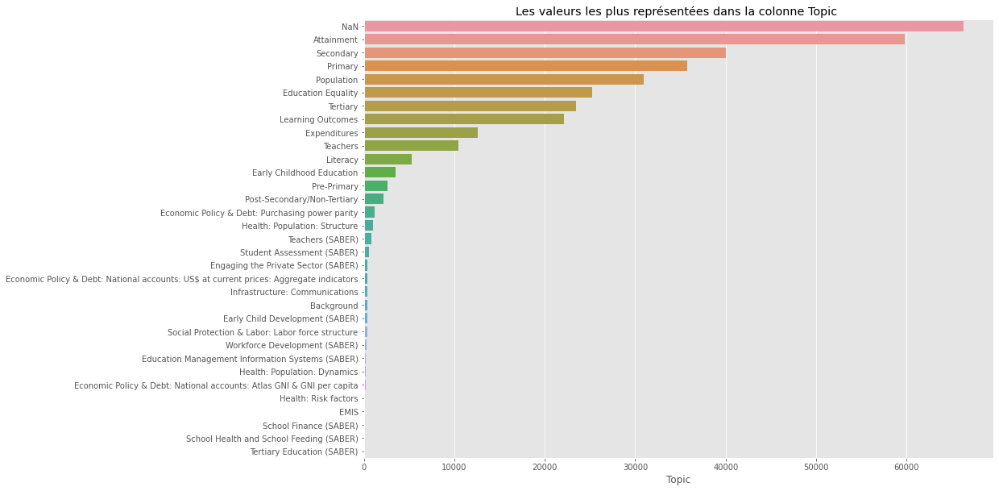

In [ ]:
# fonction pour compter les valeurs les plus représentées dans une colonne 
def value_counts_col(df, col):
  data = df[col].value_counts(dropna=False)
  plt.figure(figsize=(14,10))
  plt.title(f'Les valeurs les plus représentées dans la colonne {col} ')
  sns.barplot(y = data.index, x = data, orient='h')
  print('')
# voir les valeurs les plus représentées dans le EdStatsCountry
# sélectionner les noms des colonnes choisis 
list_columns=['Topic']
for col in list_columns:
  value_counts_col(df_topic_NaN_STR,col)

In [ ]:
# voir le poucentage des topics les plus représentatif de la colonne Topic
df_topic1['Topic'].value_counts(normalize=True, dropna=False)*100

NaN                                                                                       19.079425
Attainment                                                                                17.227392
Secondary                                                                                 11.516404
Primary                                                                                   10.290544
Population                                                                                 8.909221
Education Equality                                                                         7.263033
Tertiary                                                                                   6.743093
Learning Outcomes                                                                          6.372284
Expenditures                                                                               3.630077
Teachers                                                                                   2.996706


In [ ]:
# voir topic NaN (str) pour vérifier qu'est ce que cela contient 
df_topic_NaN_STR[df_topic_NaN_STR['Topic']== 'NaN']['Indicator Name'].unique()

array(['GDP at market prices (constant 2005 US$)',
       'GDP at market prices (current US$)',
       'GDP per capita (constant 2005 US$)',
       'Mortality rate, under-5 (per 1,000)', 'Population, age 0, female',
       'Population, age 0, total', 'Population, age 1, female',
       'Population, age 1, total', 'Population, age 10, female',
       'Population, age 10, total', 'Population, age 11, female',
       'Population, age 11, total', 'Population, age 12, female',
       'Population, age 12, total', 'Population, age 13, female',
       'Population, age 13, total', 'Population, age 14, female',
       'Population, age 14, total', 'Population, age 15, female',
       'Population, age 15, total', 'Population, age 16, female',
       'Population, age 16, total', 'Population, age 17, female',
       'Population, age 17, total', 'Population, age 18, female',
       'Population, age 18, total', 'Population, age 19, female',
       'Population, age 19, total', 'Population, age 2, femal

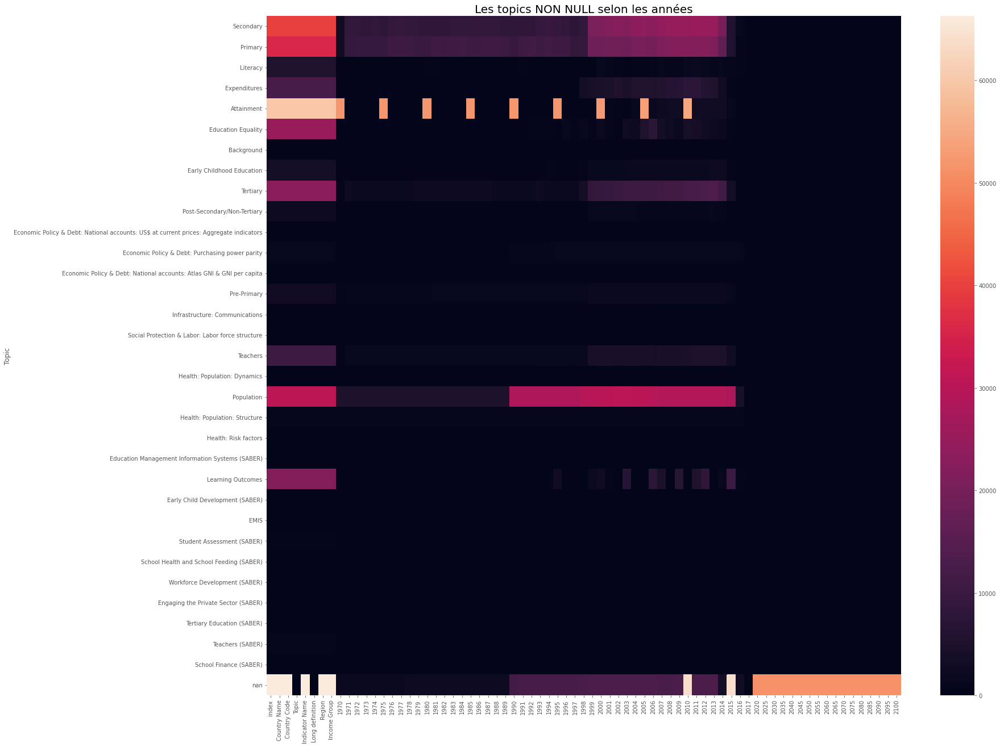

In [ ]:
# Les valeurs notnull grouper par topics
# NaN = projection d'indicateurs 
plt.figure(figsize=(25,22))
plt.title('Les topics NON NULL selon les années', size=20)
sns.heatmap(df_topic1.notnull().groupby(df_topic1['Topic'], sort=False, dropna=False).sum())

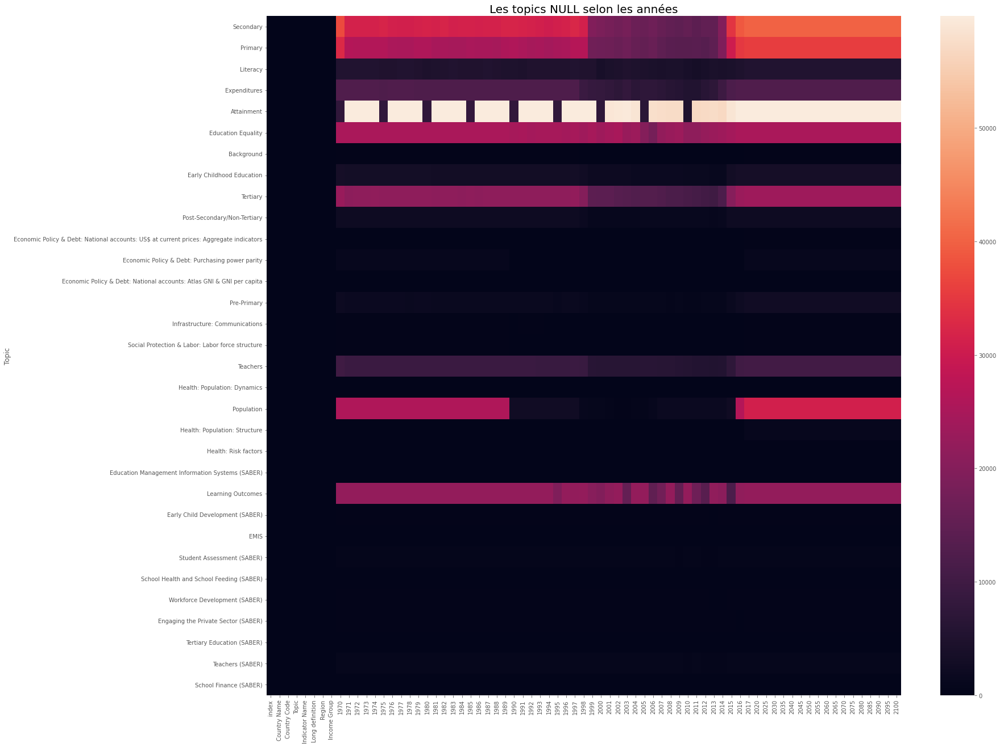

In [ ]:
# heatmap des topics null selon les années 
plt.figure(figsize=(25,22))
plt.title('Les topics NULL selon les années', size=20)
sns.heatmap(df_topic1.isnull().groupby(df_topic1['Topic'], sort=False).sum())

#### **Trouver les topics et indicateurs de la WORLD BANK dans dataset**
- [x] Chercher les indicateurs et topics trouvés qui proviennent de la World Bank dans le dataset


- [x] 7 topics et 42 indicateurs qui proviennent de la Worlbank

> **20 indicateurs trouvés seulement dans le dataset**

> **22 indicateurs non trouvés**


In [ ]:
# voir les topics uniques 
df_topic1['Topic'].unique()

array(['Secondary', 'Primary', 'Literacy', 'Expenditures', 'Attainment',
       'Education Equality', 'Background', 'Early Childhood Education',
       'Tertiary', 'Post-Secondary/Non-Tertiary', nan,
       'Economic Policy & Debt: National accounts: US$ at current prices: Aggregate indicators',
       'Economic Policy & Debt: Purchasing power parity',
       'Economic Policy & Debt: National accounts: Atlas GNI & GNI per capita',
       'Pre-Primary', 'Infrastructure: Communications',
       'Social Protection & Labor: Labor force structure', 'Teachers',
       'Health: Population: Dynamics', 'Population',
       'Health: Population: Structure', 'Health: Risk factors',
       'Education Management Information Systems (SABER)',
       'Learning Outcomes', 'Early Child Development (SABER)', 'EMIS',
       'Student Assessment (SABER)',
       'School Health and School Feeding (SABER)',
       'Workforce Development (SABER)',
       'Engaging the Private Sector (SABER)',
       'Tertiary 

In [ ]:
# les listes des topics trouvés sur WORLD BANK
print(colored("Il y a 7 TOPICS et 42 INDICATEURS (WORLD BANK):", 'red'))


Expenditures= ['Government expenditure on secondary education, US$ (millions)','Government expenditure on tertiary education, US$ (millions)','Government expenditure on post-secondary non-tertiary education, US$ (millions)','Government expenditure on education not specified by level, US$ (millions)',
                   'Initial household funding per secondary student as a percentage of GDP per capita','Initial household funding per secondary student, constant PPP$','Initial household funding per tertiary student as a percentage of GDP per capita','Initial household funding per tertiary student, constant PPP$']


Background = ['GDP per capita (current US$)','GDP per capita, PPP (current international $)','Internet users (per 100 people)','Personal computers (per 100 people)']


Secondary = ['Enrolment in lower secondary education, both sexes (number)','Enrolment in upper secondary education, both sexes (number)','Gross enrolment ratio, lower secondary, both sexes (%)','Gross enrolment ratio, secondary, both sexes (%)',
                'Gross enrolment ratio, upper secondary, both sexes (%)','Out-of-school adolescents and youth of secondary school age, both sexes (number)','Repeaters in lower secondary general education, all grades, both sexes (number)',
                'Repetition rate in lower secondary general education (all grades), both sexes (%)']


Tertiary = ['Enrolment in tertiary education, all programmes, both sexes (number)','Gross attendance ratio for tertiary education, both sexes(%)','Gross enrolment ratio for tertiary education, both sexes (%)','Inbound mobility rate, both sexes (%)',
            'Outbound mobility ratio, all regions, both sexes (%)','Percentage of enrolment in tertiary education in private institutions (%)']


Attainment = ["UIS: Percentage of population age 25+ with at least completed upper secondary education (ISCED 3 or higher). Total","UIS: Percentage of population age 25+ whose highest level of education is post-secondary non-tertiary, both sexes","UIS: Percentage of population age 25+ whose highest level of education is primary, both sexes","UIS: Percentage of population age 25+ whose highest level of education is upper secondary, both sexes",
              "UIS: Percentage of population age 25+ with at least a completed bachelor's or equivalent degree (ISCED 6 or higher). Total","UIS: Percentage of population age 25+ with at least completed lower secondary education (ISCED 2 or higher). Total"]


Population = ["Population, total","Population growth (annual %)","School age population, last grade of primary education, both sexes (number)","School age population, lower secondary education, both sexes (number)","School age population, post-secondary non-tertiary education, both sexes (number)",
             "School age population, secondary education, both sexes (number)","School age population, tertiary education, both sexes (number)","School age population, upper secondary education, both sexes (number)"]


Education_Equality = ["DHS: Secondary completion rate. Urban","DHS: Transition rate. Primary to Secondary. Urban"]


#Adjusted net enrolment rate, lower secondary, both sexes (%)
#Cumulative drop-out rate to the last grade of lower secondary general education, both sexes (%)

#Création dictionnaire pour compter les indicateurs dans chaque liste des topics

dict_topics= {'Expenditures':Expenditures,'Background': Background, 'Secondary': Secondary, 'Tertiary': Tertiary, 'Attainment': Attainment, 'Population': Population, 'Education_Equality': Education_Equality}

for topic, ind in dict_topics.items():

  print(f"Le nombre d'indicateurs trouvés sur la world bank pour {colored(topic,'red')} : ", len(ind))


  

Il y a 7 TOPICS et 42 INDICATEURS (WORLD BANK):
Le nombre d'indicateurs trouvés sur la world bank pour Expenditures :  8
Le nombre d'indicateurs trouvés sur la world bank pour Background :  4
Le nombre d'indicateurs trouvés sur la world bank pour Secondary :  8
Le nombre d'indicateurs trouvés sur la world bank pour Tertiary :  6
Le nombre d'indicateurs trouvés sur la world bank pour Attainment :  6
Le nombre d'indicateurs trouvés sur la world bank pour Population :  8
Le nombre d'indicateurs trouvés sur la world bank pour Education_Equality :  2


In [ ]:
#Création dictionnaire pour compter les indicateurs dans chaque liste
# Liste provenant de la World BANK et la liste des indicateurs non trouvés 
list_indicateurs_trouver = []
for topic, ind in dict_topics.items():
  
  print(colored(f"La recherche du topic {topic.upper()} dans le dataset ", 'red'))
  print('')
  print(f"Le nombres d'indicateurs trouvés sur la world bank pour {colored(topic, 'red')}: ", len(ind))
  print('')
  print(f"Le nombres de d'indicateurs trouvés dans le dataset pour {colored(topic, 'blue')} :",df_topic1[df_topic1['Indicator Name'].isin(ind)]['Indicator Name'].nunique())
  print('')
  print("Les indicateurs trouvés : ",df_topic1[df_topic1['Indicator Name'].isin(ind)]['Indicator Name'].unique())
  print('')
  find = df_topic1[df_topic1['Indicator Name'].isin(ind)]['Indicator Name'].unique()
  
  list_indicateurs_trouver.append(find.tolist())
  set_list_a = set(find)
  set_list_b = set(ind)
  print("Les indicateurs qui n’ont pas été trouvés dans le dataset : ", list(set_list_b.difference(set_list_a)))
  print('------------------------------------------------------------------------------------------------------------------------------------------')
  print('')

La recherche du topic EXPENDITURES dans le dataset 

Le nombres d'indicateurs trouvés sur la world bank pour Expenditures:  8

Le nombres de d'indicateurs trouvés dans le dataset pour Expenditures : 0

Les indicateurs trouvés :  []

Les indicateurs qui n’ont pas été trouvés dans le dataset :  ['Initial household funding per secondary student as a percentage of GDP per capita', 'Initial household funding per secondary student, constant PPP$', 'Government expenditure on secondary education, US$ (millions)', 'Initial household funding per tertiary student as a percentage of GDP per capita', 'Government expenditure on post-secondary non-tertiary education, US$ (millions)', 'Government expenditure on education not specified by level, US$ (millions)', 'Initial household funding per tertiary student, constant PPP$', 'Government expenditure on tertiary education, US$ (millions)']
-------------------------------------------------------------------------------------------------------------------

In [ ]:
# Les listes des indicateurs trouvés dans le dataset et celle des indicateurs non trouvés
list_ind_find = ['GDP per capita (current US$)','GDP per capita, PPP (current international $)','Internet users (per 100 people)','Personal computers (per 100 people)','Enrolment in lower secondary education, both sexes (number)','Enrolment in upper secondary education, both sexes (number)',
'Gross enrolment ratio, lower secondary, both sexes (%)','Gross enrolment ratio, secondary, both sexes (%)','Gross enrolment ratio, upper secondary, both sexes (%)','Repeaters in lower secondary general education, all grades, both sexes (number)',
'Repetition rate in lower secondary general education (all grades), both sexes (%)','Enrolment in tertiary education, all programmes, both sexes (number)','Outbound mobility ratio, all regions, both sexes (%)','Percentage of enrolment in tertiary education in private institutions (%)',
'Inbound mobility rate, both sexes (%)','UIS: Percentage of population age 25+ with at least completed lower secondary education (ISCED 2 or higher). Total','UIS: Percentage of population age 25+ with at least completed upper secondary education (ISCED 3 or higher). Total',
"UIS: Percentage of population age 25+ with at least a completed bachelor's or equivalent degree (ISCED 6 or higher). Total", 
'Population growth (annual %)','Population, total','DHS: Secondary completion rate. Urban','DHS: Transition rate. Primary to Secondary. Urban']

list_ind_not_find = ["Government expenditure on secondary education, US$ (millions)", "Government expenditure on education not specified by level, US$ (millions)", "Initial household funding per secondary student as a percentage of GDP per capita", "Government expenditure on post-secondary non-tertiary education, US$ (millions)", "Initial household funding per tertiary student as a percentage of GDP per capita", "Initial household funding per secondary student, constant PPP$", "Initial household funding per tertiary student, constant PPP$", "Government expenditure on tertiary education, US$ (millions)",
"Gross attendance ratio for tertiary education, both sexes(%)", "Gross enrolment ratio for tertiary education, both sexes (%)","Out-of-school adolescents and youth of secondary school age, both sexes (number)","UIS: Percentage of population age 25+ whose highest level of education is post-secondary non-tertiary, both sexes", "UIS: Percentage of population age 25+ whose highest level of education is primary, both sexes", "UIS: Percentage of population age 25+ whose highest level of education is upper secondary, both sexes",
"School age population, lower secondary education, both sexes (number)","School age population, tertiary education, both sexes (number)","School age population, last grade of primary education, both sexes (number)", "School age population, post-secondary non-tertiary education, both sexes (number)", "School age population, secondary education, both sexes (number)", "School age population, upper secondary education, both sexes (number)"]
print("La liste des indicateurs non trouvés contient :", len(list_ind_not_find))
print("La liste des indicateurs trouvés contient :", len(list_ind_find))

La liste des indicateurs non trouvés contient : 20
La liste des indicateurs trouvés contient : 22


## **Chercher les indicateurs par groupes de topic**

- [x] Chercher les indicateurs non trouvés qui proviennent de la World Bank dans le dataset

> vérifier occurence des mots les plus fréquent dans le corpus des indicateurs non trouvés 

> Vérifier sous-chaîne dans la colonne Indicator Name

> Grouper les indicateurs par topics pour vérifier les indicateurs pertinents 

- [X] **Chercher d’autres indicateurs pour la problématique**

> **Il y a 58 indicateurs trouvés dans le dataset**



In [ ]:
#Compter les mots les plus fréquents dans le corpus des indicateurs non trouvés

text = "".join(list_ind_not_find)
from collections import Counter
from nltk.tokenize import RegexpTokenizer
import nltk

#text_splited = text.split()

tokenizer = nltk.RegexpTokenizer(r"\w+")
new_words = tokenizer.tokenize(text)

print(new_words)
 
counter = Counter(new_words)
most_occur = counter.most_common(15)
print(most_occur)


['Government', 'expenditure', 'on', 'secondary', 'education', 'US', 'millions', 'Government', 'expenditure', 'on', 'education', 'not', 'specified', 'by', 'level', 'US', 'millions', 'Initial', 'household', 'funding', 'per', 'secondary', 'student', 'as', 'a', 'percentage', 'of', 'GDP', 'per', 'capitaGovernment', 'expenditure', 'on', 'post', 'secondary', 'non', 'tertiary', 'education', 'US', 'millions', 'Initial', 'household', 'funding', 'per', 'tertiary', 'student', 'as', 'a', 'percentage', 'of', 'GDP', 'per', 'capitaInitial', 'household', 'funding', 'per', 'secondary', 'student', 'constant', 'PPP', 'Initial', 'household', 'funding', 'per', 'tertiary', 'student', 'constant', 'PPP', 'Government', 'expenditure', 'on', 'tertiary', 'education', 'US', 'millions', 'Gross', 'attendance', 'ratio', 'for', 'tertiary', 'education', 'both', 'sexes', 'Gross', 'enrolment', 'ratio', 'for', 'tertiary', 'education', 'both', 'sexes', 'Out', 'of', 'school', 'adolescents', 'and', 'youth', 'of', 'secondary',

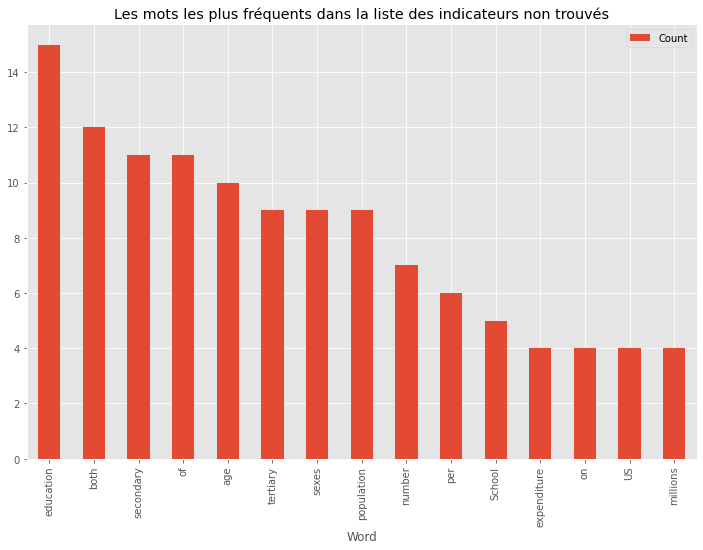

In [ ]:
# barplot pour voir les mots les plus fréquents dans le corpus d'indicateurs non trouvés 
df = pd.DataFrame(most_occur, columns = ['Word', 'Count'])
df.plot.bar(x='Word',y='Count', figsize=(12,8), title='Les mots les plus fréquents dans la liste des indicateurs non trouvés')

In [ ]:
# recherche des indicateurs avec un mot 
df_topic1[df_topic1['Indicator Name'].str.contains('expenditure')]['Indicator Name'].unique()

array(['All staff compensation as % of total expenditure in primary public institutions (%)',
       'All staff compensation as % of total expenditure in public institutions (%)',
       'All staff compensation as % of total expenditure in secondary public institutions (%)',
       'All staff compensation as % of total expenditure in tertiary public institutions (%)',
       'Capital expenditure as % of total expenditure in public institutions (%)',
       'Current expenditure as % of total expenditure in primary public institutions (%)',
       'Current expenditure as % of total expenditure in public institutions (%)',
       'Current expenditure as % of total expenditure in secondary public institutions (%)',
       'Current expenditure as % of total expenditure in tertiary public institutions (%)',
       'Current expenditure other than staff compensation as % of total expenditure in public institutions (%)',
       'Expenditure on education as % of total government expenditure (%)'

In [ ]:
#grouper les indicateurs par topics 

df_groupby_topics = df_topic1.groupby('Topic')

# Rechercher les indicateurs pertinents dans le dataset
pd.set_option("display.max_rows", 1002)

for topic , indicateur in df_groupby_topics['Indicator Name']:

  print("Topic : ", colored(topic, 'red'))
  print('')
  
  print("Le nombre d'indicateur dans le topic :", indicateur.nunique())
  print("Indicateur : ", indicateur.unique())
  print("Indicateur : ", indicateur.dtype)
  print('')
  print('-------------------------------------------------------------------------')
  

Topic :  Attainment

Le nombre d'indicateur dans le topic : 425
Indicateur :  ['Barro-Lee: Average years of primary schooling, age 15+, female'
 'Barro-Lee: Average years of primary schooling, age 15+, total'
 'Barro-Lee: Average years of primary schooling, age 15-19, female'
 'Barro-Lee: Average years of primary schooling, age 15-19, total'
 'Barro-Lee: Average years of primary schooling, age 20-24, female'
 'Barro-Lee: Average years of primary schooling, age 20-24, total'
 'Barro-Lee: Average years of primary schooling, age 25+, female'
 'Barro-Lee: Average years of primary schooling, age 25+, total'
 'Barro-Lee: Average years of primary schooling, age 25-29, female'
 'Barro-Lee: Average years of primary schooling, age 25-29, total'
 'Barro-Lee: Average years of primary schooling, age 30-34, female'
 'Barro-Lee: Average years of primary schooling, age 30-34, total'
 'Barro-Lee: Average years of primary schooling, age 35-39, female'
 'Barro-Lee: Average years of primary schooling, age

In [ ]:
#La liste des indicateurs trouvés par recherche dans dataset
list_ind_search = ['Gross enrolment ratio, tertiary, both sexes (%)','Gross enrolment ratio, post-secondary non-tertiary, both sexes (%)','Gross enrolment ratio, primary to tertiary, both sexes (%)',
                   'Population of the official age for tertiary education, both sexes (number)','Population of the official age for lower secondary education, both sexes (number)','Population of the official age for post-secondary non-tertiary education, both sexes (number)',
                   'Population of the official age for secondary education, both sexes (number)','Enrolment in post-secondary non-tertiary education, private institutions, both sexes (number)','Percentage of enrolment in post-secondary non-tertiary education in private institutions (%)','Enrolment in tertiary education per 100,000 inhabitants, both sexes',
                   'Enrolment in post-secondary non-tertiary education, public institutions, both sexes (number)','Enrolment in tertiary education, all programmes, both sexes (number)','Enrolment in secondary education, both sexes (number)','Graduates from tertiary education, both sexes (number)','Adjusted net enrolment rate, upper secondary, both sexes (%)','Cumulative drop-out rate to the last grade of lower secondary general education, both sexes (%)','Government expenditure per secondary student as % of GDP per capita (%)',
 'Government expenditure per tertiary student as % of GDP per capita (%)','Government expenditure on secondary education as % of GDP (%)','Government expenditure on tertiary education as % of GDP (%)','Expenditure on tertiary as % of total government expenditure (%)','Expenditure on secondary as % of total government expenditure (%)']
print("Les indicateurs trouvés en recherchant dans le datatset :",len(list_ind_search))

Les indicateurs trouvés en recherchant dans le datatset : 22


In [ ]:
Barro_Lee_list = ['Barro-Lee: Percentage of population age 15+ with primary schooling. Completed Primary','Barro-Lee: Percentage of population age 15+ with no education','Barro-Lee: Percentage of population age 15-19 with no education','Barro-Lee: Percentage of population age 15+ with secondary schooling. Completed Secondary','Barro-Lee: Percentage of population age 15+ with secondary schooling. Total (Incomplete and Completed Secondary)',
'Barro-Lee: Percentage of population age 15+ with secondary schooling. Completed Secondary','Barro-Lee: Percentage of population age 15+ with tertiary schooling. Completed Tertiary','Barro-Lee: Percentage of population age 15+ with tertiary schooling. Total (Incomplete and Completed Tertiary)',
'Barro-Lee: Percentage of population age 15-19 with no education','Barro-Lee: Percentage of population age 15-19 with secondary schooling. Completed Secondary','Barro-Lee: Percentage of population age 15-19 with secondary schooling. Total (Incomplete and Completed Secondary)','Barro-Lee: Percentage of population age 15-19 with tertiary schooling. Completed Tertiary',
'Barro-Lee: Percentage of population age 15-19 with tertiary schooling. Total (Incomplete and Completed Tertiary)','Barro-Lee: Percentage of population age 20-24 with secondary schooling. Completed Secondary','Barro-Lee: Percentage of population age 20-24 with secondary schooling. Total (Incomplete and Completed Secondary)',
'Barro-Lee: Percentage of population age 20-24 with tertiary schooling. Completed Tertiary','Barro-Lee: Percentage of population age 20-24 with tertiary schooling. Total (Incomplete and Completed Tertiary)','Barro-Lee: Percentage of population age 15+ with secondary schooling. Completed Secondary','Barro-Lee: Percentage of population age 15+ with secondary schooling. Total (Incomplete and Completed Secondary)',
'Barro-Lee: Percentage of population age 15+ with tertiary schooling. Completed Tertiary','Barro-Lee: Percentage of population age 15+ with tertiary schooling. Total (Incomplete and Completed Tertiary)']

print("Les indicateurs trouvés pour Barro-Lee :", len(set(Barro_Lee_list)))

Les indicateurs trouvés pour Barro-Lee : 15


In [ ]:
# Création liste des indicateurs de world Bank trouvé et les indicateurs recherchés 
list_all_ind = list_ind_search + list_ind_find + Barro_Lee_list
list_all_ind = list(dict.fromkeys(list_all_ind))
print("Le nombre d'indicateurs trouvés est de :", len(list_all_ind))

Le nombre d'indicateurs trouvés est de : 58


### **Définitions des indicateurs trouvés** 

- [x] Verifier les définitions pour chaque indicateurs 

In [ ]:
# itération pour afficher les définitions de chaque indicateurs pré-sélectionnés
for ind in list_all_ind:  
  definition = df_topic1[df_topic1['Indicator Name']== ind].head()['Long definition'].unique()
  print('- DEFINITION ')
  print(f"{colored(ind, 'red')} : {''.join(definition)}")

- DEFINITION 
Gross enrolment ratio, tertiary, both sexes (%) : Total enrollment in tertiary education (ISCED 5 to 8), regardless of age, expressed as a percentage of the total population of the five-year age group following on from secondary school leaving.
- DEFINITION 
Gross enrolment ratio, post-secondary non-tertiary, both sexes (%) : Total enrollment in post-secondary non-tertiary education, regardless of age, expressed as a percentage of the total population of official post-secondary non-tertiary education age.
- DEFINITION 
Gross enrolment ratio, primary to tertiary, both sexes (%) : Total enrollment in primary, secondary and tertiary education, regardless of age, expressed as a percentage of the total population of primary school age, secondary school age, and the five-year age group following on from secondary school leaving. GER can exceed 100% due to the inclusion of over-aged and under-aged students because of early or late school entrance and grade repetition.
- DEFINITI

### Inspecter les valeurs manquantes pour chaque indicateur choisis

- [x] Création nouveau dataframe contenant les indicateurs choisis

> **9540 lignes et 73 colonnes**

> **58 indicateurs à filtrer par rapport au taux remplissage des années** 

- [x] Supprimer les colonnes des années de 2020 à 2100 (projection)


- [x] Afficher heatmap des valeurs non-null pour les indicateurs selon les années (1970 à 2017)


- [x] Barro-lee bien renseigné seulement intervalle 5 ans (derniére annnée 2010)


- [x] **Sélectionner 4 indicateurs en fonction du taux remplissage et les années**

Le choix se porte sur ces 4 indicateurs car meilleur taux remplissage annnée 2014 pour indicateurs choisis:

> 'GDP per capita, PPP (current international $)',

> 'Internet users (per 100 people)',

> 'Population growth (annual %)',

> 'Population of the official age for secondary education, both sexes (number)'



- [x] <font color=red>Sélectionner l'année 2014 pour l'étude statistique</font>


In [ ]:
# Création df avec la liste des indicateurs pré-sélectionnés 
df_filter_ind = df_topic1[df_topic1['Indicator Name'].isin(list_all_ind)]
print("Le nombres d'indicateurs choisis :", df_filter_ind['Indicator Name'].nunique())
df_filter_ind

Le nombres d'indicateurs choisis : 58


,index,Country Name,Country Code,Topic,Indicator Name,Long definition,Region,Income Group,1970,1971,1972,1973,1974,1975,1976,1977,1978,1979,1980,1981,1982,1983,1984,1985,1986,1987,1988,1989,1990,1991,1992,1993,1994,1995,1996,1997,1998,1999,2000,2001,2002,2003,2004,2005,2006,2007,2008,2009,2010,2011,2012,2013,2014,2015,2016,2017,2020,2025,2030,2035,2040,2045,2050,2055,2060,2065,2070,2075,2080,2085,2090,2095,2100
91633,91633,Afghanistan,AFG,Secondary,"Adjusted net enrolment rate, upper secondary, ...",Total number of students of the official upper...,South Asia,Low income,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,31.33262,32.41703,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
91999,91999,Afghanistan,AFG,Attainment,Barro-Lee: Percentage of population age 15+ wi...,Percentage of population age 15+ with no educa...,South Asia,Low income,88.81,NaN,NaN,NaN,NaN,85.74,NaN,NaN,NaN,NaN,82.03,NaN,NaN,NaN,NaN,77.80,NaN,NaN,NaN,NaN,75.04,NaN,NaN,NaN,NaN,73.21,NaN,NaN,NaN,NaN,67.85,NaN,NaN,NaN,NaN,65.73,NaN,NaN,NaN,NaN,58.38,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
92000,92000,Afghanistan,AFG,Attainment,Barro-Lee: Percentage of population age 15+ wi...,Percentage of population age 15+ with primary ...,South Asia,Low income,0.41,NaN,NaN,NaN,NaN,0.54,NaN,NaN,NaN,NaN,0.96,NaN,NaN,NaN,NaN,1.91,NaN,NaN,NaN,NaN,3.60,NaN,NaN,NaN,NaN,5.19,NaN,NaN,NaN,NaN,7.78,NaN,NaN,NaN,NaN,8.80,NaN,NaN,NaN,NaN,12.86,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
92002,92002,Afghanistan,AFG,Attainment,Barro-Lee: Percentage of population age 15+ wi...,Percentage of population age 15+ with secondar...,South Asia,Low income,0.51,NaN,NaN,NaN,NaN,0.74,NaN,NaN,NaN,NaN,1.15,NaN,NaN,NaN,NaN,1.54,NaN,NaN,NaN,NaN,1.81,NaN,NaN,NaN,NaN,2.98,NaN,NaN,NaN,NaN,4.69,NaN,NaN,NaN,NaN,6.56,NaN,NaN,NaN,NaN,8.65,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
92003,92003,Afghanistan,AFG,Attainment,Barro-Lee: Percentage of population age 15+ wi...,Percentage of population age 15+ with secondar...,South Asia,Low income,1.31,NaN,NaN,NaN,NaN,1.85,NaN,NaN,NaN,NaN,2.70,NaN,NaN,NaN,NaN,3.46,NaN,NaN,NaN,NaN,3.84,NaN,NaN,NaN,NaN,6.11,NaN,NaN,NaN,NaN,9.37,NaN,NaN,NaN,NaN,12.69,NaN,NaN,NaN,NaN,16.09,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
885858,885858,Zimbabwe,ZWE,Secondary,Repeaters in lower secondary general education...,Number of pupils in the specified grade who ar...,Sub-Saharan Africa,Low income,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,473.0000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1593.00000,18298.00000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
885898,885898,Zimbabwe,ZWE,Secondary,Repetition rate in lower secondary general edu...,Number of repeaters in lower secondary educati...,Sub-Saharan Africa,Low income,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0373,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,4.01511,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
886479,886479,Zimbabwe,ZWE,Attainment,UIS: Percentage of population age 25+ with at ...,The percentage of population (age 25 and over)...,Sub-Saharan Africa,Low income,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,

In [ ]:
# sauvegarder le df_filter_ind 
df_filter_ind.to_csv('df_filter_INDICATOR_NAME1.csv', index=False)

In [ ]:
# importer le fichier avec les indicateurs pré-sélectionnés 
df_indicator1 = pd.read_csv('/content/drive/MyDrive/Projet+Python_Dataset_Edstats_csv (3)/df_filter_INDICATOR_NAME1.csv')

In [ ]:
# vérifier le df_indicator contiennent 58 indicateurs  
print("Les indicateurs pré-sélectionnés :", df_indicator1['Indicator Name'].nunique())
print("Les dimensions :", df_indicator1.shape)
# supprimer les années de 2020 à 2100 (projections)
df_indicator2 = df_indicator1.iloc[:,1:56]
df_indicator2.head(1)

Les indicateurs pré-sélectionnés : 58
Les dimensions : (9540, 73)


,Country Name,Country Code,Topic,Indicator Name,Long definition,Region,Income Group,1970,1971,1972,1973,1974,1975,1976,1977,1978,1979,1980,1981,1982,1983,1984,1985,1986,1987,1988,1989,1990,1991,1992,1993,1994,1995,1996,1997,1998,1999,2000,2001,2002,2003,2004,2005,2006,2007,2008,2009,2010,2011,2012,2013,2014,2015,2016,2017
0,Afghanistan,AFG,Secondary,"Adjusted net enrolment rate, upper secondary, ...",Total number of students of the official upper...,South Asia,Low income,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,31.33262,32.41703,NaN,NaN,NaN


In [ ]:
# voir les colonnes 
df_indicator2.columns

Index(['Country Name', 'Country Code', 'Topic', 'Indicator Name',
       'Long definition', 'Region', 'Income Group', '1970', '1971', '1972',
       '1973', '1974', '1975', '1976', '1977', '1978', '1979', '1980', '1981',
       '1982', '1983', '1984', '1985', '1986', '1987', '1988', '1989', '1990',
       '1991', '1992', '1993', '1994', '1995', '1996', '1997', '1998', '1999',
       '2000', '2001', '2002', '2003', '2004', '2005', '2006', '2007', '2008',
       '2009', '2010', '2011', '2012', '2013', '2014', '2015', '2016', '2017'],
      dtype='object')

In [ ]:
# grouper par indicator pour voir le nombre de valeur manquante par année
df_indicator2.isnull().groupby(df_indicator2['Indicator Name'], sort=False, dropna=False).sum().style.background_gradient(cmap='YlOrRd')

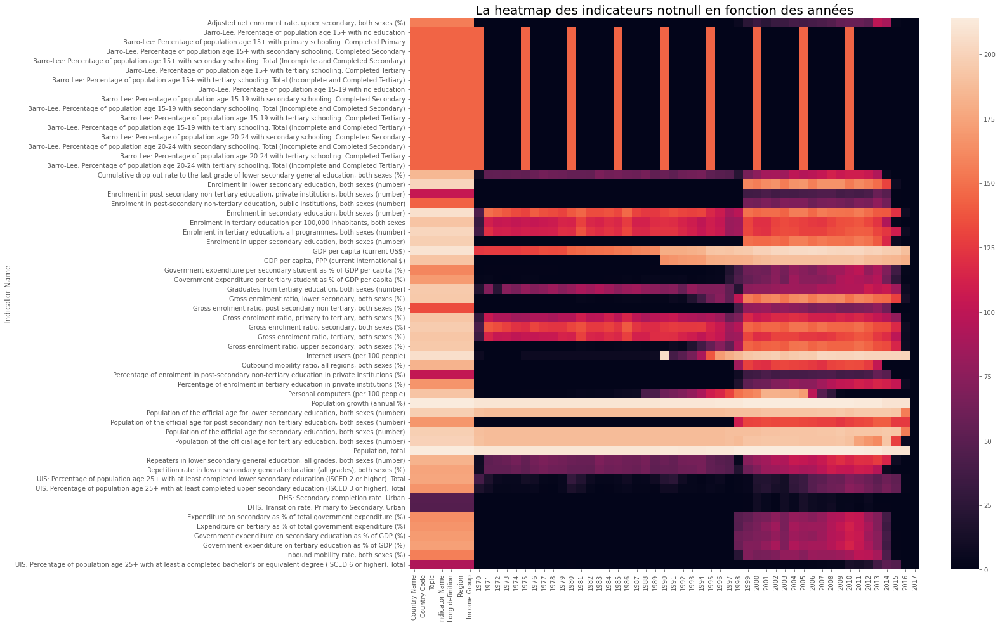

In [ ]:
# voir indicateurs not-null selon les années 
plt.figure(figsize=(18,16))
plt.title("La heatmap des indicateurs notnull en fonction des années", size=20)
sns.heatmap(df_indicator2.notnull().groupby(df_indicator2['Indicator Name'], sort=False, dropna=False).sum())

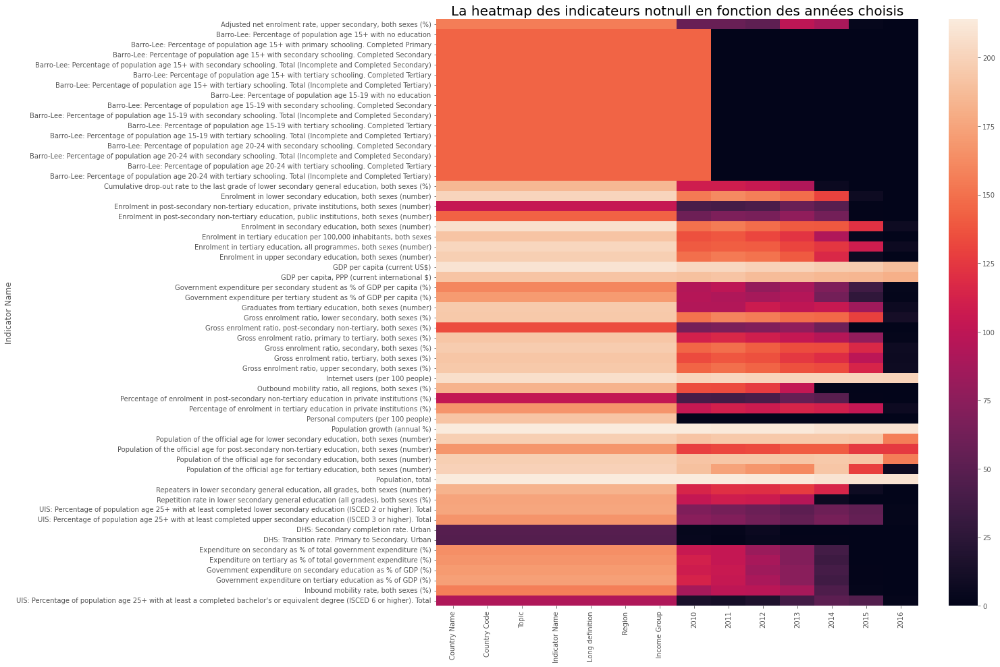

In [ ]:
#filtre pour indicateurs not-null selon les années 
df_indicator_filter_Year= df_indicator2[['Country Name', 'Country Code', 'Topic', 'Indicator Name',
       'Long definition', 'Region', 'Income Group','2010','2011','2012','2013','2014', '2015','2016']]
plt.figure(figsize=(16,16))
plt.title("La heatmap des indicateurs notnull en fonction des années choisis", size=20)
sns.heatmap(df_indicator_filter_Year.notnull().groupby(df_indicator_filter_Year['Indicator Name'], sort=False, dropna=False).sum())

In [ ]:
#Voir df
df_indicator_filter_Year.head()

,Country Name,Country Code,Topic,Indicator Name,Long definition,Region,Income Group,2010,2011,2012,2013,2014,2015,2016
0,Afghanistan,AFG,Secondary,"Adjusted net enrolment rate, upper secondary, ...",Total number of students of the official upper...,South Asia,Low income,NaN,NaN,NaN,31.33262,32.41703,NaN,NaN
1,Afghanistan,AFG,Attainment,Barro-Lee: Percentage of population age 15+ wi...,Percentage of population age 15+ with no educa...,South Asia,Low income,58.38,NaN,NaN,NaN,NaN,NaN,NaN
2,Afghanistan,AFG,Attainment,Barro-Lee: Percentage of population age 15+ wi...,Percentage of population age 15+ with primary ...,South Asia,Low income,12.86,NaN,NaN,NaN,NaN,NaN,NaN
3,Afghanistan,AFG,Attainment,Barro-Lee: Percentage of population age 15+ wi...,Percentage of population age 15+ with secondar...,South Asia,Low income,8.65,NaN,NaN,NaN,NaN,NaN,NaN
4,Afghanistan,AFG,Attainment,Barro-Lee: Percentage of population age 15+ wi...,Percentage of population age 15+ with secondar...,South Asia,Low income,16.09,NaN,NaN,NaN,NaN,NaN,NaN


In [ ]:
# Sélection des indicateurs assez renseignés
list_ind_first = ['GDP per capita, PPP (current international $)','Internet users (per 100 people)','Population growth (annual %)',
'Population of the official age for secondary education, both sexes (number)']
print('La selection des indicateurs :',len(list_ind_first))

La selection des indicateurs : 4


In [ ]:
# voir la liste 
list_ind_first

['GDP per capita, PPP (current international $)',
 'Internet users (per 100 people)',
 'Population growth (annual %)',
 'Population of the official age for secondary education, both sexes (number)']

## **Choisir les indicateurs selon la meme population de pays**

- [x] valeurs manquantes pour l'année 2014 

> 22 pour 2014 soit 2.71%

> 7 NaN pour GDP per capita, PPP (current international $) 

> 6 NaN pour Internet users (per 100 people)

> 5 NaN Population growth (annual %)

> 4 NaN Population of the official age for secondary education, both sexes (number)


- [X] Les pays restants après nettoyage

> 179 pays 

- [x] Non sélection de Population of the official age for tertiary education, both sexes (number) 


> <font color=red>2 pays perdu (Oman et United Arab Emerates (high income Non OECD)</font>

> Redondance avec Population of the official age for secondary education, both sexes (number) 



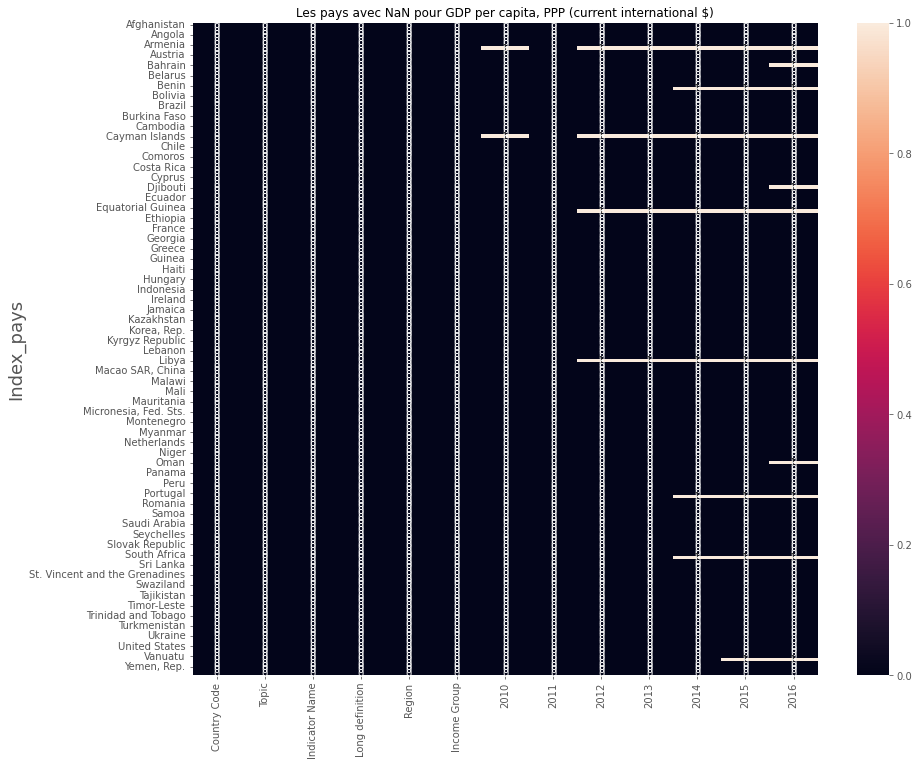

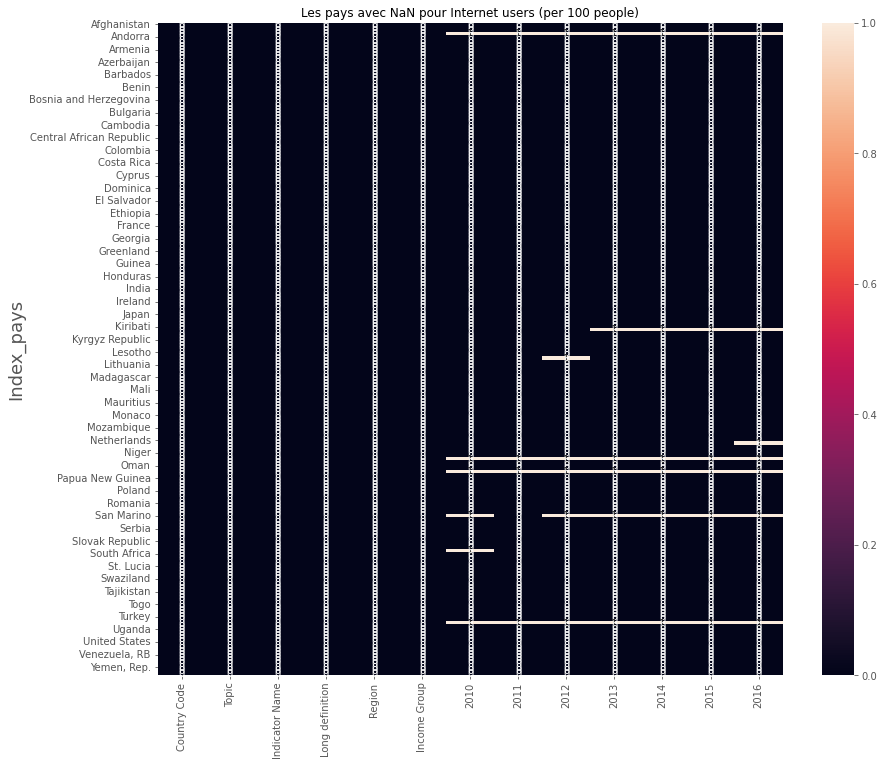

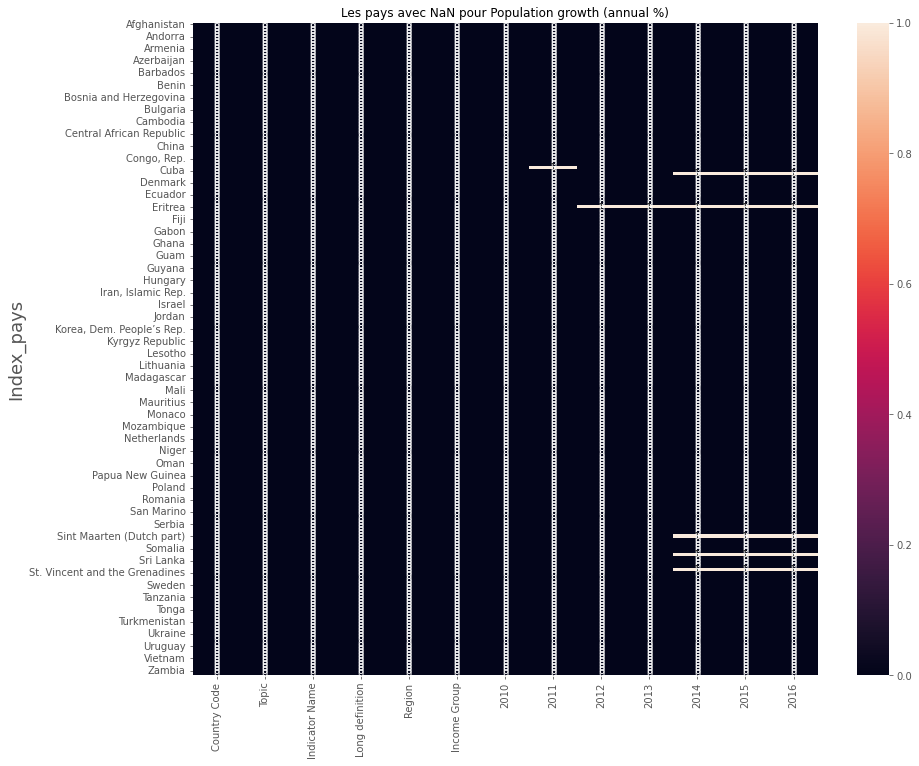

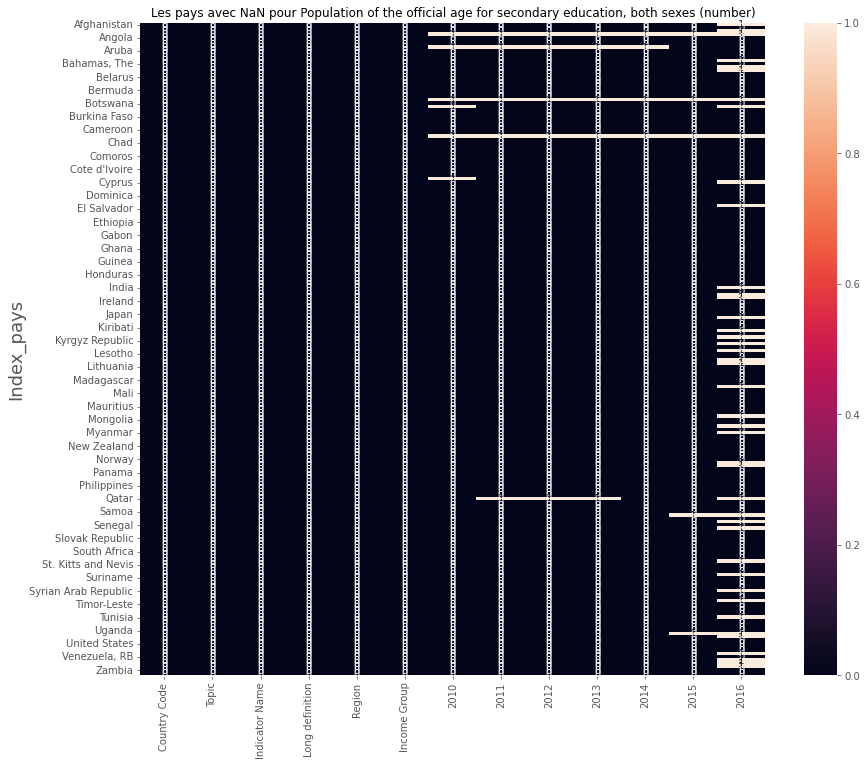

In [ ]:
# afficher les 4 indicateurs selon l'année 2010 
for ind in list_ind_first:
   
   #split par groupes indicator 
   groups_indicator = df_indicator_filter_Year.groupby('Indicator Name')
   groups_indicator = groups_indicator.get_group(ind)
   
   # mettre les pays sur les index pour heatmap
   groups_indicator1 = groups_indicator.set_index('Country Name')

  

   # voir heatmap des valeurs manquantes pour chaque indicateurs et pays 
   plt.figure(figsize=(14,12))
   plt.title(f'Les pays avec NaN pour {ind}', size=12)
   sns.heatmap(groups_indicator1.isnull(), annot=True)
   #plt.xlabel('Variable', fontsize=18 )
   plt.ylabel('Index_pays', fontsize=18 )


In [ ]:
# itération pour afficher les définitions de chaque indicateurs pré-sélectionnés
for ind in list_ind_first:  
  definition = df_indicator_filter_Year[df_indicator_filter_Year['Indicator Name']== ind].head()['Long definition'].unique()
  print('- DEFINITION ')
  print(f"{colored(ind, 'red')} : {''.join(definition)}")

- DEFINITION 
GDP per capita, PPP (current international $) : GDP per capita based on purchasing power parity (PPP). PPP GDP is gross domestic product converted to international dollars using purchasing power parity rates. An international dollar has the same purchasing power over GDP as the U.S. dollar has in the United States. GDP at purchaser's prices is the sum of gross value added by all resident producers in the economy plus any product taxes and minus any subsidies not included in the value of the products. It is calculated without making deductions for depreciation of fabricated assets or for depletion and degradation of natural resources. Data are in current international dollars based on the 2011 ICP round.
- DEFINITION 
Internet users (per 100 people) : Internet users are individuals who have used the Internet (from any location) in the last 3 months. The Internet can be used via a computer, mobile phone, personal digital assistant, games machine, digital TV etc.
- DEFINITIO

In [ ]:
#Liste pré-sélection affinée
list_indicator_final = ['GDP per capita, PPP (current international $)','Internet users (per 100 people)','Population growth (annual %)',
'Population of the official age for secondary education, both sexes (number)']
#Création df avec les indicateurs pré-sélectionnés afinnée

df_filter_ind_final = df_indicator_filter_Year[df_indicator_filter_Year['Indicator Name'].isin(list_indicator_final)]
#'Barro-Lee: Percentage of population age 15+ with tertiary schooling. Total (Incomplete and Completed Tertiary)'
print(df_filter_ind_final.shape)
#pd.set_option("display.max_rows", None)
df_filter_ind_final.head()

(811, 14)


,Country Name,Country Code,Topic,Indicator Name,Long definition,Region,Income Group,2010,2011,2012,2013,2014,2015,2016
25,Afghanistan,AFG,Economic Policy & Debt: Purchasing power parity,"GDP per capita, PPP (current international $)",GDP per capita based on purchasing power parit...,South Asia,Low income,1.581601e+03,1.660740e+03,1.873154e+03,1.877412e+03,1.875447e+03,1.864974e+03,1879.695600
35,Afghanistan,AFG,Infrastructure: Communications,Internet users (per 100 people),Internet users are individuals who have used t...,South Asia,Low income,4.000000e+00,5.000000e+00,5.454546e+00,5.900000e+00,7.000000e+00,8.260000e+00,10.595726
40,Afghanistan,AFG,Health: Population: Dynamics,Population growth (annual %),Annual population growth rate for year t is th...,South Asia,Low income,2.812617e+00,3.095119e+00,3.272703e+00,3.315224e+00,3.183202e+00,2.943234e+00,2.689163
43,Afghanistan,AFG,Population,Population of the official age for secondary e...,Population of the age-group theoretically corr...,South Asia,Low income,3.839021e+06,4.044521e+06,4.262522e+06,4.477827e+06,4.676453e+06,4.850112e+06,NaN
79,Albania,ALB,Economic Policy & Debt: Purchasing power parity,"GDP per capita, PPP (current international $)",GDP per capita based on purchasing power parit...,Europe & Central Asia,Upper middle income,9.646616e+03,1.020770e+04,1.052625e+04,1.058051e+04,1.133251e+04,1.144909e+04,11865.501000


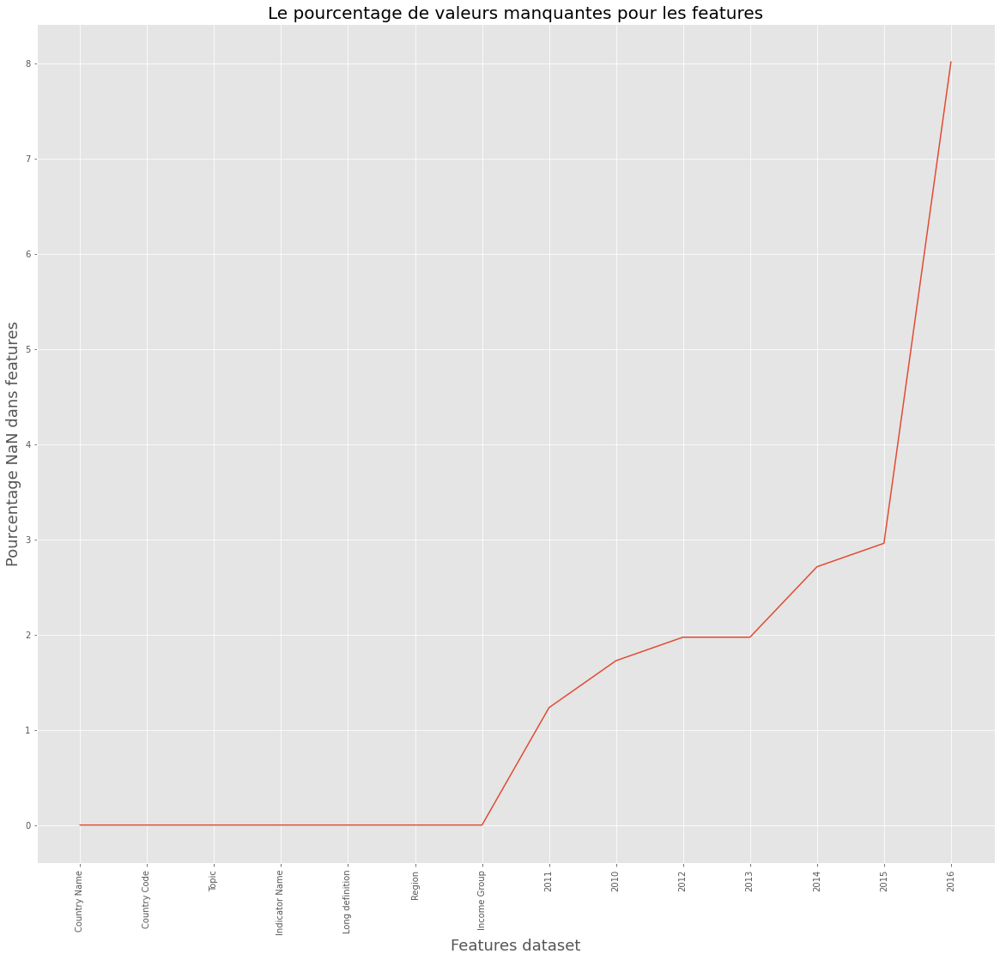

,Pct_NaN_colonne
2016,8.014797
2015,2.959309
2014,2.712700
2013,1.972873
2012,1.972873
2010,1.726264
2011,1.233046
Income Group,0.000000
Region,0.000000
Long definition,0.000000


In [ ]:
# voir pourcentage NaN dans les colonnes 
# 2020 à 2100 (prévision indicateurs)
plot_pourcentage_NaN_features(df_filter_ind_final)

In [ ]:
# voir les valeurs manquantes pour chaque rows 
nb_cols = pd.DataFrame( df_filter_ind_final.T.isnull().count()).rename(columns={0:'Nb_cols'})
missing_count_rows = pd.DataFrame(df_filter_ind_final.T.isnull().sum()).rename(columns={0:'Count_NaN'})
pct_rows_NaN = pd.DataFrame((df_filter_ind_final.T.isnull().sum()/df_filter_ind_final.T.isnull().count()*100)).rename(columns={0:'Pct_NaN_rows'})
df_rows_NaN = pd.concat([missing_count_rows,nb_cols, pct_rows_NaN], axis=1)
df_rows_NaN = df_rows_NaN.sort_values(by=['Pct_NaN_rows'], ascending=False)
df_rows_NaN

,Count_NaN,Nb_cols,Pct_NaN_rows
6381,7,14,50.000000
161,7,14,50.000000
8822,7,14,50.000000
1084,7,14,50.000000
1617,7,14,50.000000
6553,7,14,50.000000
183,7,14,50.000000
1609,6,14,42.857143
7246,6,14,42.857143
374,6,14,42.857143


In [ ]:
 # voir le nombre de valeurs manquante pour chaque colonne 
 df_filter_ind_final.isnull().sum()

Country Name        0
Country Code        0
Topic               0
Indicator Name      0
Long definition     0
Region              0
Income Group        0
2010               14
2011               10
2012               16
2013               16
2014               22
2015               24
2016               65
dtype: int64

In [ ]:
# grouper par indicator pour voir le nombre de valeur manquante par année
df_filter_ind_final.isnull().groupby(df_filter_ind_final['Indicator Name'], sort=False, dropna=False).sum().style.background_gradient(cmap='YlOrRd')

,Country Name,Country Code,Topic,Indicator Name,Long definition,Region,Income Group,2010,2011,2012,2013,2014,2015,2016
Indicator Name,,,,,,,,,,,,,,
"GDP per capita, PPP (current international $)",0,0,0,0,0,0,0,2,0,4,4,7,8,11
Internet users (per 100 people),0,0,0,0,0,0,0,6,4,6,6,6,6,7
Population growth (annual %),0,0,0,0,0,0,0,0,1,1,1,5,5,5
"Population of the official age for secondary education, both sexes (number)",0,0,0,0,0,0,0,6,5,5,5,4,5,42


In [ ]:
# grouper par indicator pour voir le nombre de valeur manquante par année
df_filter_ind_final.isnull().groupby(df_filter_ind_final['Country Name'], sort=False, dropna=False,as_index= False).sum().style.background_gradient(cmap='YlOrRd')

,Country Name,Country Code,Topic,Indicator Name,Long definition,Region,Income Group,2010,2011,2012,2013,2014,2015,2016
0,0,0,0,0,0,0,0,0,0,0,0,0,0,1
1,0,0,0,0,0,0,0,0,0,0,0,0,0,0
2,0,0,0,0,0,0,0,0,0,0,0,0,0,1
3,0,0,0,0,0,0,0,1,1,1,1,1,1,1
4,0,0,0,0,0,0,0,1,1,1,1,1,1,1
5,0,0,0,0,0,0,0,0,0,0,0,0,0,0
6,0,0,0,0,0,0,0,0,0,0,0,0,0,0
7,0,0,0,0,0,0,0,0,0,0,0,0,0,0
8,0,0,0,0,0,0,0,1,1,1,1,1,0,0
9,0,0,0,0,0,0,0,1,0,1,1,1,1,1


In [ ]:
#les index supprimés car au moins 1 valeur NaN 

df_filter_ind_final1= df_filter_ind_final[['Country Name', 'Country Code', 'Topic', 'Indicator Name',
       'Long definition', 'Region', 'Income Group','2014']]
df_filter_ind_final2 = df_filter_ind_final1.dropna(axis='index', how='any')
df_filter_ind_final2

,Country Name,Country Code,Topic,Indicator Name,Long definition,Region,Income Group,2014
25,Afghanistan,AFG,Economic Policy & Debt: Purchasing power parity,"GDP per capita, PPP (current international $)",GDP per capita based on purchasing power parit...,South Asia,Low income,1.875447e+03
35,Afghanistan,AFG,Infrastructure: Communications,Internet users (per 100 people),Internet users are individuals who have used t...,South Asia,Low income,7.000000e+00
40,Afghanistan,AFG,Health: Population: Dynamics,Population growth (annual %),Annual population growth rate for year t is th...,South Asia,Low income,3.183202e+00
43,Afghanistan,AFG,Population,Population of the official age for secondary e...,Population of the age-group theoretically corr...,South Asia,Low income,4.676453e+06
79,Albania,ALB,Economic Policy & Debt: Purchasing power parity,"GDP per capita, PPP (current international $)",GDP per capita based on purchasing power parit...,Europe & Central Asia,Upper middle income,1.133251e+04
92,Albania,ALB,Infrastructure: Communications,Internet users (per 100 people),Internet users are individuals who have used t...,Europe & Central Asia,Upper middle income,6.010000e+01
97,Albania,ALB,Health: Population: Dynamics,Population growth (annual %),Annual population growth rate for year t is th...,Europe & Central Asia,Upper middle income,-2.070470e-01
100,Albania,ALB,Population,Population of the official age for secondary e...,Population of the age-group theoretically corr...,Europe & Central Asia,Upper middle income,3.456440e+05
132,Algeria,DZA,Economic Policy & Debt: Purchasing power parity,"GDP per capita, PPP (current international $)",GDP per capita based on purchasing power parit...,Middle East & North Africa,Upper middle income,1.420329e+04
143,Algeria,DZA,Infrastructure: Communications,Internet users (per 100 people),Internet users are individuals who have used t...,Middle East & North Africa,Upper middle income,2.950000e+01


In [ ]:
#Vérifier il reste combien de pays pour chaque indicateur
for ind in list_indicator_final:
  groups_indicator_final = df_filter_ind_final2.groupby('Indicator Name')
  indicator = groups_indicator_final.get_group(ind)
  print(f"Les pays uniques dans le groupe {colored(ind,'red')}", indicator['Country Name'].nunique())

Les pays uniques dans le groupe GDP per capita, PPP (current international $) 185
Les pays uniques dans le groupe Internet users (per 100 people) 201
Les pays uniques dans le groupe Population growth (annual %) 209
Les pays uniques dans le groupe Population of the official age for secondary education, both sexes (number) 194


In [ ]:
 # voir les pays restants après le suppression des NaN 
print("Le nombres de pays restants pour l'étude pour chaque indicateur : " ,df_filter_ind_final2['Country Name'].nunique())
print("Les pays restants pour l'étude pour chaque indicateur", df_filter_ind_final2['Country Name'].unique())
df_filter_ind_final2['Country Name'].nunique()

Le nombres de pays restants pour l'étude pour chaque indicateur :  212
Les pays restants pour l'étude pour chaque indicateur ['Afghanistan' 'Albania' 'Algeria' 'American Samoa' 'Andorra' 'Angola'
 'Antigua and Barbuda' 'Argentina' 'Armenia' 'Aruba' 'Australia' 'Austria'
 'Azerbaijan' 'Bahamas, The' 'Bahrain' 'Bangladesh' 'Barbados' 'Belarus'
 'Belgium' 'Belize' 'Benin' 'Bermuda' 'Bhutan' 'Bolivia'
 'Bosnia and Herzegovina' 'Botswana' 'Brazil' 'Brunei Darussalam'
 'Bulgaria' 'Burkina Faso' 'Burundi' 'Cabo Verde' 'Cambodia' 'Cameroon'
 'Canada' 'Cayman Islands' 'Central African Republic' 'Chad'
 'Channel Islands' 'Chile' 'China' 'Colombia' 'Comoros' 'Congo, Dem. Rep.'
 'Congo, Rep.' 'Costa Rica' "Cote d'Ivoire" 'Croatia' 'Cuba' 'Curacao'
 'Cyprus' 'Czech Republic' 'Denmark' 'Djibouti' 'Dominica'
 'Dominican Republic' 'Ecuador' 'Egypt, Arab Rep.' 'El Salvador'
 'Equatorial Guinea' 'Eritrea' 'Estonia' 'Ethiopia' 'Faroe Islands' 'Fiji'
 'Finland' 'France' 'French Polynesia' 'Gabon' 'Gambia,

212

In [ ]:
df_filter_ind_final2['Indicator Name'].unique()

array(['GDP per capita, PPP (current international $)',
       'Internet users (per 100 people)', 'Population growth (annual %)',
       'Population of the official age for secondary education, both sexes (number)'],
      dtype=object)

In [ ]:
df_filter_ind_final3 = df_filter_ind_final2.drop(['Topic', 'Country Code','Long definition'], axis=1)
df_filter_ind_final3
df_filter_ind_final4 = df_filter_ind_final3.pivot(index=['Country Name','Region','Income Group'], columns='Indicator Name', values='2014').rename_axis(None, axis=1).reset_index(drop=False).dropna(how='any',axis=0)
df_filter_ind_final4.reset_index(drop=True, inplace=True )

In [ ]:
#Le nombres de pays conservés après le nettoyage
print(colored("Le nombres de pays conservés après le nettoyage : ", 'red'),df_filter_ind_final4['Country Name'].nunique())
print('')
print(df_filter_ind_final4['Country Name'].unique())

Le nombres de pays conservés après le nettoyage :  179

['Afghanistan' 'Albania' 'Algeria' 'Angola' 'Antigua and Barbuda'
 'Argentina' 'Australia' 'Austria' 'Azerbaijan' 'Bahamas, The' 'Bahrain'
 'Bangladesh' 'Barbados' 'Belarus' 'Belgium' 'Belize' 'Benin' 'Bhutan'
 'Bolivia' 'Botswana' 'Brazil' 'Brunei Darussalam' 'Bulgaria'
 'Burkina Faso' 'Burundi' 'Cabo Verde' 'Cambodia' 'Cameroon' 'Canada'
 'Central African Republic' 'Chad' 'Chile' 'China' 'Colombia' 'Comoros'
 'Congo, Dem. Rep.' 'Congo, Rep.' 'Costa Rica' "Cote d'Ivoire" 'Croatia'
 'Cyprus' 'Czech Republic' 'Denmark' 'Djibouti' 'Dominica'
 'Dominican Republic' 'Ecuador' 'Egypt, Arab Rep.' 'El Salvador'
 'Equatorial Guinea' 'Estonia' 'Ethiopia' 'Fiji' 'Finland' 'France'
 'Gabon' 'Gambia, The' 'Georgia' 'Germany' 'Ghana' 'Greece' 'Grenada'
 'Guatemala' 'Guinea' 'Guinea-Bissau' 'Guyana' 'Haiti' 'Honduras'
 'Hong Kong SAR, China' 'Hungary' 'Iceland' 'India' 'Indonesia'
 'Iran, Islamic Rep.' 'Iraq' 'Ireland' 'Israel' 'Italy' 'Jamaica'

In [ ]:
#Les pays supprimés après le nettoyage 

list_pays_final = list(df_filter_ind_final4['Country Name'].unique())
print(colored('Les pays supprimés après le nettoyage :', 'red'))
print('')
df_filter_ind_final2[~df_filter_ind_final2['Country Name'].isin(list_pays_final)]['Country Name'].unique()

Les pays supprimés après le nettoyage :



array(['American Samoa', 'Andorra', 'Armenia', 'Aruba', 'Bermuda',
       'Bosnia and Herzegovina', 'Cayman Islands', 'Channel Islands',
       'Cuba', 'Curacao', 'Eritrea', 'Faroe Islands', 'French Polynesia',
       'Greenland', 'Guam', 'Isle of Man', 'Korea, Dem. People’s Rep.',
       'Kosovo', 'Libya', 'Liechtenstein', 'Monaco', 'New Caledonia',
       'Northern Mariana Islands', 'Palau', 'Puerto Rico', 'San Marino',
       'Singapore', 'Somalia', 'South Sudan', 'Syrian Arab Republic',
       'Turks and Caicos Islands', 'Virgin Islands (U.S.)',
       'West Bank and Gaza'], dtype=object)

# **Feature selection** 

- [X] Vérifier redondance des indicateurs et multicolinéarité 


## Détecter Redondance avec matrice corrélation

- [x] Vérifier les corrélations entre variables afin de déterminer la redondance
>  **Conservation des variables internet_users et GDP per capita pour la problématique malgré la corrélation modérée**

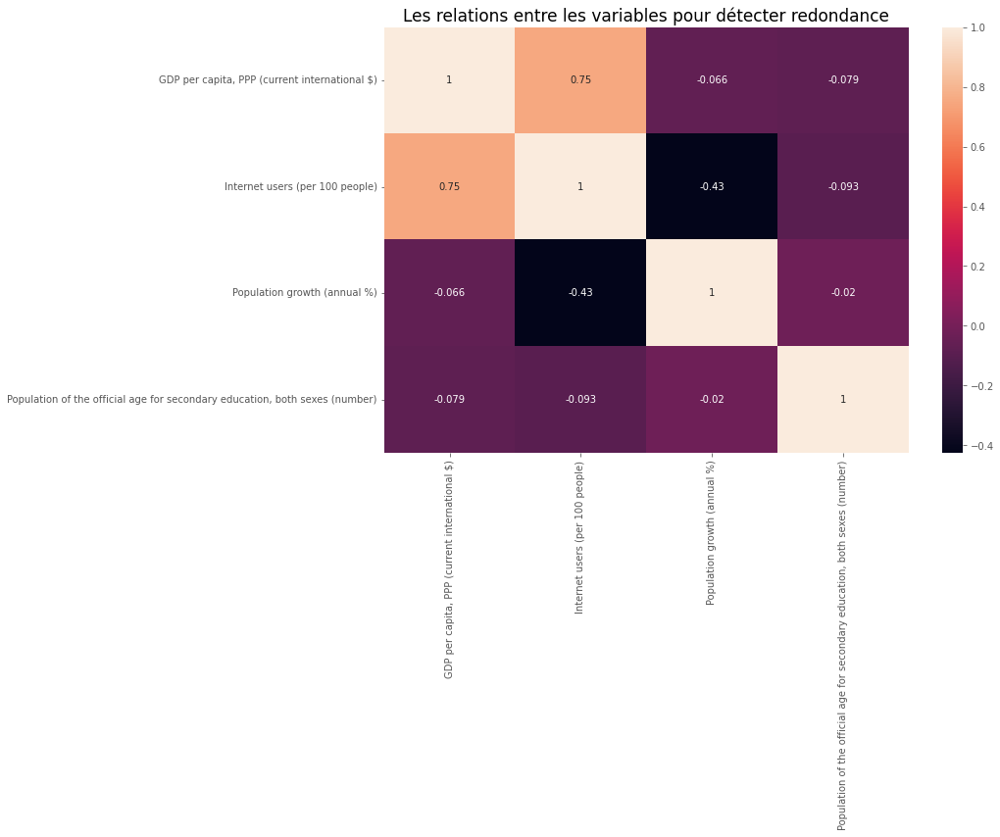

In [ ]:
# afficher heatmap entre les variables 
plt.figure(figsize=(12,8))
plt.title('Les relations entre les variables pour détecter redondance', size=17)
sns.heatmap(df_filter_ind_final4.corr(), annot =True)

## Détécter multicolinéarité 

- [x] Vérifier les indicateurs avec le plus de d'inflation de la variance 

In [ ]:
# Détecter inflation de la variance 
cols_for_VIF = df_filter_ind_final4.iloc[:,3:]
VIF_df = pd.DataFrame()
VIF_df["feature"] = cols_for_VIF.columns
VIF_df["VIF"] = [variance_inflation_factor(cols_for_VIF.values, i) for i in range(len(cols_for_VIF.columns))]
VIF_df.style.background_gradient(cmap='YlOrRd')

,feature,VIF
0,"GDP per capita, PPP (current international $)",3.895448
1,Internet users (per 100 people),4.028225
2,Population growth (annual %),1.348500
3,"Population of the official age for secondary education, both sexes (number)",1.052095


In [ ]:
# voir describe 
df_filter_ind_final4.describe(include ='all')

,Country Name,Region,Income Group,"GDP per capita, PPP (current international $)",Internet users (per 100 people),Population growth (annual %),"Population of the official age for secondary education, both sexes (number)"
count,179,179,179,179.000000,179.000000,179.000000,1.790000e+02
unique,179,7,5,NaN,NaN,NaN,NaN
top,China,Europe & Central Asia,Upper middle income,NaN,NaN,NaN,NaN
freq,1,46,50,NaN,NaN,NaN,NaN
mean,NaN,NaN,NaN,18938.985840,43.876929,1.481021,4.159289e+06
std,NaN,NaN,NaN,21665.023697,28.233604,1.279705,1.529944e+07
min,NaN,NaN,NaN,633.918760,1.380000,-1.306163,1.487000e+03
25%,NaN,NaN,NaN,3838.517700,17.315000,0.506682,2.185555e+05
50%,NaN,NaN,NaN,11954.618000,44.000000,1.333495,7.628160e+05
75%,NaN,NaN,NaN,25676.750000,68.315000,2.308188,3.313978e+06


# **Feature engeneering**

- [X] Vérifier les outliers et valeurs aberrantes

> Pour déterminer les valeurs extrêmes de chaque indicateur


- [X] Encodage ordinal pour income group (analyse bivariée)

## Vérification des outliers et valeurs aberrantes

- [X] Vérification valeurs aberrantes 

> Pas de valeurs abberantes détectées 

- [x] Vérification des outliers 

**Les outliers qui se détachent pour les indicateurs:** 

> <font color=red>GDP per capita, PPP (current international $)</font> 

- **Macao SAR, China, Qatar, Brunei Darussalam, Kuwait, United Arab Emirates,
Hong Kong SAR, China (high income NON OECD)**

- **Luxembourg, Norway, Switzerland, United States (high income OECD)**


> <font color=red>Population growth (annual %)</font> 

- **Oman, Qatar , Kuwait, Equatorial Guinea (high Income OECD)**              
- **Lebanon (Upper middle income)**    


> <font color=red> Population of the official age for secondary education, both sex <font> 


- **India, Indonesia, Pakistan (Lower middle income)**                                                            
- **China, Brazil (Upper middle income)**                                                          
                                                                        
- **United States (High income OECD )**                                                             
          
                     
                     
            



 

In [ ]:
 df_filter_ind_final4['Region'].unique()

array(['South Asia', 'Europe & Central Asia',
       'Middle East & North Africa', 'Sub-Saharan Africa',
       'Latin America & Caribbean', 'East Asia & Pacific',
       'North America'], dtype=object)

In [ ]:
#Vérifier pays dans OECD ou nonOECD

income_group = df_filter_ind_final4.groupby('Income Group')
print(colored('Les pays dans High income: nonOECD : ', 'red'))
print(income_group.get_group('High income: nonOECD')['Country Name'].unique())
print('---------------------------------------------------------------------')
print(colored('Les  pays dans High income: OECD', 'red'))
print(income_group.get_group('High income: OECD')['Country Name'].unique())

print('---------------------------------------------------------------------')
print(colored('Les pays dans Upper middle income: ', 'red'))
print(income_group.get_group('Upper middle income')['Country Name'].unique())

print('---------------------------------------------------------------------')
print(colored('Les pays dans Lower middle income: ', 'red'))
print(income_group.get_group('Lower middle income')['Country Name'].unique())


print('---------------------------------------------------------------------')
print(colored('Les pays dans Low income: ', 'red'))
print(income_group.get_group('Low income')['Country Name'].unique())

print('')
print('##############################################################################')
print('')

#Vérifier pays dans Regions

Regions_group = df_filter_ind_final4.groupby('Region')
print(colored('Les pays dans South Asia : ', 'red'))
print(Regions_group.get_group('South Asia')['Country Name'].unique())
print('---------------------------------------------------------------------')
print(colored('Les  pays dans Europe & Central Asia', 'red'))
print(Regions_group.get_group('Europe & Central Asia')['Country Name'].unique())

print('---------------------------------------------------------------------')
print(colored('Les pays dans Middle East & North Africa: ', 'red'))
print(Regions_group.get_group('Middle East & North Africa')['Country Name'].unique())

print('---------------------------------------------------------------------')
print(colored('Les pays dans Sub-Saharan Africa : ', 'red'))
print(Regions_group.get_group('Sub-Saharan Africa')['Country Name'].unique())


print('---------------------------------------------------------------------')
print(colored('Les pays dans Latin America & Caribbean: ', 'red'))
print(Regions_group.get_group('Latin America & Caribbean')['Country Name'].unique())


print('---------------------------------------------------------------------')
print(colored('Les pays dans East Asia & Pacific: ', 'red'))
print(Regions_group.get_group('East Asia & Pacific')['Country Name'].unique())


print('---------------------------------------------------------------------')
print(colored('Les pays dans North America: ', 'red'))
print(Regions_group.get_group('North America')['Country Name'].unique())

Les pays dans High income: nonOECD : 
['Antigua and Barbuda' 'Bahamas, The' 'Bahrain' 'Barbados'
 'Brunei Darussalam' 'Croatia' 'Cyprus' 'Equatorial Guinea'
 'Hong Kong SAR, China' 'Kuwait' 'Latvia' 'Lithuania' 'Macao SAR, China'
 'Malta' 'Oman' 'Qatar' 'Russian Federation' 'Saudi Arabia'
 'St. Kitts and Nevis' 'Trinidad and Tobago' 'United Arab Emirates'
 'Uruguay']
---------------------------------------------------------------------
Les  pays dans High income: OECD
['Australia' 'Austria' 'Belgium' 'Canada' 'Chile' 'Czech Republic'
 'Denmark' 'Estonia' 'Finland' 'France' 'Germany' 'Greece' 'Iceland'
 'Ireland' 'Israel' 'Italy' 'Japan' 'Korea, Rep.' 'Luxembourg'
 'Netherlands' 'New Zealand' 'Norway' 'Poland' 'Portugal'
 'Slovak Republic' 'Slovenia' 'Spain' 'Sweden' 'Switzerland'
 'United Kingdom' 'United States']
---------------------------------------------------------------------
Les pays dans Upper middle income: 
['Albania' 'Algeria' 'Angola' 'Argentina' 'Azerbaijan' 'Belarus' 'Be

In [ ]:
#Fonction plot pour afficher distribution des variables afin de voir normalité et outliers

import scipy.stats as stats
def diagnostic_plots(df, variable):
  
    plt.figure(figsize=(16, 4))

    # histogram
    plt.subplot(1, 3, 1)
    #df[variable].iplot(kind='hist',bins=30)
    sns.histplot(df[variable], bins=30)
    plt.title('Histogram')

    # Q-Q plot
    plt.subplot(1, 3, 2)
    stats.probplot(df[variable], dist="norm", plot=plt)
    plt.ylabel('Variable quantiles')

    # boxplot
    plt.subplot(1, 3, 3)
    #df[variable].iplot(kind='boxplot',bins=30)
    sns.boxplot(y=df[variable])
    plt.title('Boxplot')
    
    # test shapiro pour la normalité de la variable 
    print('Test Shapiro')
    data = df[variable].values
    stat, p = shapiro(data)
    print('stat=%.3f, p=%.3f' % (stat, p))
    if p > 0.05:
         print('Probablement Gaussien ')
    else:
         print('Probablement pas Gaussien ')
    # test normaltest pour la normalité de la variable        
    print('Test normaltest')        
    data = df[variable].values
    stat, p = normaltest(data)
    print('stat=%.3f, p=%.3f' % (stat, p))
    if p > 0.05:
        print('Probablement Gaussien ')
    else:
        print('Probablement pas Gaussien ')


    plt.show()

GDP PER CAPITA, PPP (CURRENT INTERNATIONAL $)

Test Shapiro
stat=0.752, p=0.000
Probablement pas Gaussien 
Test normaltest
stat=113.807, p=0.000
Probablement pas Gaussien 


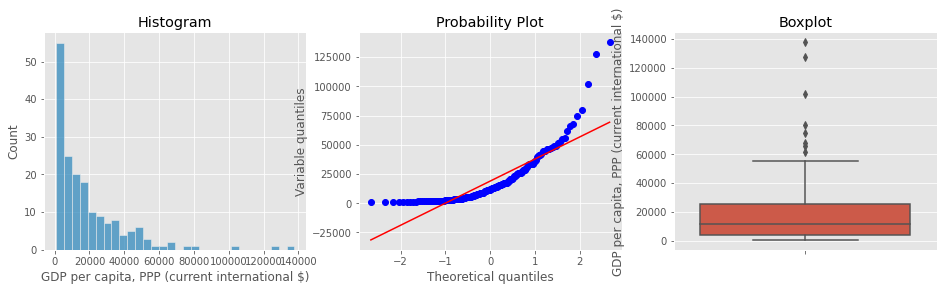


INTERNET USERS (PER 100 PEOPLE)

Test Shapiro
stat=0.939, p=0.000
Probablement pas Gaussien 
Test normaltest
stat=108.082, p=0.000
Probablement pas Gaussien 


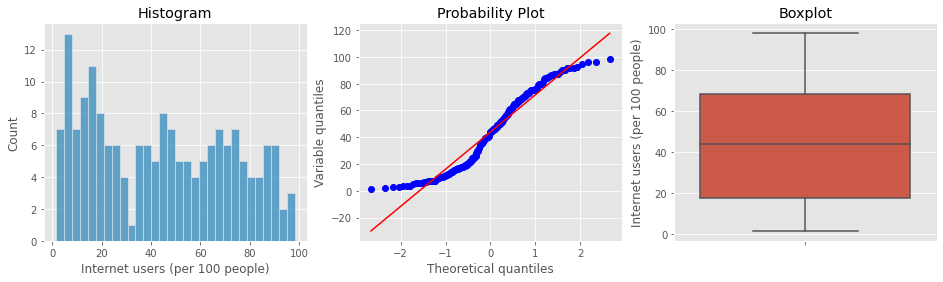


POPULATION GROWTH (ANNUAL %)

Test Shapiro
stat=0.964, p=0.000
Probablement pas Gaussien 
Test normaltest
stat=24.728, p=0.000
Probablement pas Gaussien 


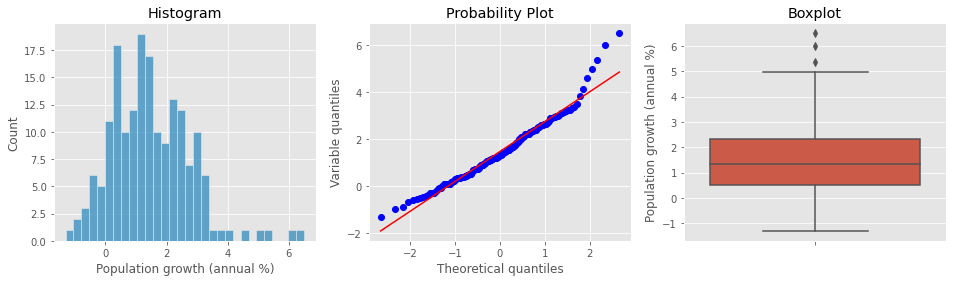


POPULATION OF THE OFFICIAL AGE FOR SECONDARY EDUCATION, BOTH SEXES (NUMBER)

Test Shapiro
stat=0.233, p=0.000
Probablement pas Gaussien 
Test normaltest
stat=320.025, p=0.000
Probablement pas Gaussien 


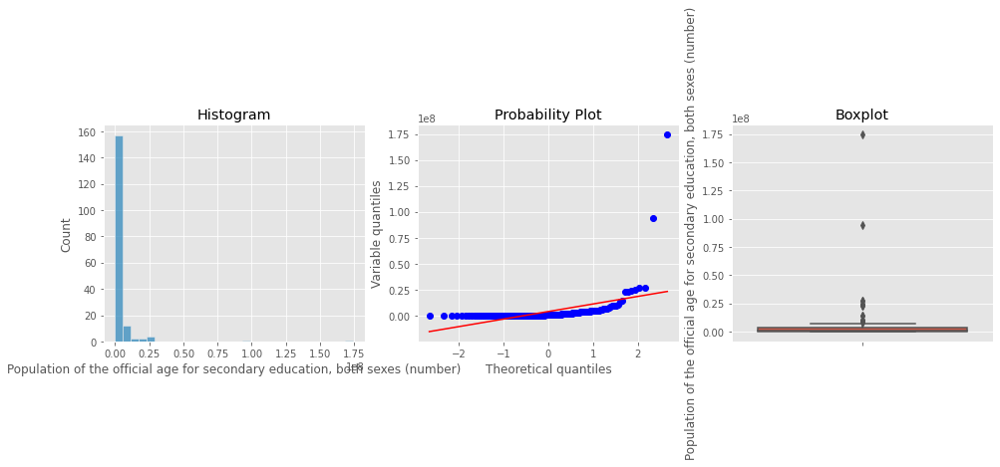

In [ ]:
# itération pour afficher diagnostic des distributions pour chaque indicateur
# voir les outliers et normalités 
list_ind =['GDP per capita, PPP (current international $)','Internet users (per 100 people)','Population growth (annual %)',
'Population of the official age for secondary education, both sexes (number)']

for ind in list_ind:
  print(colored(ind.upper(), 'red'))
  print('')
  diagnostic_plots(df_filter_ind_final4, ind )
  print('')

In [ ]:
# voir description des variables
df_filter_ind_final4.describe()

,"GDP per capita, PPP (current international $)",Internet users (per 100 people),Population growth (annual %),"Population of the official age for secondary education, both sexes (number)"
count,179.000000,179.000000,179.000000,1.790000e+02
mean,18938.985840,43.876929,1.481021,4.159289e+06
std,21665.023697,28.233604,1.279705,1.529944e+07
min,633.918760,1.380000,-1.306163,1.487000e+03
25%,3838.517700,17.315000,0.506682,2.185555e+05
50%,11954.618000,44.000000,1.333495,7.628160e+05
75%,25676.750000,68.315000,2.308188,3.313978e+06
max,137736.950000,98.160000,6.504660,1.742689e+08


In [ ]:
# voir les 10 plus grandes valeurs pour les indicateurs 
for ind in list_ind:
  Nlarg = df_filter_ind_final4.nlargest(10, ind)
  print(ind)
  print(Nlarg[['Country Name', ind]])

GDP per capita, PPP (current international $)
             Country Name  GDP per capita, PPP (current international $)
94       Macao SAR, China                                     137736.950
130                 Qatar                                     127313.490
93             Luxembourg                                     101876.730
21      Brunei Darussalam                                      80152.140
85                 Kuwait                                      74613.950
168  United Arab Emirates                                      67551.000
120                Norway                                      65787.050
154           Switzerland                                      61792.293
68   Hong Kong SAR, China                                      55514.510
170         United States                                      54598.550
Internet users (per 100 people)
             Country Name  Internet users (per 100 people)
70                Iceland                        98.160000
1

In [ ]:
# voir les 10 plus grandes valeurs pour les indicateurs 
for ind in list_ind:
  Nlarg = df_filter_ind_final4.nsmallest(10, ind)
  print(ind)
  print(Nlarg[['Country Name', ind]])

GDP per capita, PPP (current international $)
                 Country Name  GDP per capita, PPP (current international $)
29   Central African Republic                                      633.91876
35           Congo, Dem. Rep.                                      764.48110
24                    Burundi                                      846.05896
91                    Liberia                                      847.68860
118                     Niger                                      952.44257
111                Mozambique                                     1137.47950
97                     Malawi                                     1148.58830
159                      Togo                                     1385.57400
96                 Madagascar                                     1445.28120
64              Guinea-Bissau                                     1472.91530
Internet users (per 100 people)
                 Country Name  Internet users (per 100 people)
24          

## Encodage

- [x] Encodage Income group pour EDA (numerique)

In [ ]:
from sklearn.preprocessing import OrdinalEncoder, OneHotEncoder
# encodage ordinal de la colonne income group
ordinal_encoder = OrdinalEncoder(categories = [['High income: OECD','High income: nonOECD','Upper middle income','Lower middle income','Low income']])
df_filter_ind_final4['Income Group enco']= ordinal_encoder.fit_transform(df_filter_ind_final4[['Income Group']])


# **EDA**

- [X] Comprendre le comportement chaque variable et leurs relations entre elles 


- [X] Data visualisation 

## Statistiques Descriptives


- [x] <font color=blue> Groupby Region (mean, median, std)</font> 

> <font color=red>GDP per capita, PPP (current international $)</font> 
 

- La moyenne plus élevée est North America plus élevé mais seulement 2 pays (Canada, United State)
- Le groupe North America hétérogéne

> <font color=red>Internet users (per 100 people)</font> 

- La moyenne la plus élevée est North America plus élevé mais seulement 2 pays (Canada, United State)
- Le groupe North America hétérogéne

> <font color=red>Population growth (annual %)</font> 

- La moyenne la plus elevée est Middle East & North Africa 
- Le group Middle East & North Africa hétérogène 

> <font color=red>Population of the official age for secondary education, both sexes (number)</font> 

- La moyenne la plus elevée South Asia 
- Le group South Asia est hétérogène 






- [x] <font color=blue> Groupby Income group (mean, median, std)</font> 

> <font color=red>GDP per capita, PPP (current international $)</font> 


- La moyenne plus élevée est High non Income OECD, ensuite 
- Le groupe North America hétérogéne

> <font color=red>Internet users (per 100 people)</font> 

- La moyenne la plus élevée est North America plus élevé mais seulement 2 pays (Canada, United State)
- Le groupe North America hétérogéne

> <font color=red>Population growth (annual %)</font> 

- La moyenne la plus elevée est Middle East & North Africa 
- Le group Middle East & North Africa hétérogène 

> <font color=red>Population of the official age for secondary education, both sexes (number)</font> 

- La moyenne la plus elevée South Asia 
- Le group South Asia est hétérogène 


In [ ]:
#Statistiques descriptives par régions pour les indicateurs
df_filter_ind_final4.groupby('Region').agg({'GDP per capita, PPP (current international $)': ['mean','std', 'median'], 'Internet users (per 100 people)': ['mean','std', 'median'],
                            'Population growth (annual %)':['mean','std', 'median'], 'Population of the official age for secondary education, both sexes (number)':['mean','std', 'median']
                            }).style.background_gradient(cmap='YlOrRd')

In [ ]:
#Statistiques descriptives par Income Group pour les indicateurs

df_filter_ind_final4.groupby('Income Group').agg({'GDP per capita, PPP (current international $)': ['mean','std', 'median'], 'Internet users (per 100 people)': ['mean','std', 'median'],
                            'Population growth (annual %)':['mean','std', 'median'], 'Population of the official age for secondary education, both sexes (number)':['mean','std', 'median']
                            }).style.background_gradient(cmap='YlOrRd')

In [ ]:
#Statistiques descriptives par pays pour les indicateurs (il y a que 1 année, c'est pour sela pas 
#d'écart type (2014))
#Statistiques descriptives par régions pour les indicateurs
df_filter_ind_final4.groupby('Country Name').agg({'GDP per capita, PPP (current international $)': ['mean','median', 'std'], 'Internet users (per 100 people)': ['mean','median', 'std'],
                            'Population growth (annual %)':['mean','median', 'std'], 'Population of the official age for secondary education, both sexes (number)':['mean','median', 'std']
                            }).style.background_gradient(cmap='YlOrRd')

/usr/local/lib/python3.7/dist-packages/pandas/io/formats/style.py:1126: RuntimeWarning:

All-NaN slice encountered

/usr/local/lib/python3.7/dist-packages/pandas/io/formats/style.py:1127: RuntimeWarning:

All-NaN slice encountered



## Analyse univariée

###Select dtypes

- [X] Vérifier la répartition des dtypes 


- [X] Séparer les variables numériques et catégorielles 

> 62.5% float et 37.5 object

float64    5
object     3
dtype: int64


array([<matplotlib.axes._subplots.AxesSubplot object at 0x7f9122a66050>],
      dtype=object)

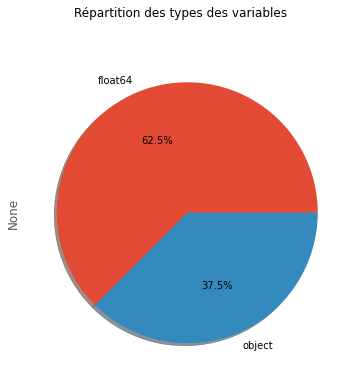

In [ ]:
# afficher plot cammenbert pour les types des variables 
print(df_filter_ind_final4.dtypes.value_counts())
df_filter_ind_final4.dtypes.value_counts().plot(kind='pie', subplots=True, shadow = True,figsize=(8,6),autopct='%1.1f%%',
                                     title='Répartition des types des variables')

In [ ]:
# séparer les types des colonnes en numerique et object 
df_numerical = df_filter_ind_final4.select_dtypes(exclude='object')
df_object = df_filter_ind_final4.select_dtypes(include = 'object')

In [ ]:
# création listes des colonnes numerique et object 
list_var_num = list(df_numerical.columns)
print("Les variables numériques : ",list_var_num)
list_var_object = list(df_object.columns)
print("Les variables objects : ",list_var_object)

Les variables numériques :  ['GDP per capita, PPP (current international $)', 'Internet users (per 100 people)', 'Population growth (annual %)', 'Population of the official age for secondary education, both sexes (number)', 'Income Group enco']
Les variables objects :  ['Country Name', 'Region', 'Income Group']


### Analyse univariée numérical

- [X] GDP per capita 


> Skewness droite (des pays se détachent des autres en terme de PIB)

- [X]  Internet_user 

> Distribution plutot uniforme mais tendance négative pour les pays avec le plus de internet_user en fin de distribution

- [X] Pop Growth 

> Distrbution avec tendance centrale 1% et skewness droite (Pays growth entre 3.5 et 7%)

- [x] Pop en age d'etre en secondary

> Très gros skewness droite (Inde , chine)

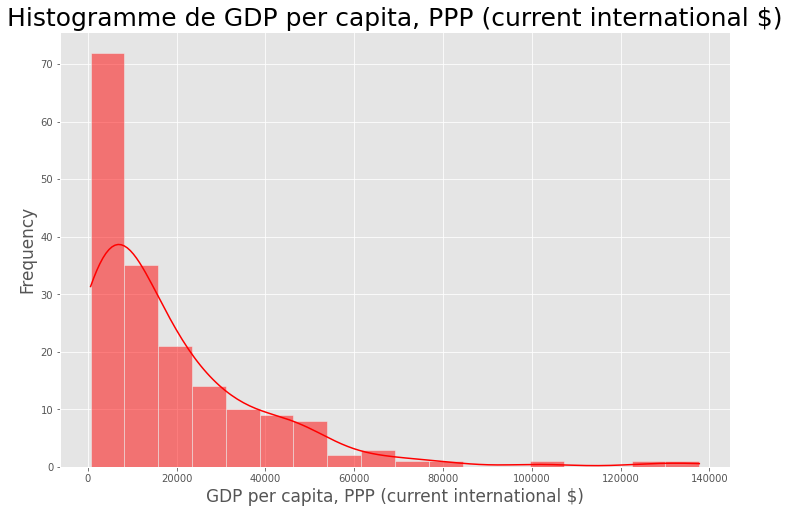

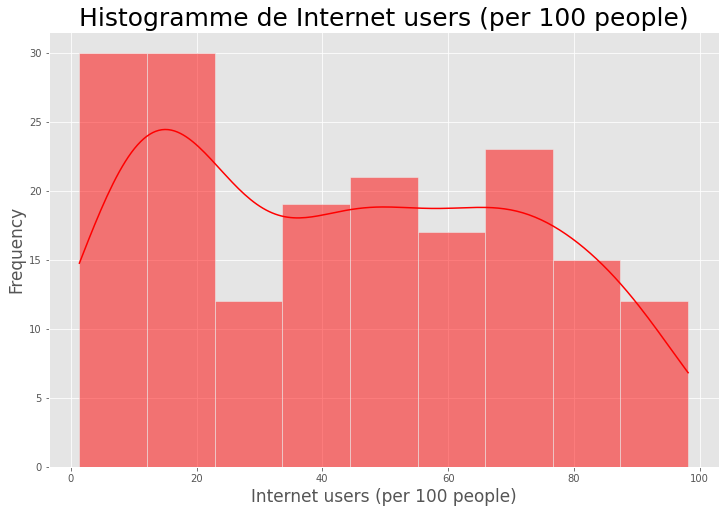

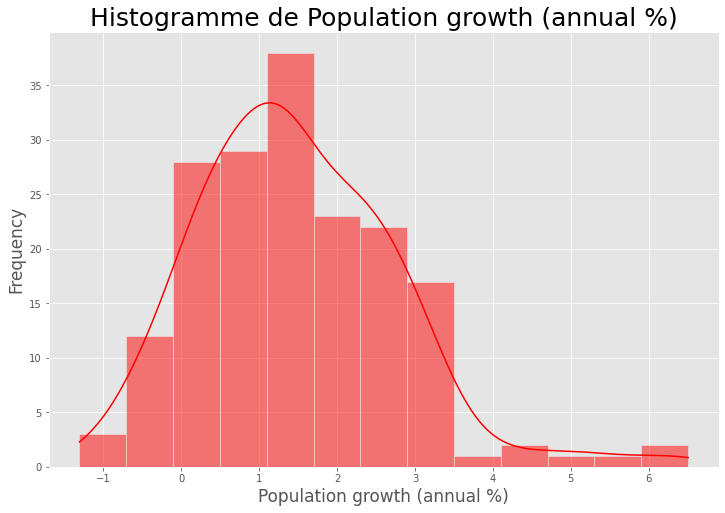

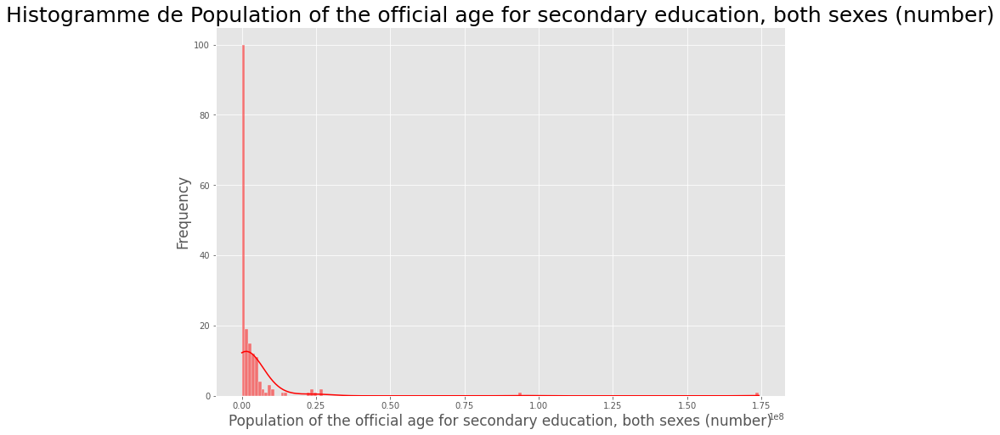

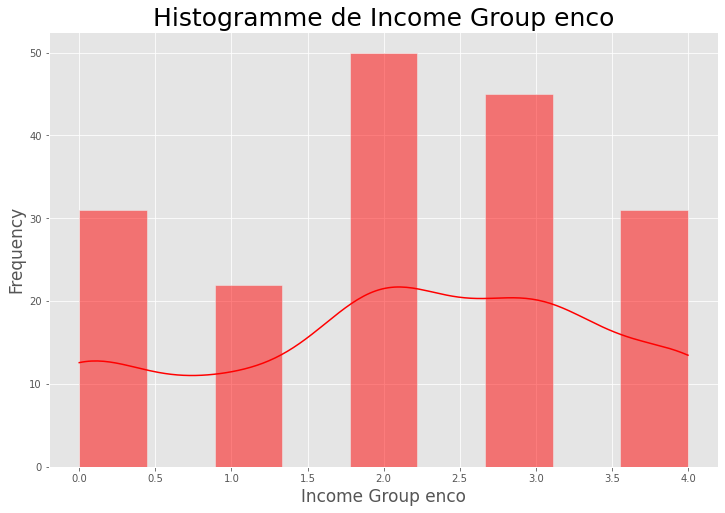

In [ ]:
# affcher les variables numériques 
plt.style.use('ggplot')

for col in list_var_num:
    plt.figure(figsize=(12,8))
    sns.histplot(df_numerical[col], color='red', kde=True)
    #df_numerical[col].iplot(kind='hist',bins=30)
    #fig = px.histogram(df_numerical[col], title=f'Histogramme de la variable {col}')
    
    #df_numerical[col].plot_bokeh(kind='hist');
    
    
    plt.title(f'Histogramme de {col}', size=25)
    plt.ylabel('Frequency',fontsize=17)
    plt.xlabel(f'{col}',fontsize=17)
    plt.show()
    #fig.show()
    #HTML(fig.to_html())

### Analyse univariée catégorielle

- [X] La régions la plus représentée ou moins

> Plus :  Europe & central Asia 

> Moins :  North América (2 pays (United states, Candada)


- [X] Income group la plus représentée ou moins 

>  Plus :  Upper middle income

> moins : High income: OECD     


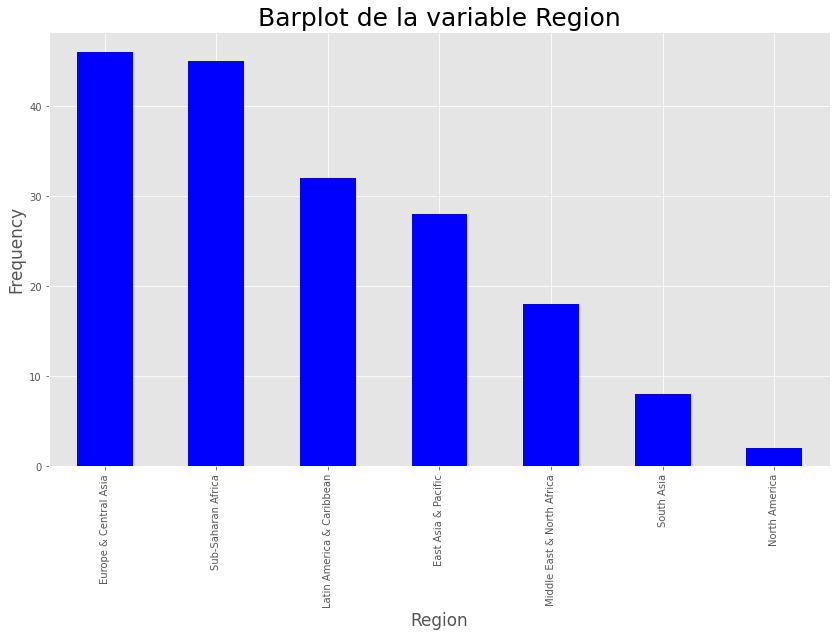

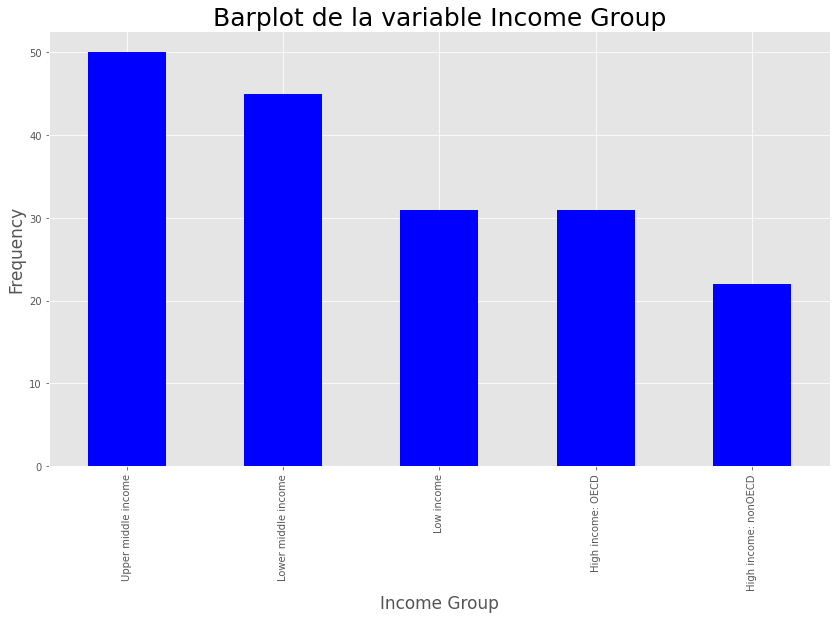

In [ ]:
# Afficher les variables objects

for col in list_var_object[1:]:
    df_object[col].value_counts().plot(kind='bar', figsize=(14,8), color='blue')
    plt.title(f'Barplot de la variable {col}', size=25)
    plt.ylabel('Frequency', fontsize=17)
    plt.xlabel(f'{col}', fontsize=17)
    plt.show()

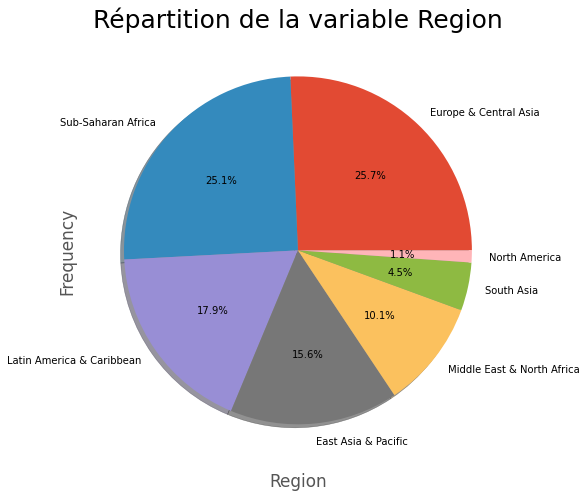

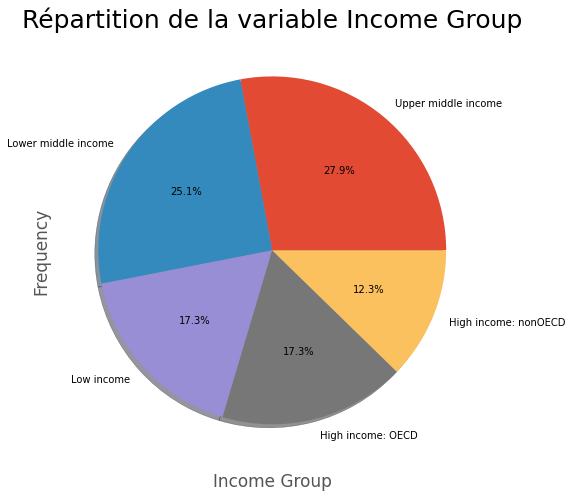

In [ ]:
# afficher les variables objects avec plot cammenbert 
for col in list_var_object[1:]:
    df_object[col].value_counts(normalize=True).plot(kind='pie', figsize=(12,8),subplots=True, shadow = True,autopct='%1.1f%%',
                                     )
    plt.title(f'Répartition de la variable {col}', size=25)
    plt.ylabel('Frequency', fontsize=17)
    plt.xlabel(f'{col}', fontsize=17)
    plt.show()

## Analyse bivariée 

### numérical vs numérical

- [X] Forte relation positive

> plus GDP per capita augmente et plus internet va augmenter (corr=0.75)

- [X] Forte relation négative selon les groupes attribués 

> Moins il y aura utilisateurs internet et moins le groupe income sera élevée(low)

> Moins il y aura PIB et moins le groupe income sera élevée (low)


/usr/local/lib/python3.7/dist-packages/seaborn/axisgrid.py:88: UserWarning:

Tight layout not applied. tight_layout cannot make axes width small enough to accommodate all axes decorations

/usr/local/lib/python3.7/dist-packages/seaborn/axisgrid.py:88: UserWarning:

Tight layout not applied. tight_layout cannot make axes height small enough to accommodate all axes decorations



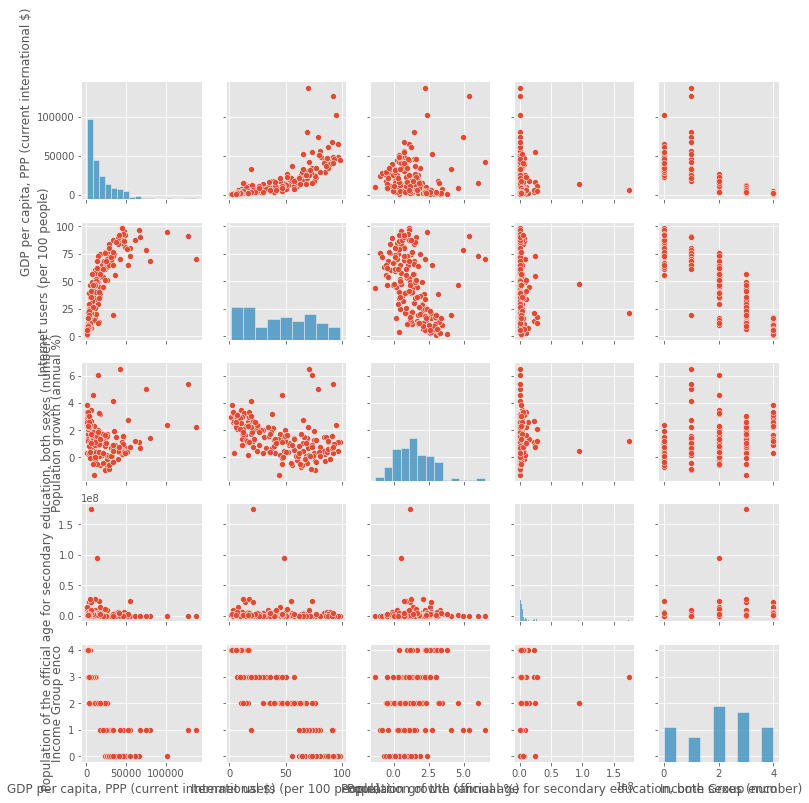

In [ ]:
# afficher les variables numériques par paires 
sns.pairplot(df_numerical)

Text(0.5, 1.0, 'Matrice corrélation')

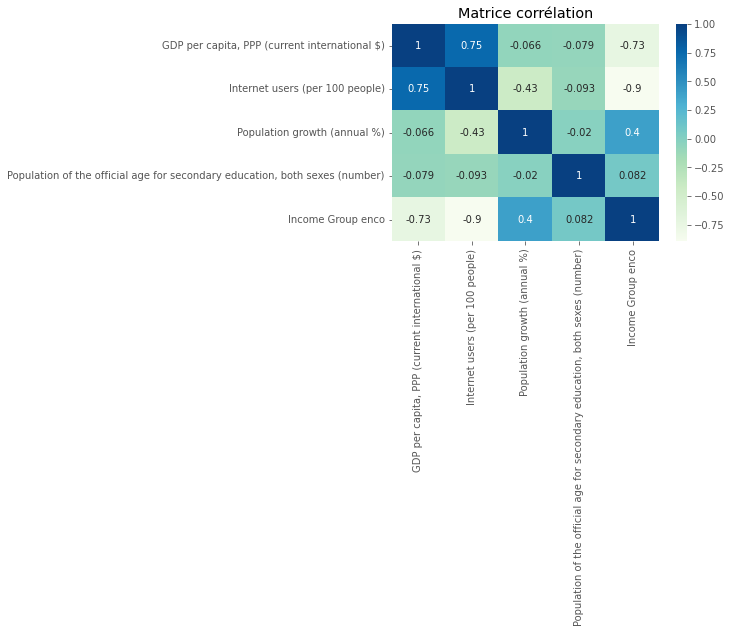

In [ ]:
# afficher la matrice corrélation 
sns.heatmap(df_numerical.corr(),annot=True , cmap='GnBu')
plt.title('Matrice corrélation')

### numérical vs catégorielle

In [ ]:
# fonction afficher relation entre variable numérique et object
def boxplot_bivariée(df, var_cat, var_num):
  meanprops = {'marker':'o', 'markeredgecolor':'black',
                'markerfacecolor':'firebrick'}
  plt.figure(figsize=(16,12))
  plt.title(f"Boxplot entre {var_cat} et {var_num}", size=22)
  sns.boxplot(x=df[var_cat], y=df[var_num], showmeans=True, meanprops=meanprops,data=df)
  plt.xticks(fontsize=9)
 

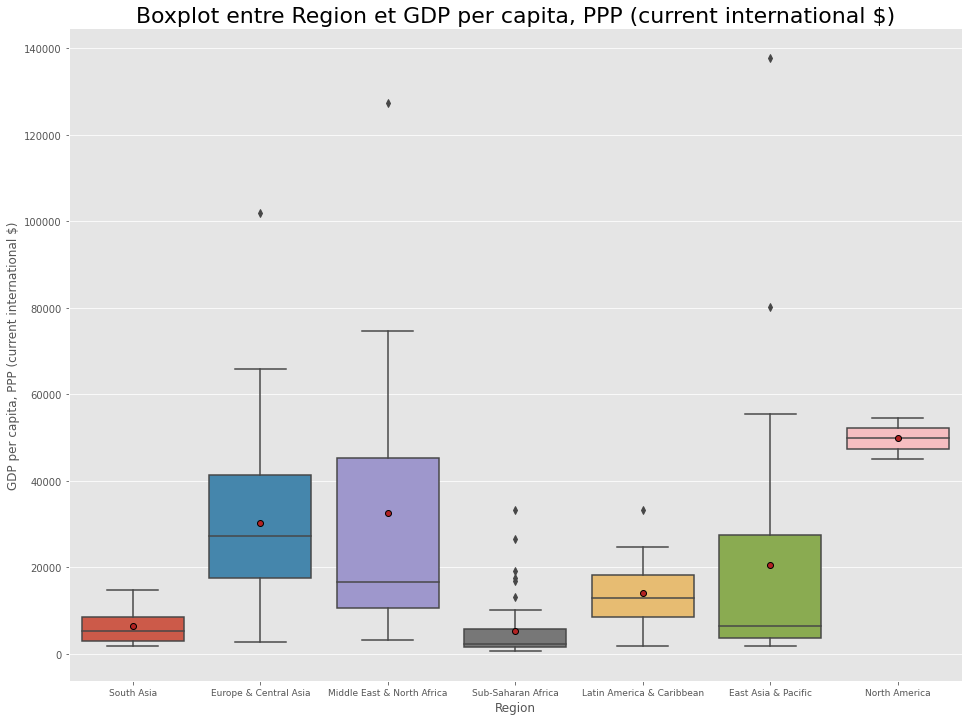

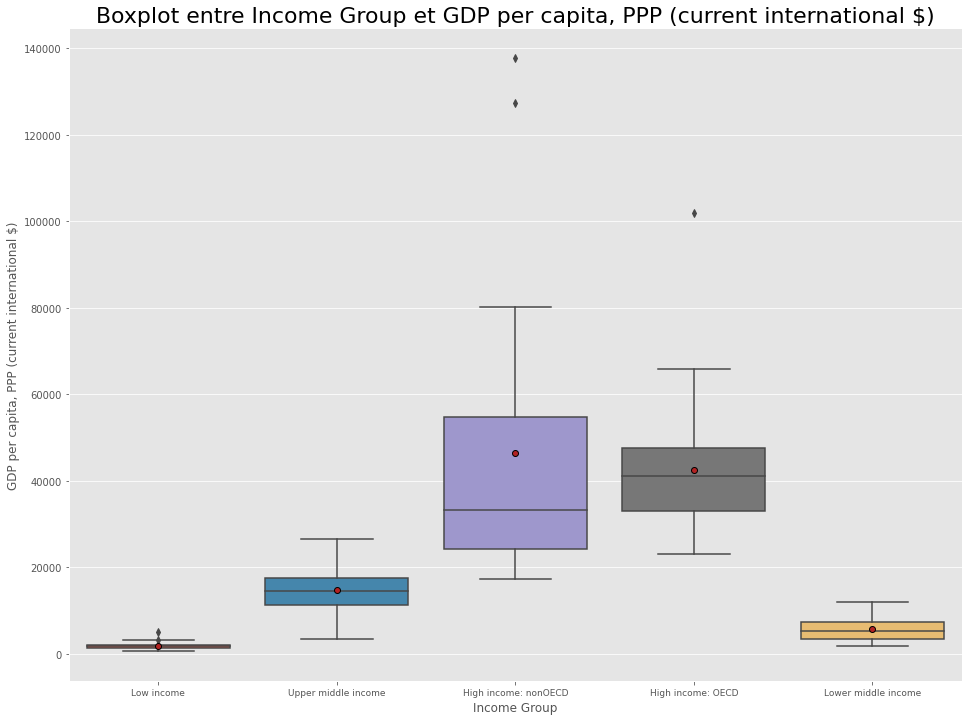

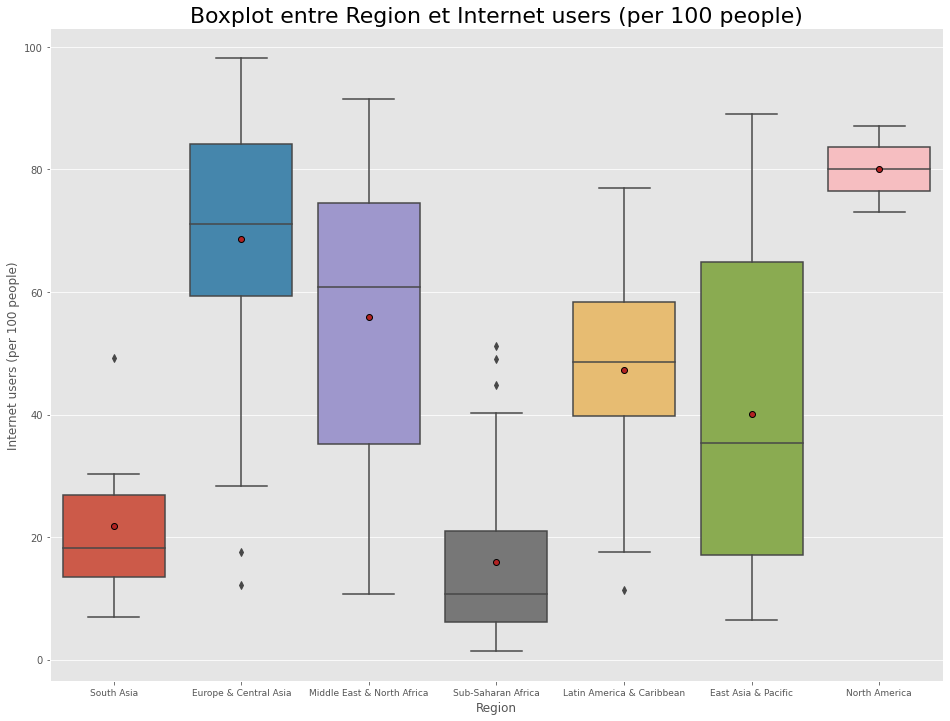

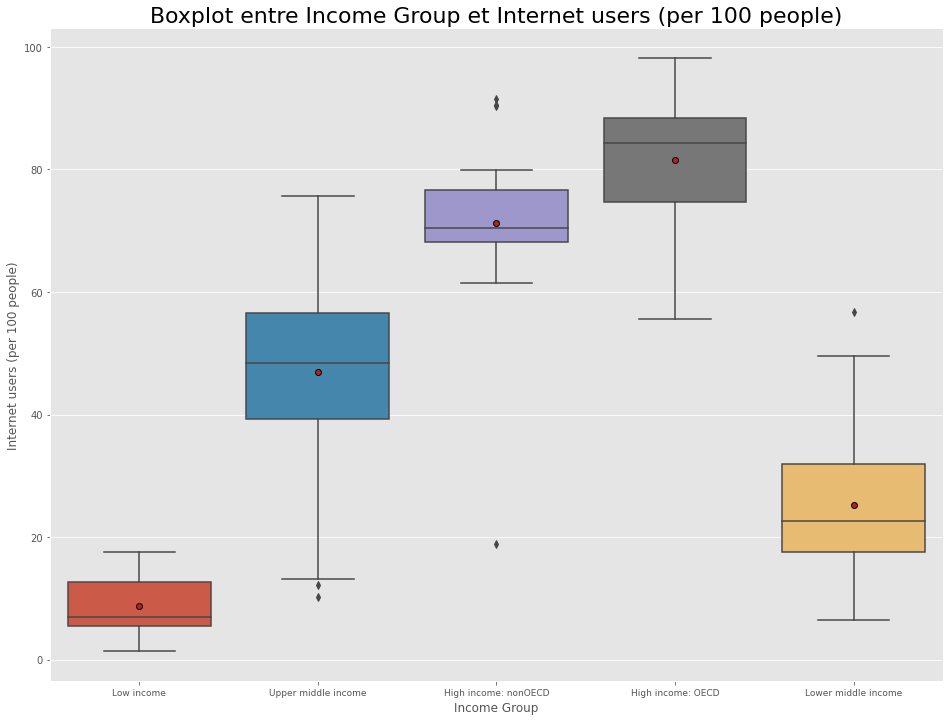

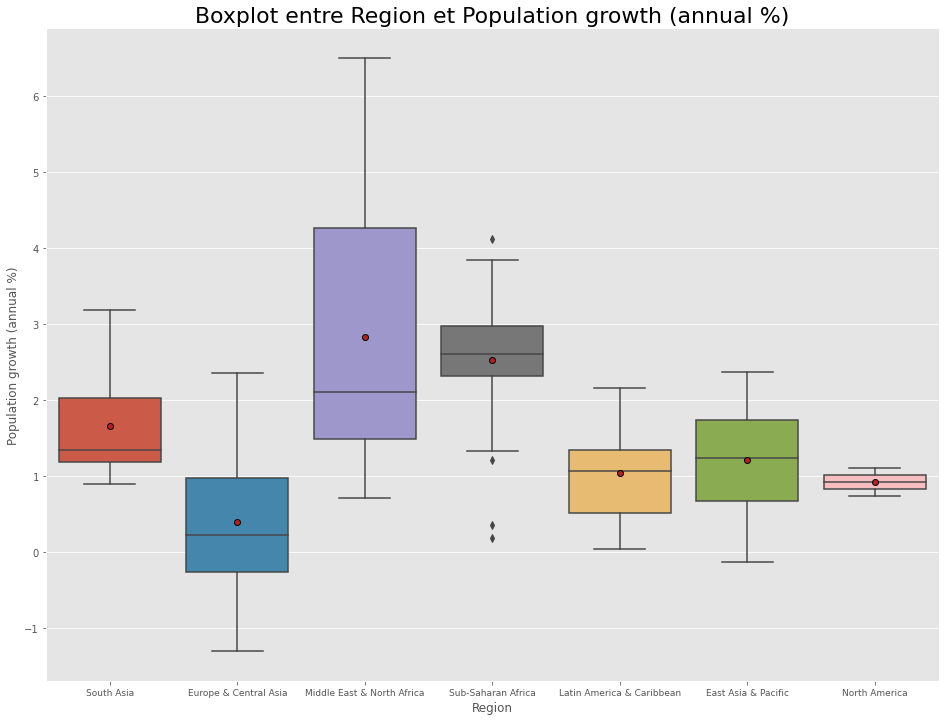

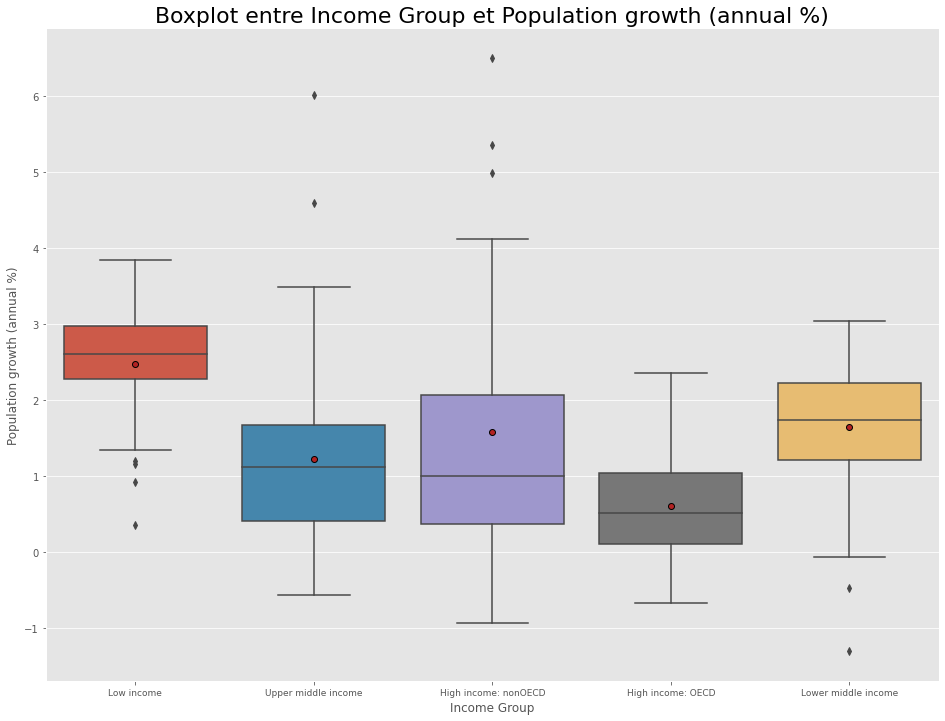

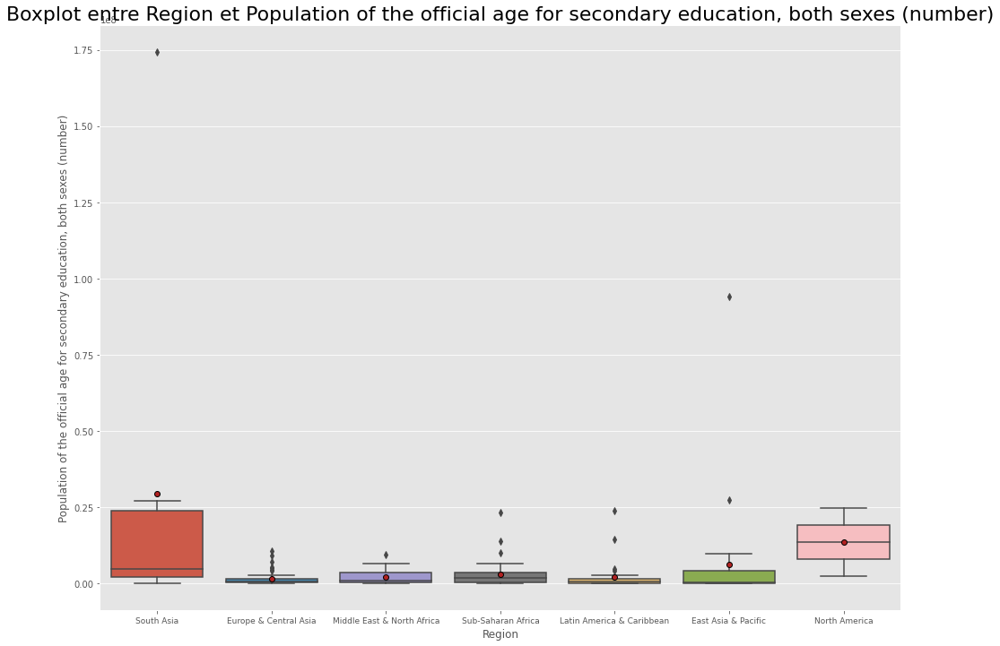

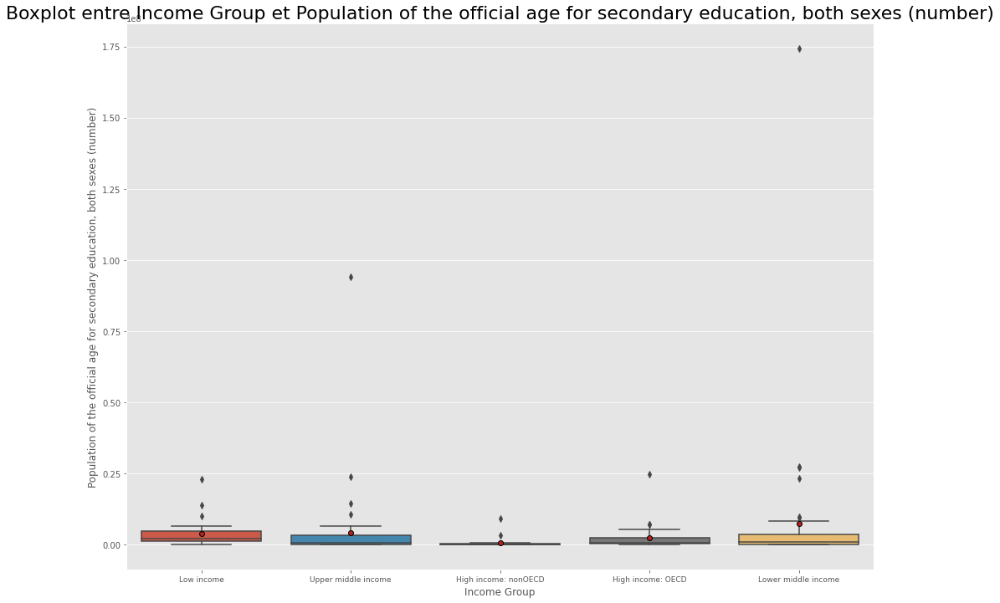

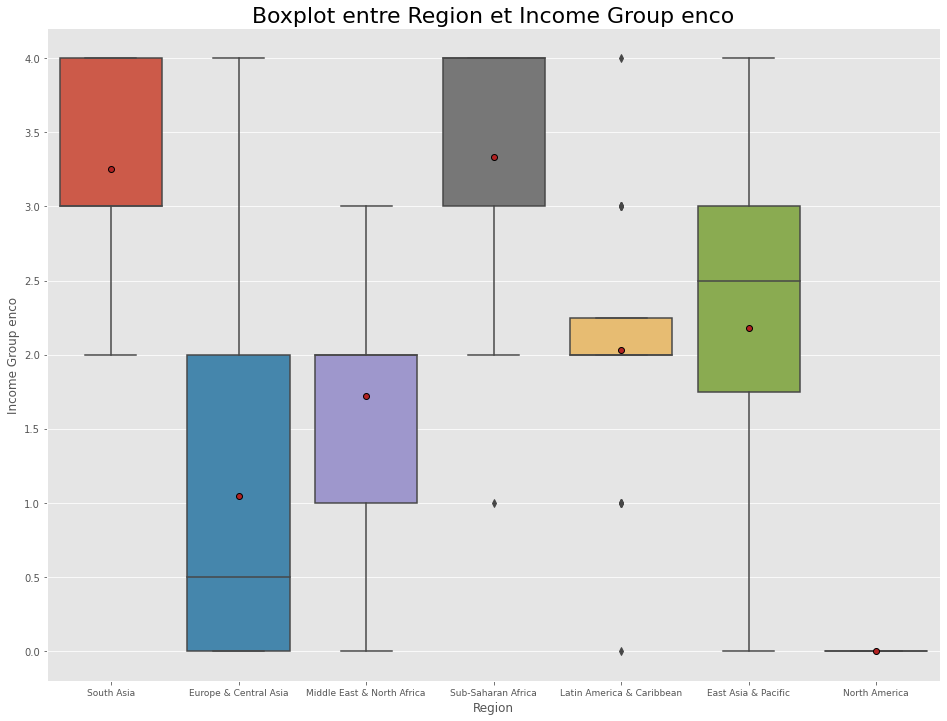

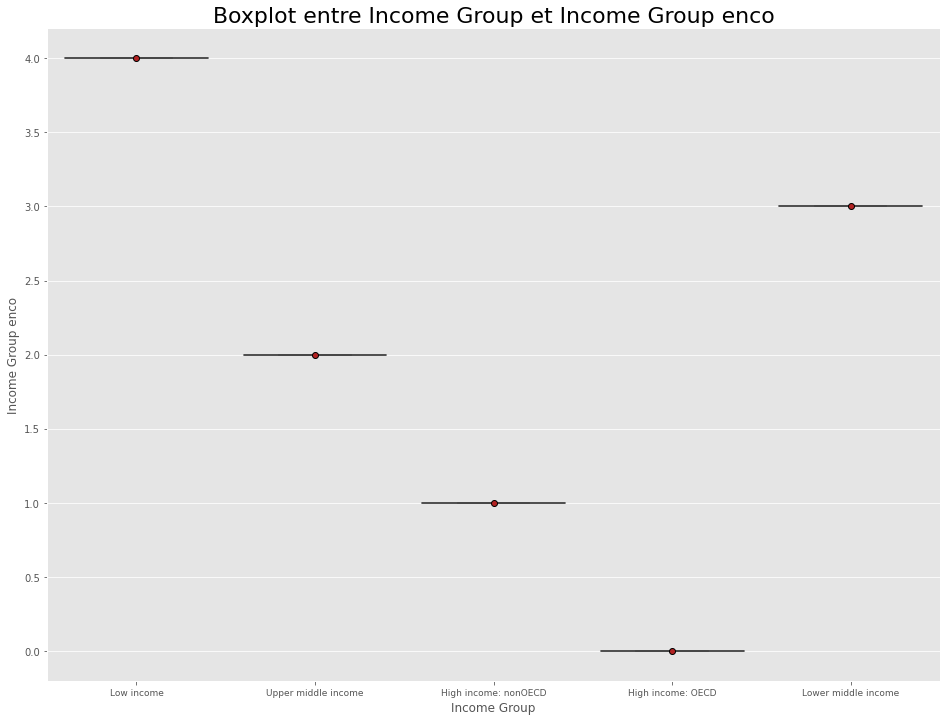

In [ ]:
# boucle pour afficher boxplot avec combinaisons variables numériques différentes 

for i in list_var_num[0:]:
  for j in list_var_object[1:]:
    if i!=j:
       boxplot_bivariée(df_filter_ind_final4, j, i )

In [ ]:
df_filter_ind_final4.columns

Index(['Country Name', 'Region', 'Income Group',
       'GDP per capita, PPP (current international $)',
       'Internet users (per 100 people)', 'Population growth (annual %)',
       'Population of the official age for secondary education, both sexes (number)',
       'Income Group enco'],
      dtype='object')

In [ ]:
df_filter_ind_final4[Region, ]

,Country Name,Region,Income Group,"GDP per capita, PPP (current international $)",Internet users (per 100 people),Population growth (annual %),"Population of the official age for secondary education, both sexes (number)",Income Group enco
0,Afghanistan,South Asia,Low income,1875.44740,7.000000,3.183202,4676453.0,4.0
1,Albania,Europe & Central Asia,Upper middle income,11332.50700,60.100000,-0.207047,345644.0,2.0
2,Algeria,Middle East & North Africa,Upper middle income,14203.29200,29.500000,2.000666,4140079.0,2.0
3,Angola,Sub-Saharan Africa,Upper middle income,6594.39800,10.200000,3.485413,3430540.0,2.0
4,Antigua and Barbuda,Latin America & Caribbean,High income: nonOECD,20618.99600,67.780000,1.068648,7894.0,1.0
5,Argentina,Latin America & Caribbean,Upper middle income,19801.26000,64.700000,1.032709,4168223.0,2.0
6,Australia,East Asia & Pacific,High income: OECD,46446.02700,84.000000,1.474288,1723758.0,0.0
7,Austria,Europe & Central Asia,High income: OECD,49005.16400,80.995830,0.730867,702330.0,0.0
8,Azerbaijan,Europe & Central Asia,Upper middle income,17607.62300,75.000015,1.248209,923476.0,2.0
9,"Bahamas, The",Latin America & Caribbean,High income: nonOECD,23190.25200,76.920000,1.298133,34098.0,1.0


In [ ]:
#Projections sex et categ
df_anova = df_filter_ind_final4[['GDP per capita, PPP (current international $)', 'Region']]
df_anova.head()

,"GDP per capita, PPP (current international $)",Region
0,1875.4474,South Asia
1,11332.5070,Europe & Central Asia
2,14203.2920,Middle East & North Africa
3,6594.3980,Sub-Saharan Africa
4,20618.9960,Latin America & Caribbean


In [ ]:
#Les valeurs uniques de colonne categ_object
grps = pd.unique(df_anova['Region'].values)
grps

# création dictionnaire entre categ_object et price
d_data = {grp:df_anova['GDP per capita, PPP (current international $)'][df_anova['Region'] == grp].values for grp in grps}
d_data

{'East Asia & Pacific': array([ 46446.027 ,  80152.14  ,   3291.145 ,  13439.906 ,   8661.288 ,
         55514.51  ,  10537.213 ,  39386.91  ,   1912.0492,  33631.55  ,
          5407.3887, 137736.95  ,  25486.527 ,   3882.251 ,   3297.1863,
         11954.618 ,   5024.711 ,  37182.25  ,   3809.1824,   6937.5557,
          5805.4365,   2128.6125,  15646.578 ,   1988.4597,   5300.2983,
          3440.2297,   3046.7808,   5656.955 ]),
 'Europe & Central Asia': array([ 11332.507 ,  49005.164 ,  17607.623 ,  18902.355 ,  44737.906 ,
         17406.068 ,  21980.934 ,  30482.562 ,  32357.637 ,  47900.11  ,
         28554.904 ,  41511.75  ,  40221.387 ,   9216.325 ,  47195.6   ,
         26536.887 ,  25645.041 ,  44290.465 ,  51631.26  ,  36294.074 ,
         24845.455 ,   3351.5286,  23958.605 ,  28179.234 , 101876.73  ,
         13516.36  ,   5017.0938,  15410.037 ,  49012.023 ,  65787.05  ,
         25708.459 ,  28806.27  ,  20796.96  ,  25477.234 ,  13806.013 ,
         29074.113 ,  31229

In [ ]:
#Teste anova si les moyennes de deux échantillons indépendants ou plus sont significativement différentes.
#H0: les moyennes des échantillons sont égales.
#H1: une ou plusieurs des moyennes des échantillons sont inégales.

stat, p = stats.f_oneway(d_data['East Asia & Pacific'], d_data['Europe & Central Asia'],  d_data['Latin America & Caribbean'], d_data['Middle East & North Africa'], d_data['North America'], d_data['South Asia'],  d_data['Sub-Saharan Africa'])
print('stat=%.3f, p=%.3f' % (stat, p))
if p > 0.05:
    print('les 5 populations sont significativements les memes')
else:
    print('les 5 populations sont significativements différentes')
    
 

stat=9.945, p=0.000
les 5 populations sont significativements différentes


### catégorielle vs catégorielle

- [X] Les régions sont hétérogènes en terme de group Income

> Ne pas faire cibler les pays expansion par rapport aux régions

> La relation entre les group income et les régions sont probablement dépendantes

In [ ]:
def countplot_bivariée_categ(df,var1, var2):
  plt.figure(figsize=(16,14))
  plt.title(f'Countplot entre {var1} et {var2}',size=22)
  sns.countplot(x=var1,hue=var2, data=df)
  plt.legend(loc='best')
  plt.xticks(fontsize=9)

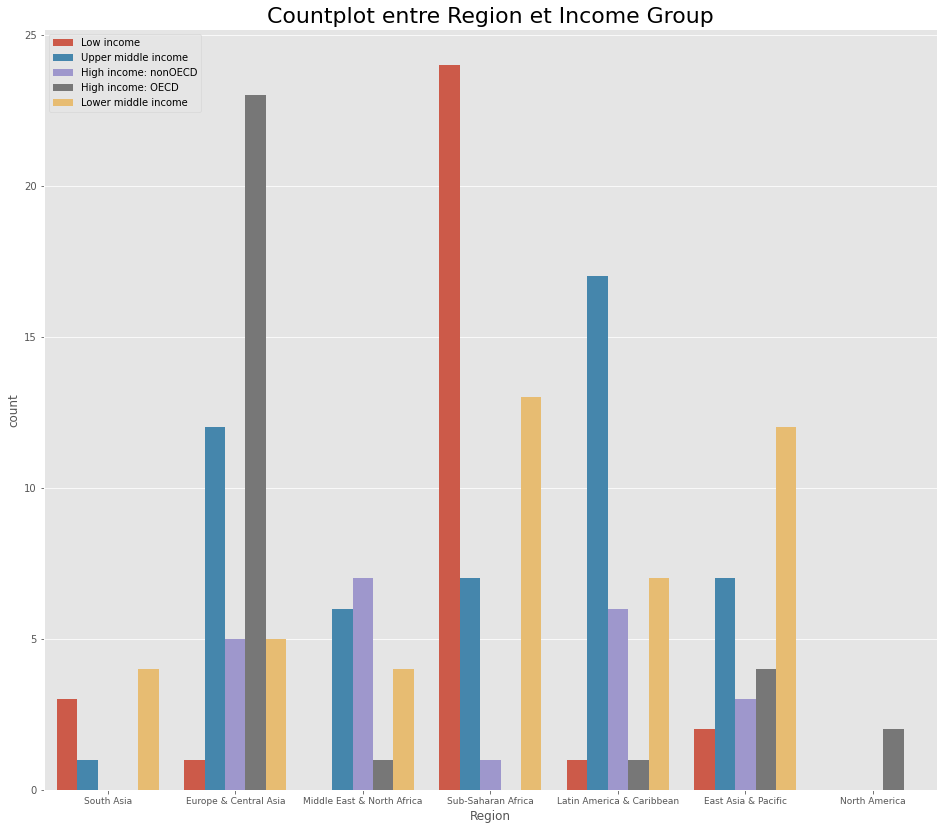

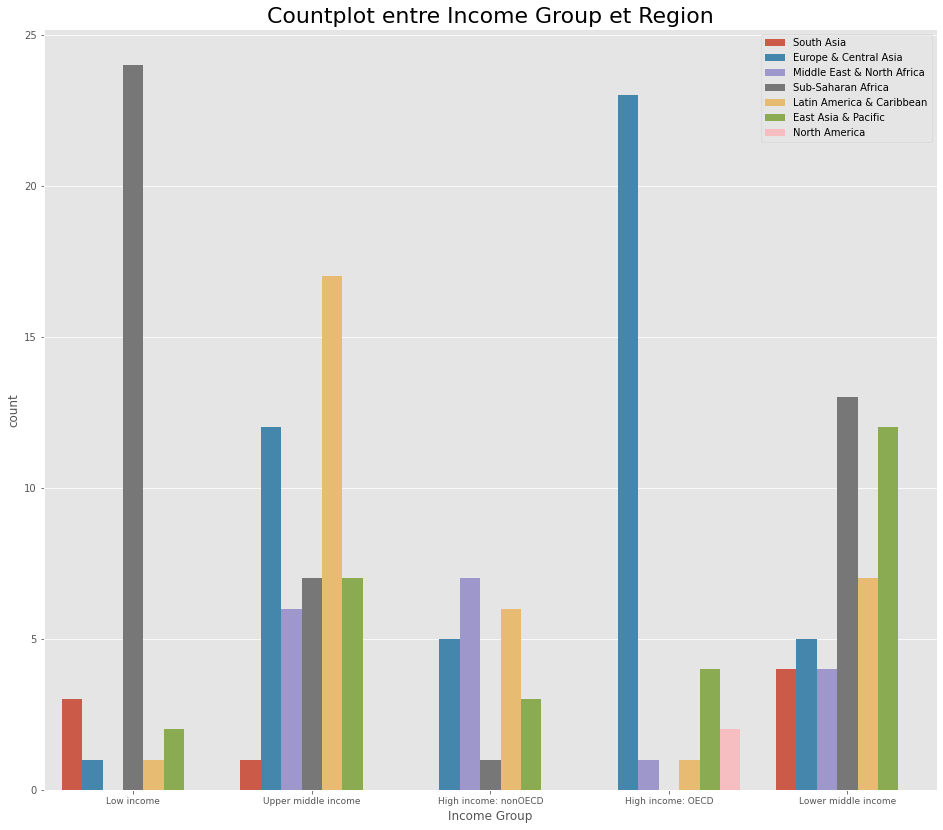

In [ ]:
# boucle pour afficher combinaisons variables catégorielles différentes 
for i in list_var_object[1:]:
  for j in list_var_object[1:]:
    if i!=j :
      countplot_bivariée_categ(df_object,i,j)

In [ ]:
df_object

,Country Name,Region,Income Group
0,Afghanistan,South Asia,Low income
1,Albania,Europe & Central Asia,Upper middle income
2,Algeria,Middle East & North Africa,Upper middle income
3,Angola,Sub-Saharan Africa,Upper middle income
4,Antigua and Barbuda,Latin America & Caribbean,High income: nonOECD
5,Argentina,Latin America & Caribbean,Upper middle income
6,Australia,East Asia & Pacific,High income: OECD
7,Austria,Europe & Central Asia,High income: OECD
8,Azerbaijan,Europe & Central Asia,Upper middle income
9,"Bahamas, The",Latin America & Caribbean,High income: nonOECD


In [ ]:
#la relation entre les group income et les régions sont probablement dépendantes
# test chi2 
contingence = pd.crosstab(df_object['Income Group'],df_object['Region'])
contingence 

from scipy.stats import chi2_contingency

stat, p, dof, expected = chi2_contingency(contingence )
print('stat=%.3f, p=%.3f' % (stat, p))
if p > 0.05:
	print('Probablement indépendant')
else:
	print('la relation entre les group income et les régions sont probablement dépendantes')


stat=139.259, p=0.000
la relation entre les group income et les régions sont probablement dépendantes


In [ ]:
#Tableau contingence margin all
contingence_margins = pd.crosstab(df_object['Income Group'],df_object['Region'],margins=True)
contingence_margins 


Region,East Asia & Pacific,Europe & Central Asia,Latin America & Caribbean,Middle East & North Africa,North America,South Asia,Sub-Saharan Africa,All
Income Group,,,,,,,,
High income: OECD,4,23,1,1,2,0,0,31
High income: nonOECD,3,5,6,7,0,0,1,22
Low income,2,1,1,0,0,3,24,31
Lower middle income,12,5,7,4,0,4,13,45
Upper middle income,7,12,17,6,0,1,7,50
All,28,46,32,18,2,8,45,179


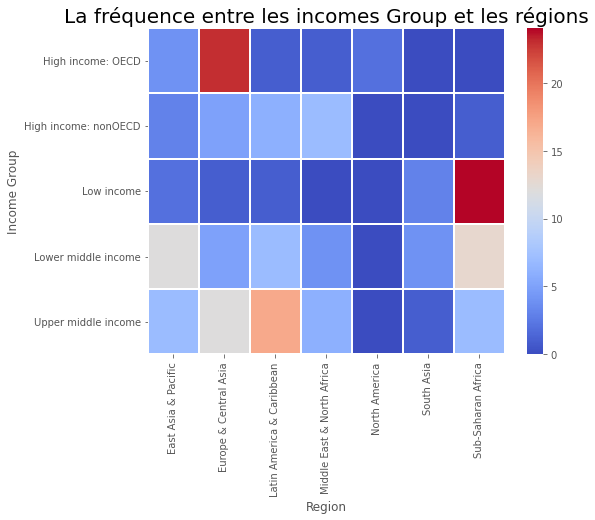

In [ ]:
#La fréquence entre les incomes Group et les régions
plt.figure(figsize=(8,6))
plt.title("La fréquence entre les incomes Group et les régions", size=20)
sns.heatmap(contingence, cmap='coolwarm', linecolor='white', linewidths=1)

## Analyse multivariée

- [X] Boxplot

In [ ]:
# fonction pour afficher boxplot multivariée

def boxplot_multivariée_hue(df, var_cat, var_num, hue):
  meanprops = {'marker':'o', 'markeredgecolor':'black',
                'markerfacecolor':'firebrick'}
  plt.figure(figsize=(16,14))
  plt.title(f"Boxplot entre {var_cat} et {var_num}", size=22)
  sns.boxplot(x=df[var_cat], y=df[var_num],hue=hue, showmeans=True, meanprops=meanprops,data=df)
  plt.xticks(fontsize=9)

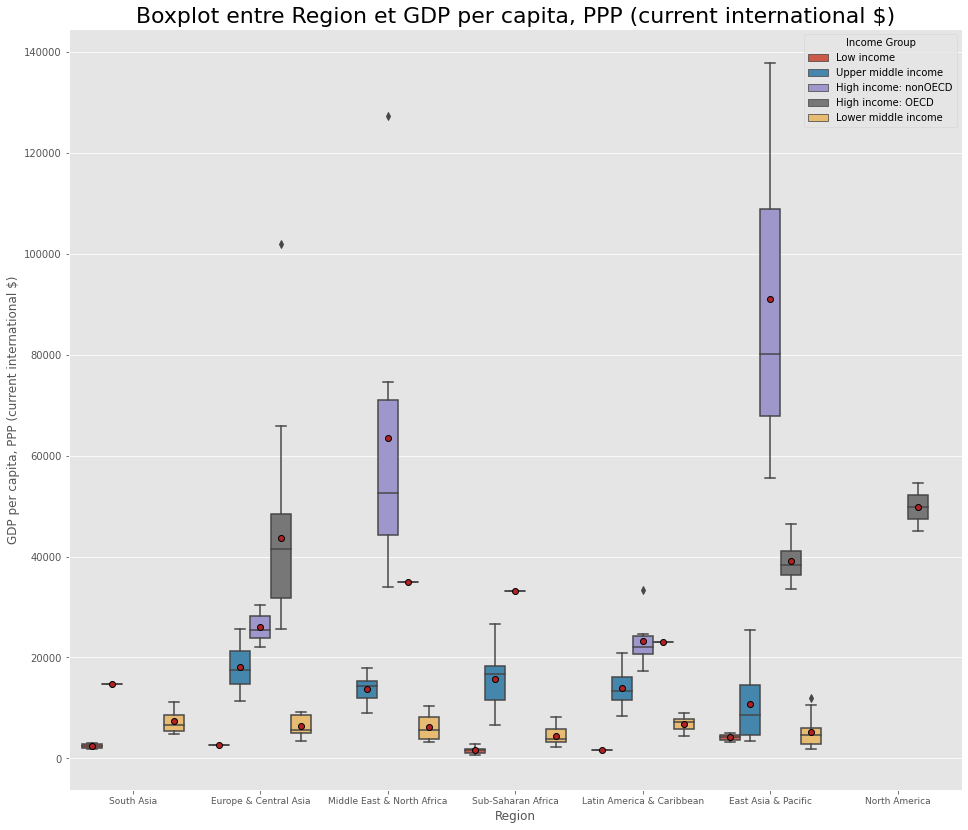

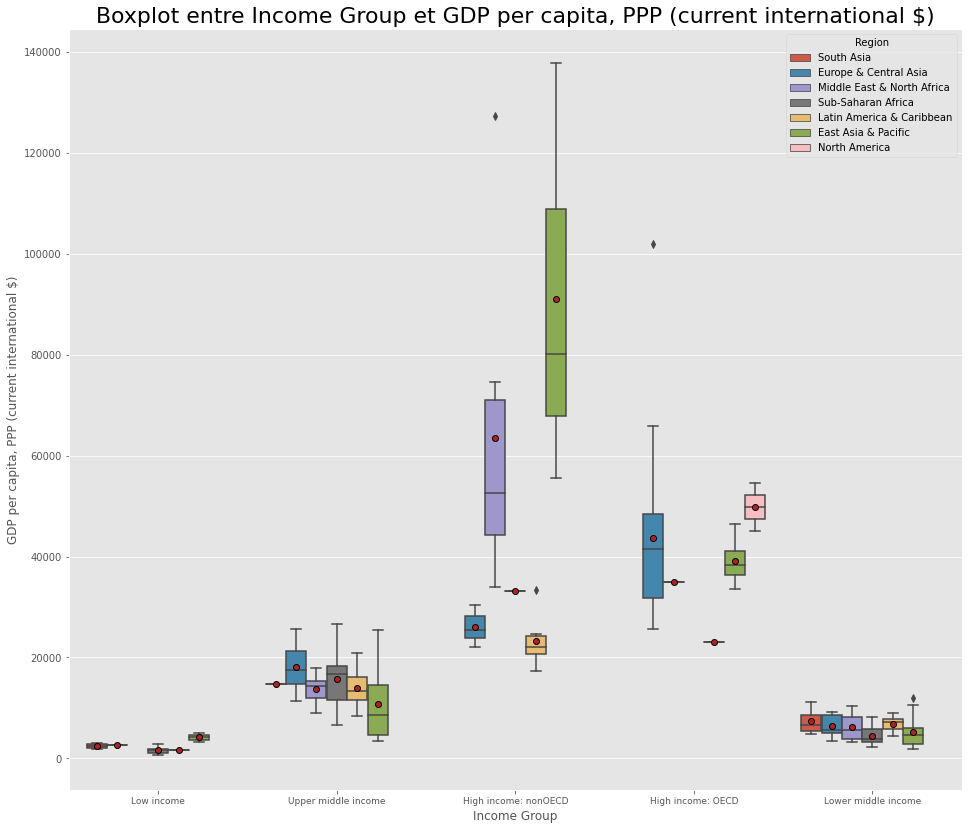

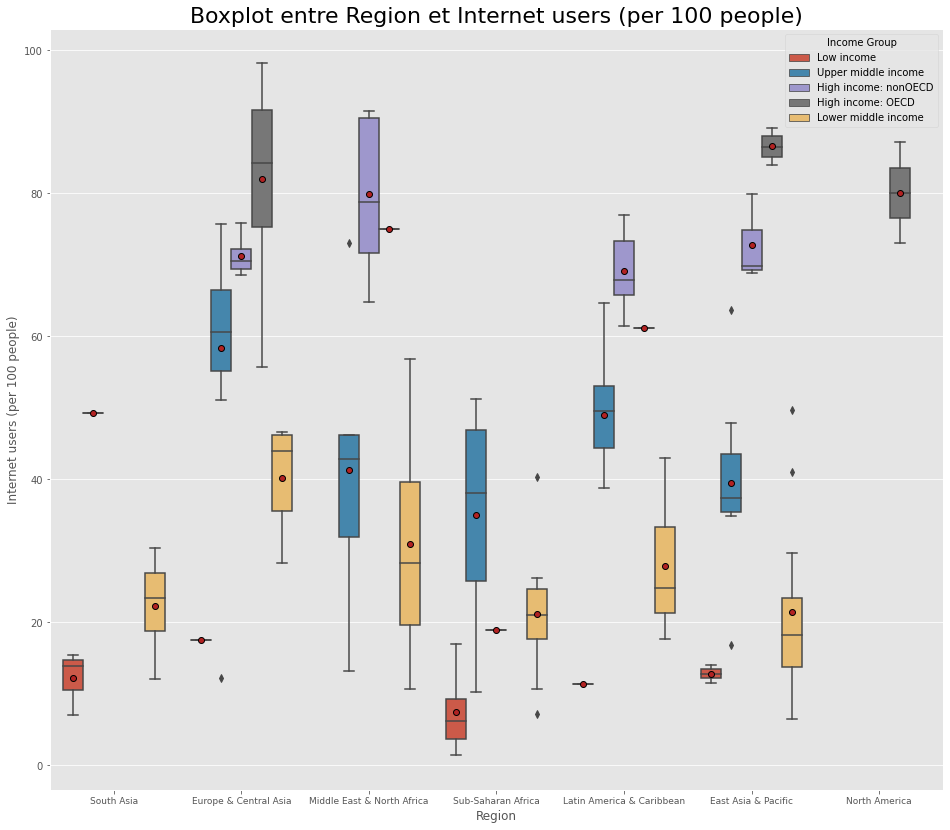

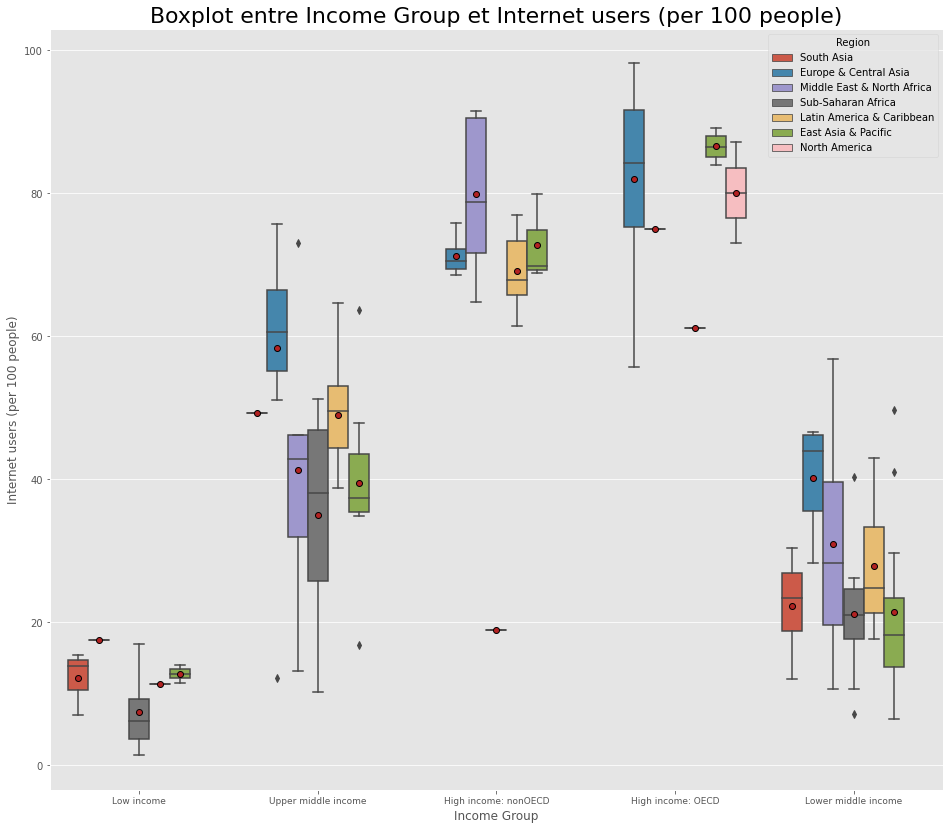

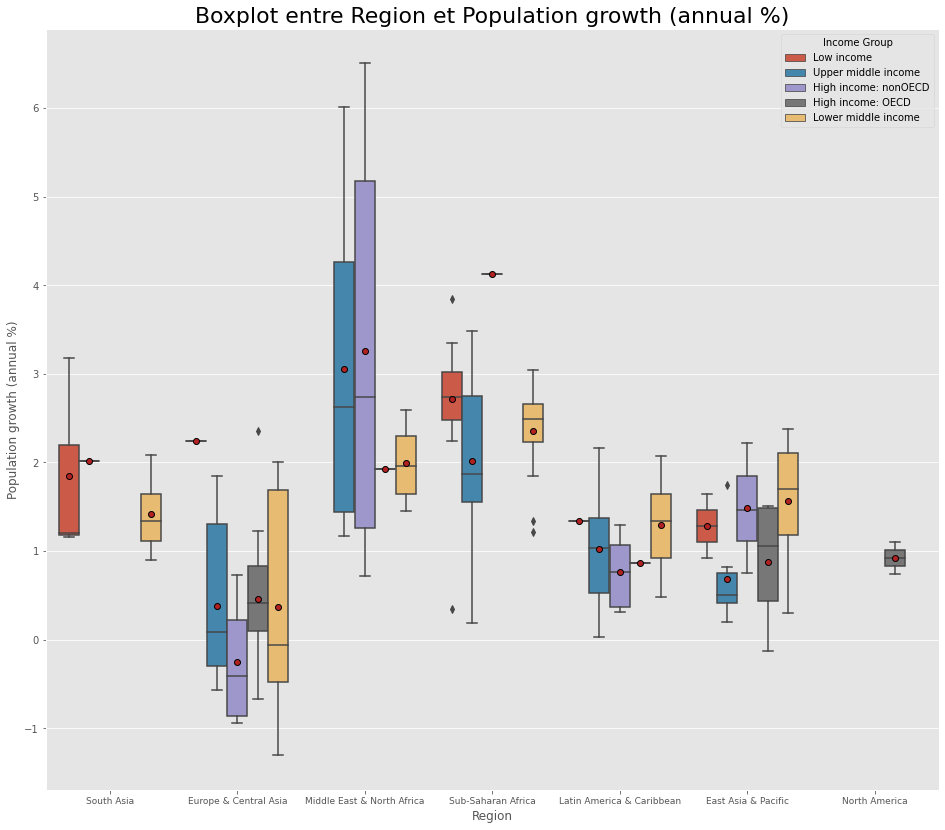

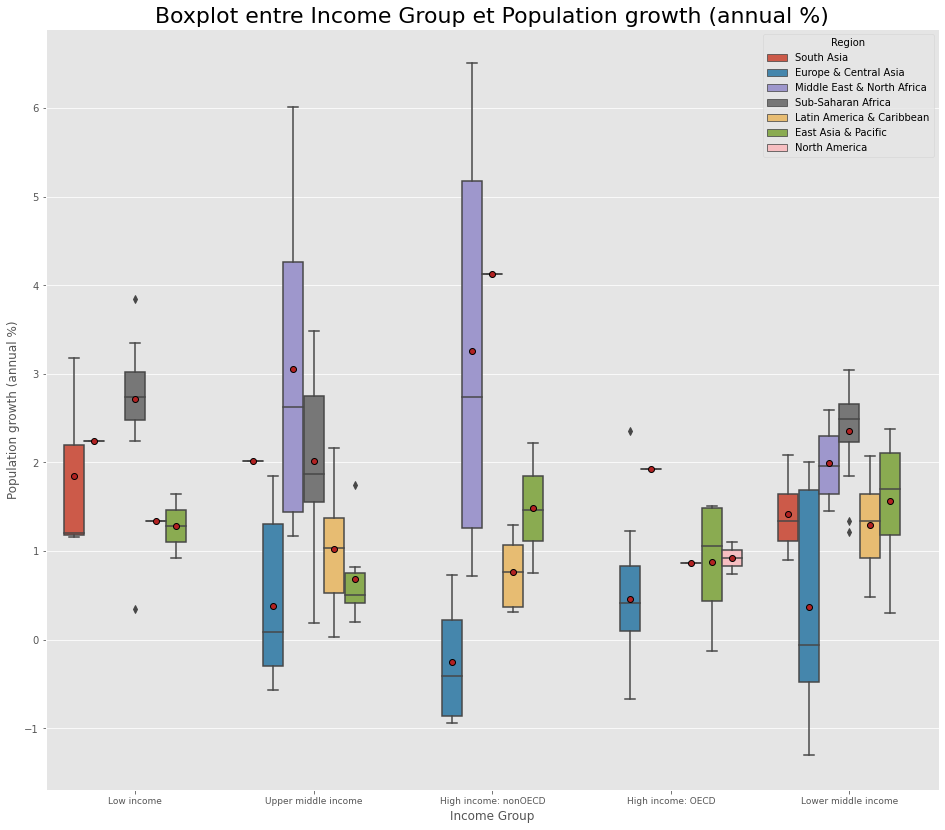

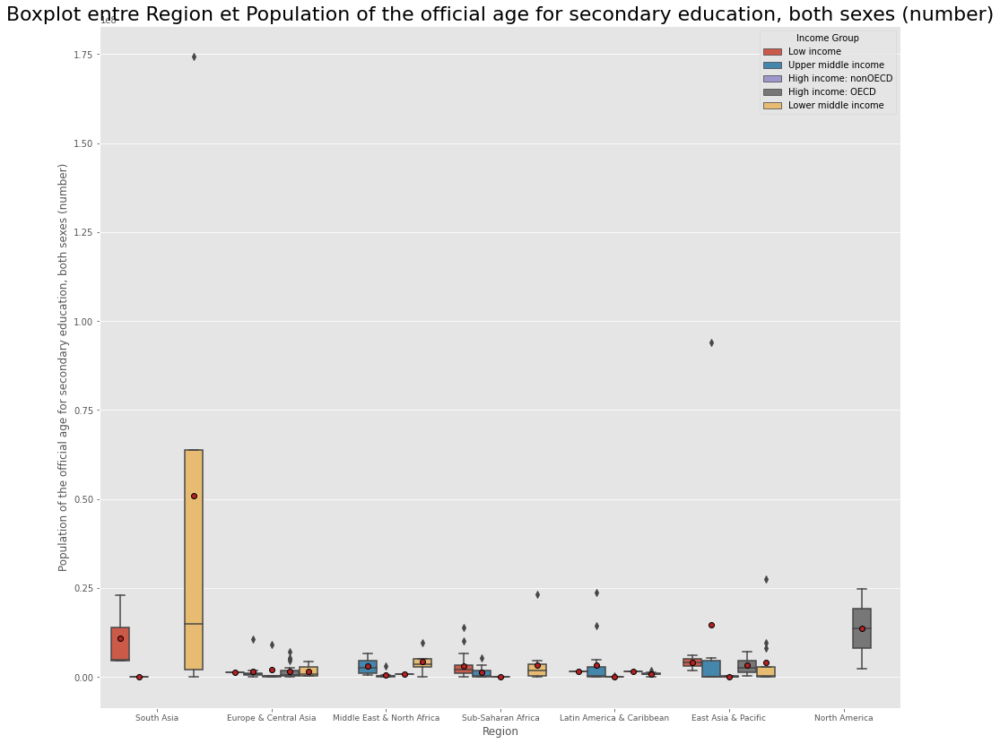

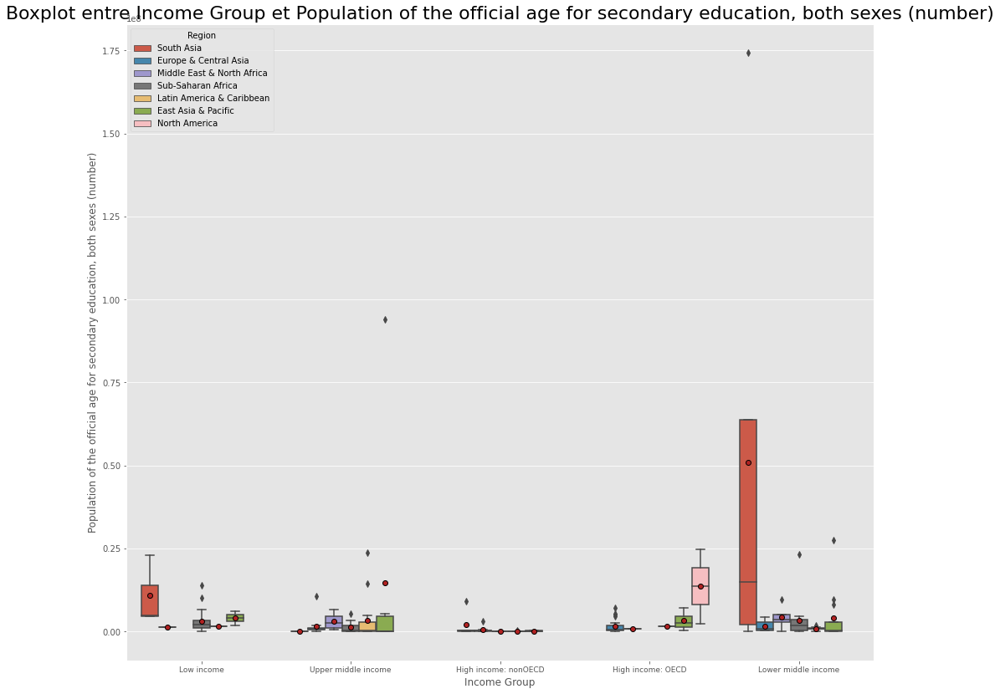

In [ ]:
# boucle pour avoir boxplot multivariée avec combinaisons des variables différentes 
for i in list_var_num[0:4]:
  for j in list_var_object[1:4]:
    if i!=j:
      for e in list_var_object[1:4]:
        if e!=i and e!=j:
          boxplot_multivariée_hue(df_filter_ind_final4, j, i, e)

## Analyse des évolutions 

- [X] Lineplot

### Évolutions des régions par rapport aux indicateurs 

- [x] Evolution des indicateurs par région 

> Utiliser 179 pays qui proviennent du nettoyage 

> Moyenne de chaque pays pour chaque region au fil des années 

> North America a une evolution plus importante mais ne contient que 2 pays (Canada et United states)



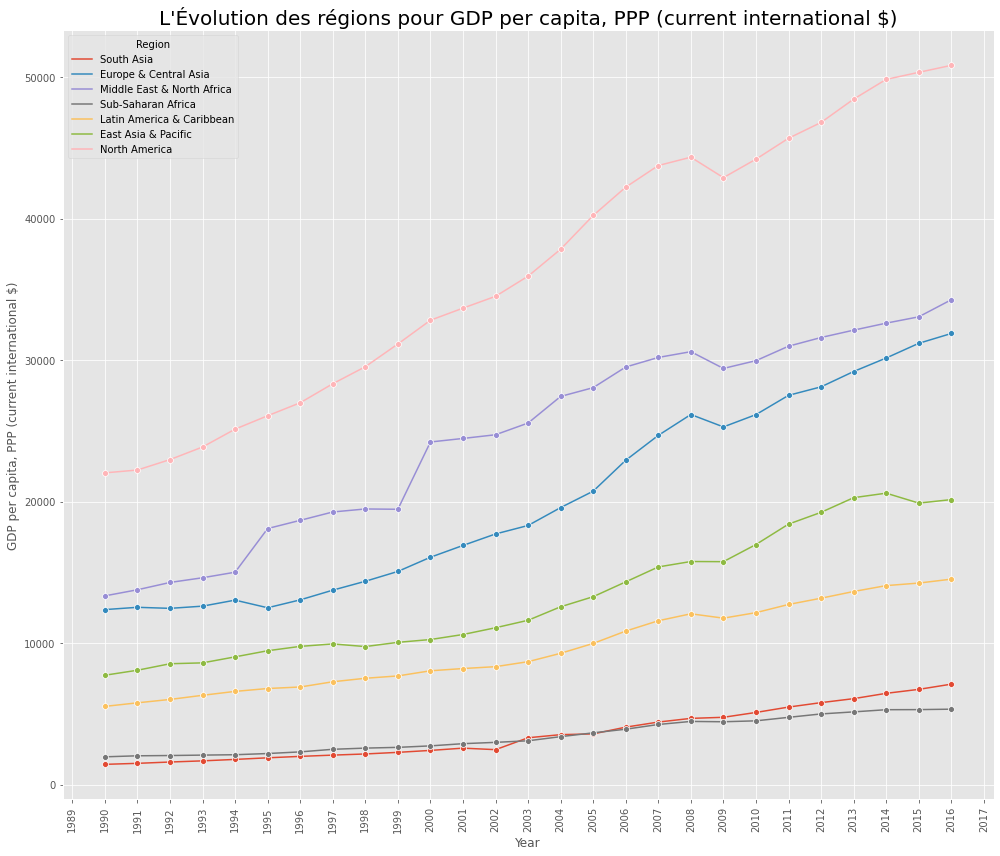

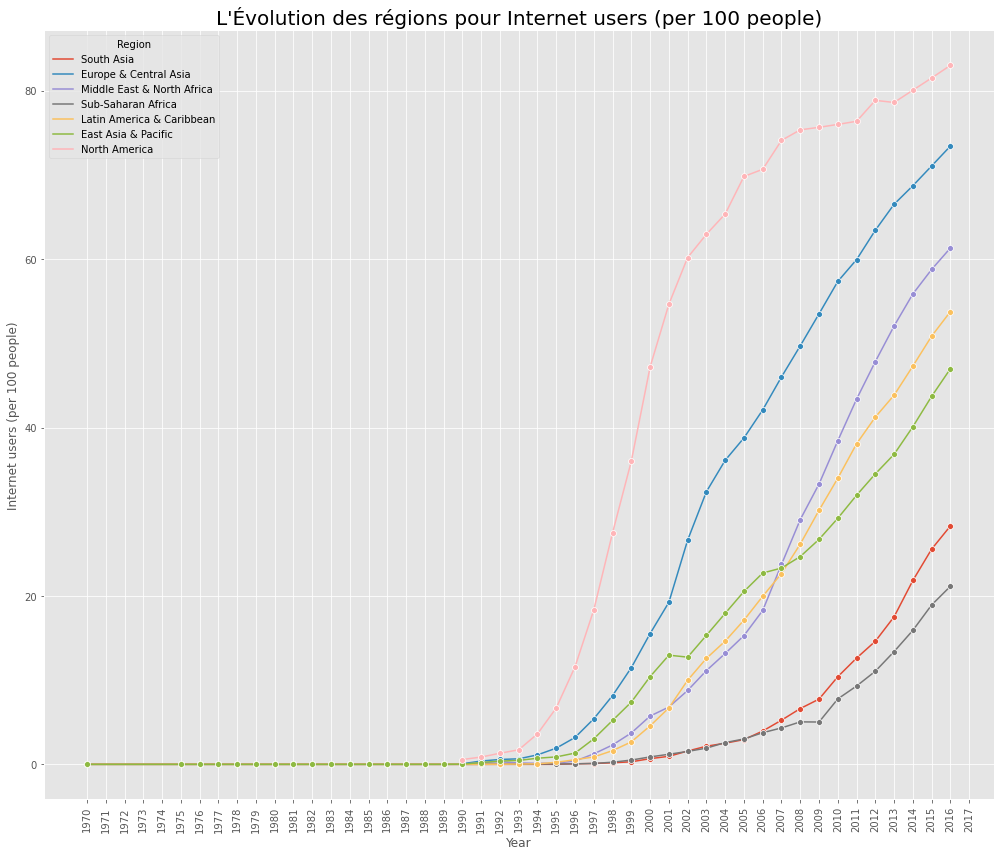

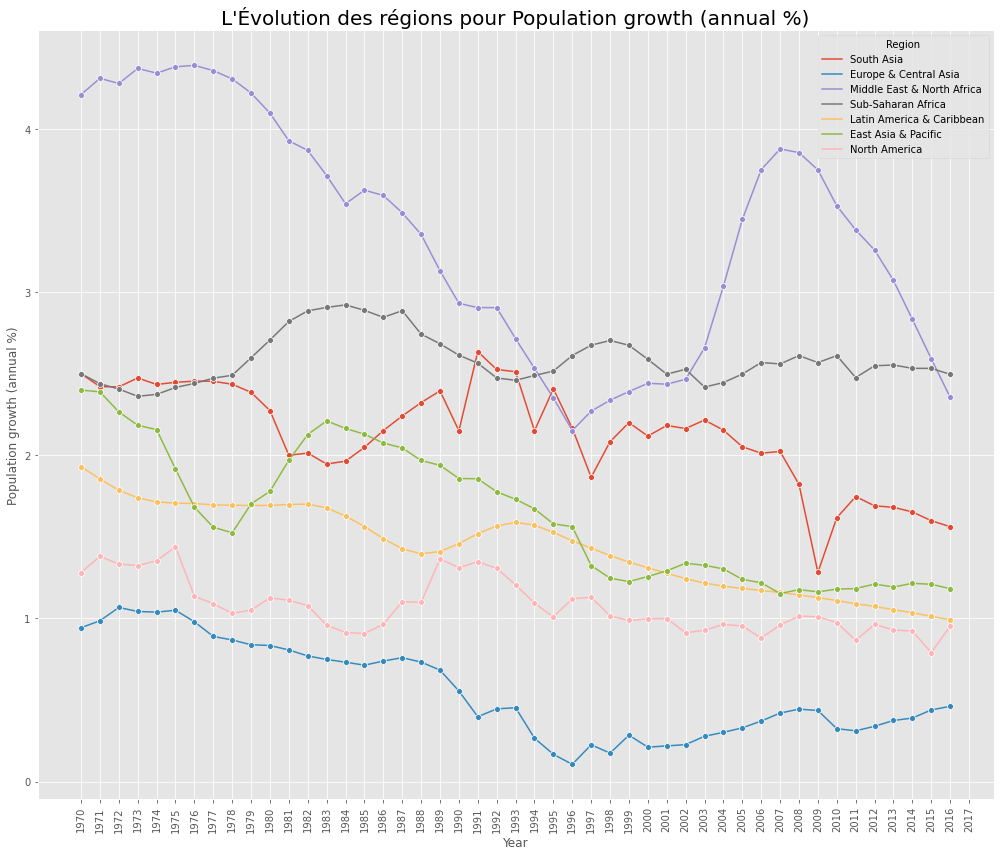

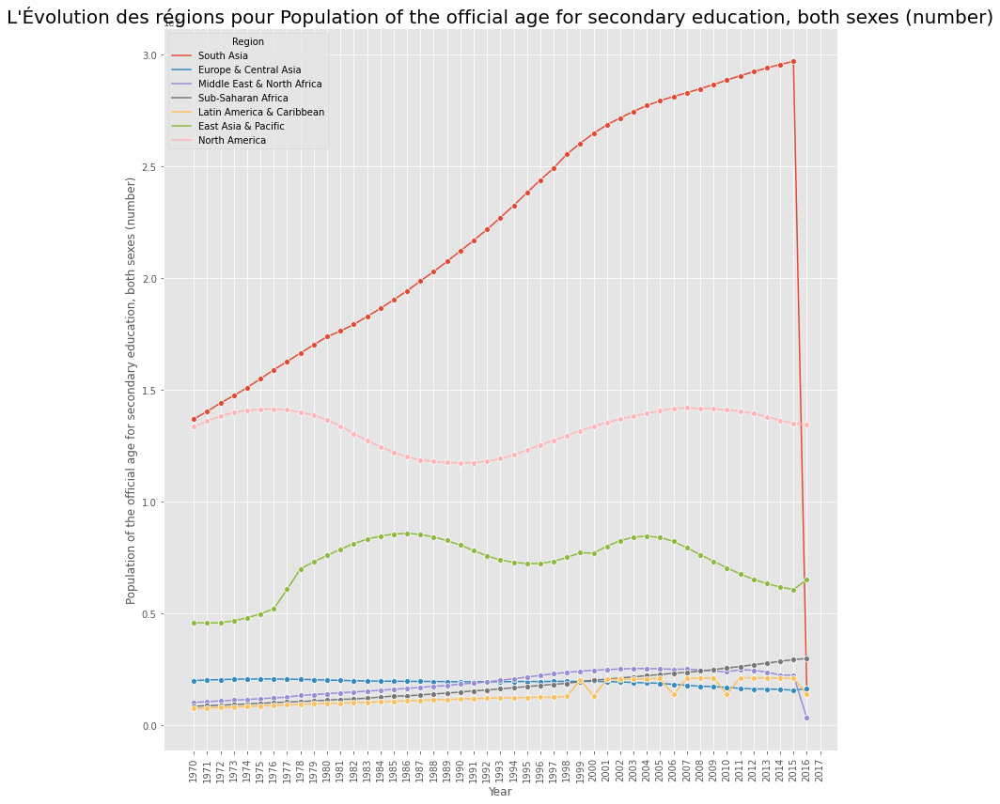

In [ ]:
#Création liste des incidateurs
list_ind_evolution = ['GDP per capita, PPP (current international $)',
       'Internet users (per 100 people)', 'Population growth (annual %)',
       'Population of the official age for secondary education, both sexes (number)']

#Itération pour afficher chaque indicateur selon les années et en hue la region 
for ind in list_ind_evolution:
  df_ind_evol = df_indicator2[df_indicator2['Indicator Name'].isin(list_ind_evolution)]
  df_ind_evol1 = df_ind_evol[df_ind_evol['Country Name'].isin(list_pays_final)]
  df_ind_evol1.drop(['Country Code', 'Topic', 'Long definition'], axis=1, inplace=True)
  df_ind_evol_final = df_ind_evol1.melt(id_vars=["Country Name",'Indicator Name',"Region","Income Group"])
  df_ind_evol_final = df_ind_evol_final.rename(columns={'variable':'Year'})
  df_ind_evol_final1 = df_ind_evol_final[df_ind_evol_final['Indicator Name']==ind]
  plt.figure(figsize=(14,12))
  plt.title(f"L'Évolution des régions pour {ind}", size=20)
  sns.lineplot(data= df_ind_evol_final1,x='Year', y= 'value', hue='Region',marker=('o'), ci = None )
  plt.ylabel(ind)
  plt.xticks(rotation= 90)
  plt.tight_layout()

### Évolutions des income Group par rapport aux indicateurs

- [x] Evolution des indicateurs par Incomme group 

> Utiliser 179 pays qui proviennent du nettoyage 

> Moyenne de chaque pays pour chaque Income Group au fil des années 

- [X] Indicateur économique(PIB) et infrastructure (internet)

> Income group high NonOECD et OECD

- [X] Indicateur population age secondary et growth

> Income group lower et middle 


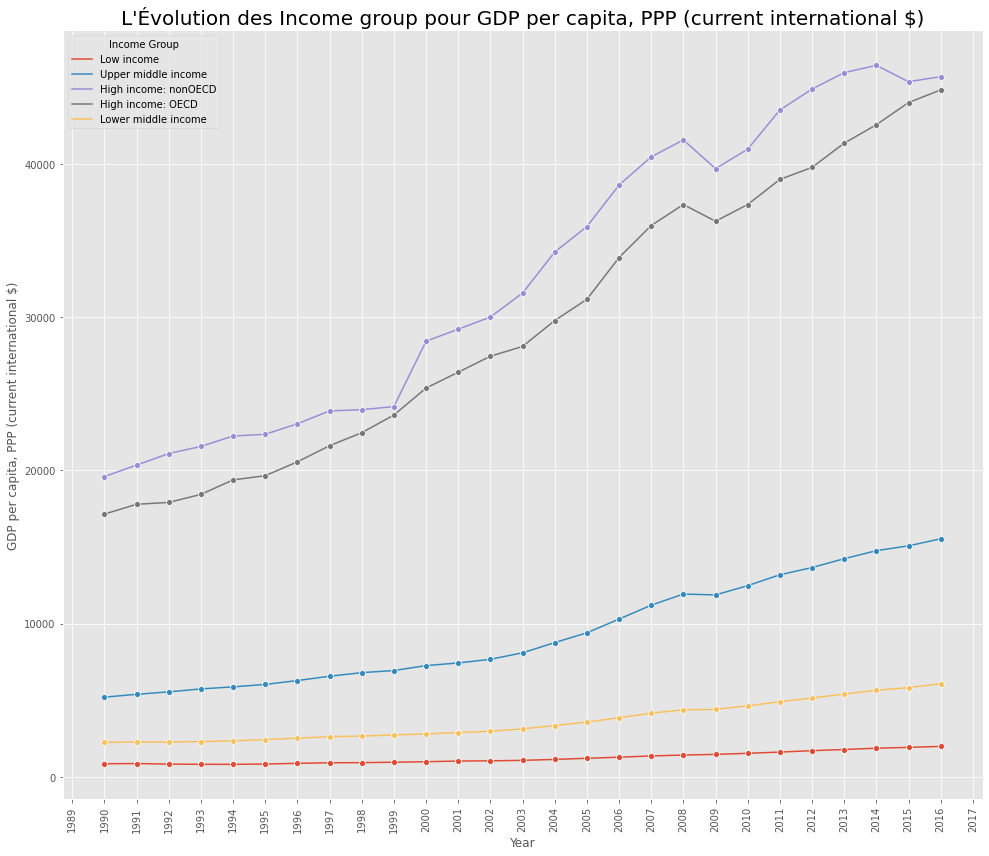

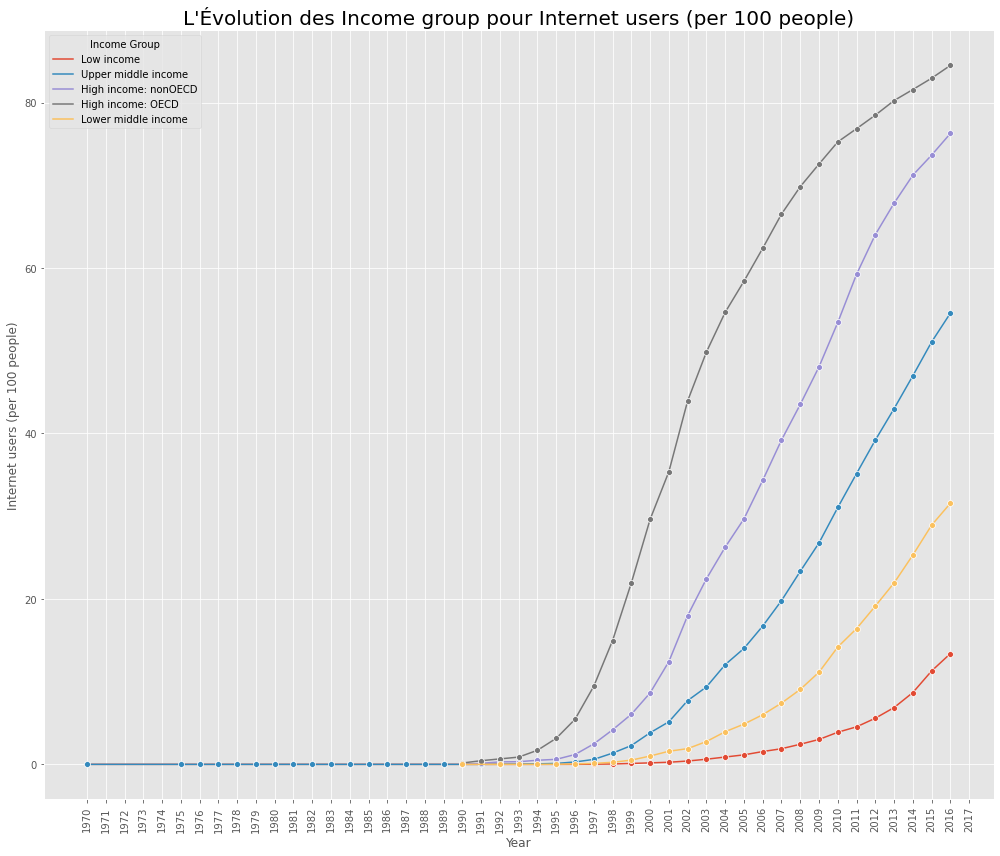

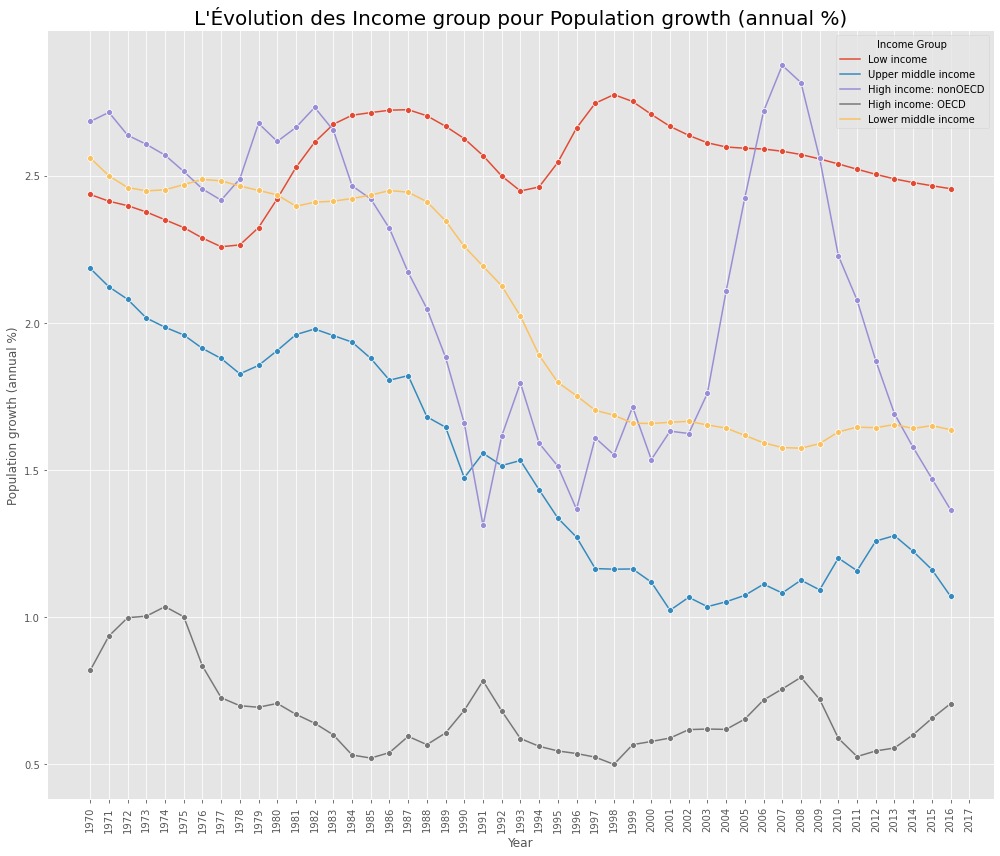

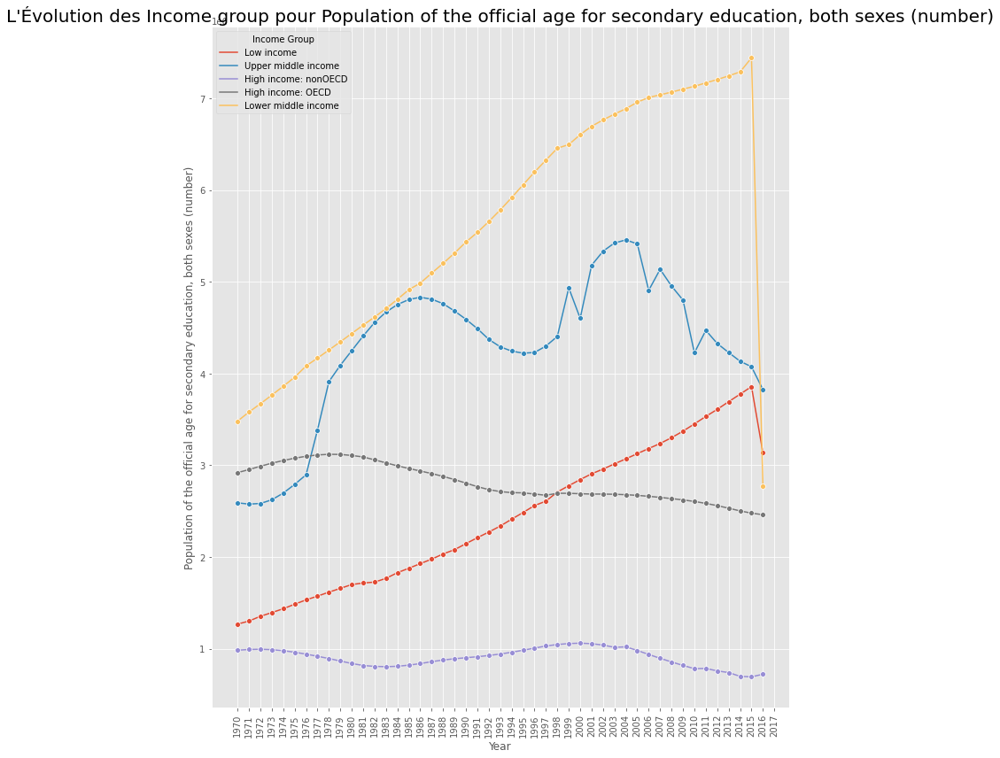

In [ ]:
#Création liste des incidateurs
list_ind_evolution = ['GDP per capita, PPP (current international $)',
       'Internet users (per 100 people)', 'Population growth (annual %)',
       'Population of the official age for secondary education, both sexes (number)']

#Itération pour afficher chaque indicateur selon les années et en hue Income group 
for ind in list_ind_evolution:
  df_ind_evol = df_indicator2[df_indicator2['Indicator Name'].isin(list_ind_evolution)]
  df_ind_evol1 = df_ind_evol[df_ind_evol['Country Name'].isin(list_pays_final)]
  df_ind_evol1.drop(['Country Code', 'Topic', 'Long definition'], axis=1, inplace=True)
  df_ind_evol_final = df_ind_evol1.melt(id_vars=["Country Name",'Indicator Name',"Region","Income Group"])
  df_ind_evol_final = df_ind_evol_final.rename(columns={'variable':'Year'})
  df_ind_evol_final1 = df_ind_evol_final[df_ind_evol_final['Indicator Name']==ind]
  plt.figure(figsize=(14,12))
  plt.title(f"L'Évolution des Income group pour {ind}", size=20)
  sns.lineplot(data= df_ind_evol_final1,x='Year', y= 'value', hue='Income Group',marker=('o'), ci = None )
  plt.ylabel(ind)
  plt.xticks(rotation= 90)
  plt.tight_layout()

# Segmentation des pays 

- [x] Utiliser algorithmes ML non supervisée pour segmenter les pays 


> CAH (Methode du coude et silouhette coefficient suggèrent de couper en 3 clusters 

> Kmeans 


- [X] ACP pour visualiser les clusters 

> visualiser les pays qui sont plutot proche en terme de similitudes 

## Segmentation des pays (CAH)

- [X] Cluster 1

> plus PIB, plus utilissateurs internet et Growth similaire avec cluster 2

- [X] Cluster 2

> Chine et Inde avec le plus de Pop age secondary

> 2 eme position pour les autres indicateurs 


- [X] Cluster 3

> moins PIB, Moins utilisateurs internet, plus growth, pop age secondary assez similaire avec cluster 1


In [ ]:
# voir les colonnes 
df_filter_ind_final4.columns

Index(['Country Name', 'Region', 'Income Group',
       'GDP per capita, PPP (current international $)',
       'Internet users (per 100 people)', 'Population growth (annual %)',
       'Population of the official age for secondary education, both sexes (number)',
       'Income Group enco'],
      dtype='object')

In [ ]:
#Supprimer colonnes et mettre Country en set_index
df_segmentation = df_filter_ind_final4.drop(['Income Group', 'Income Group enco','Region'],axis=1)
df_segmentation = df_segmentation.set_index('Country Name')
df_segmentation

,"GDP per capita, PPP (current international $)",Internet users (per 100 people),Population growth (annual %),"Population of the official age for secondary education, both sexes (number)"
Country Name,,,,
Afghanistan,1875.44740,7.000000,3.183202,4676453.0
Albania,11332.50700,60.100000,-0.207047,345644.0
Algeria,14203.29200,29.500000,2.000666,4140079.0
Angola,6594.39800,10.200000,3.485413,3430540.0
Antigua and Barbuda,20618.99600,67.780000,1.068648,7894.0
Argentina,19801.26000,64.700000,1.032709,4168223.0
Australia,46446.02700,84.000000,1.474288,1723758.0
Austria,49005.16400,80.995830,0.730867,702330.0
Azerbaijan,17607.62300,75.000015,1.248209,923476.0


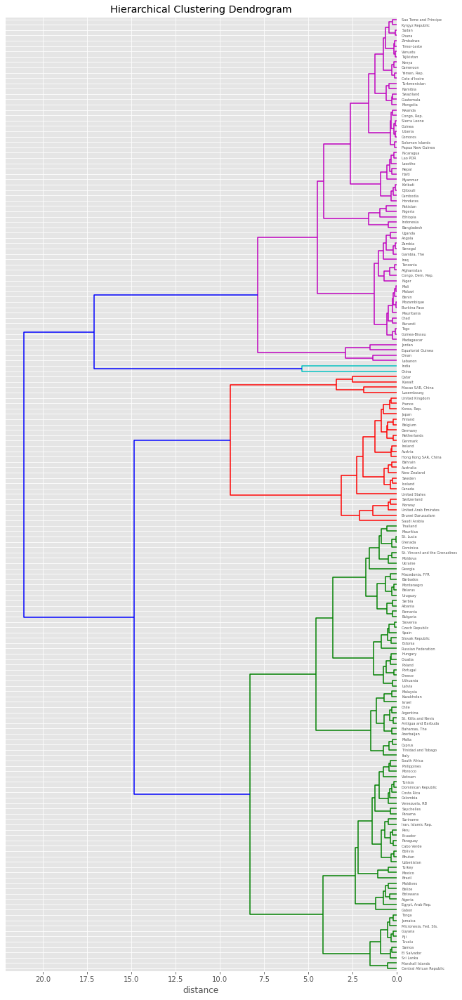

In [ ]:
from sklearn import decomposition
from sklearn import preprocessing
from scipy.cluster.hierarchy import linkage, fcluster


# préparation des données pour le clustering
X = df_segmentation.values
names = df_segmentation.index


# Centrage et Réduction
std_scale = preprocessing.StandardScaler().fit(X)
X_scaled = std_scale.transform(X)

# Clustering hiérarchique
Z = linkage(X_scaled, 'ward')

# Affichage du dendrogramme
plot_dendrogram(Z, names)

Text(0.5, 1.0, ' La méthode du coude montre le nombre optimal de clusters')

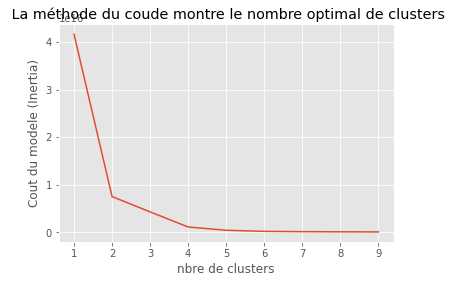

In [ ]:
# Visualisation méthode du coude pour trouver le nombre clusters optimal
inertia = []
K_range = range(1, 10)
for k in K_range:
    model = KMeans(n_clusters=k).fit(df_segmentation)
    inertia.append(model.inertia_)

plt.plot(K_range, inertia)
plt.xlabel('nbre de clusters')
plt.ylabel('Cout du modele (Inertia)')
plt.title(' La méthode du coude montre le nombre optimal de clusters')

In [ ]:
#Couper dendogramme 3 clusters
clusters = fcluster(Z, 3, criterion='maxclust')
clusters

array([3, 1, 1, 3, 1, 1, 1, 1, 1, 1, 1, 3, 1, 1, 1, 1, 3, 1, 1, 1, 1, 1,
       1, 3, 3, 1, 3, 3, 1, 1, 3, 1, 2, 1, 3, 3, 3, 1, 3, 1, 1, 1, 1, 3,
       1, 1, 1, 1, 1, 3, 1, 3, 1, 1, 1, 1, 3, 1, 1, 3, 1, 1, 3, 3, 3, 1,
       3, 3, 1, 1, 1, 2, 3, 1, 3, 1, 1, 1, 1, 1, 3, 1, 3, 3, 1, 1, 3, 3,
       1, 3, 3, 3, 1, 1, 1, 1, 3, 3, 1, 1, 3, 1, 1, 3, 1, 1, 1, 1, 3, 1,
       1, 3, 3, 3, 3, 1, 1, 3, 3, 3, 1, 3, 3, 1, 3, 1, 1, 1, 1, 1, 1, 1,
       1, 3, 1, 3, 1, 3, 1, 1, 3, 1, 1, 3, 1, 1, 1, 1, 1, 1, 3, 1, 3, 1,
       1, 3, 3, 1, 3, 3, 1, 1, 1, 1, 3, 1, 3, 1, 1, 1, 1, 1, 1, 3, 1, 1,
       3, 3, 3], dtype=int32)

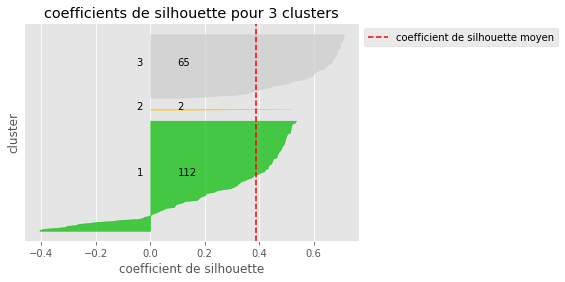

<Figure size 1440x720 with 0 Axes>

In [ ]:
# Visualisation de la silouhette des clusters

plt.rc('axes', labelsize=12)

plt.figure(figsize=(20,10))
plot_silhouettes(X_scaled, clusters)

In [ ]:
#La metrics pour la silhouette des clusters 
metrics.silhouette_score(X_scaled, clusters)

0.38874935366308266

In [ ]:
#Création dataframe pour les clusters 
clusters = pd.DataFrame(clusters)
DF = df_segmentation.reset_index()
DF1= pd.concat([DF,clusters], axis=1)
DF1 = DF1.rename(columns={0:'cluster'})
DF1[DF1['cluster']==1]

,Country Name,"GDP per capita, PPP (current international $)",Internet users (per 100 people),Population growth (annual %),"Population of the official age for secondary education, both sexes (number)",cluster
1,Albania,11332.50700,60.100000,-0.207047,345644.0,1
2,Algeria,14203.29200,29.500000,2.000666,4140079.0,1
4,Antigua and Barbuda,20618.99600,67.780000,1.068648,7894.0,1
5,Argentina,19801.26000,64.700000,1.032709,4168223.0,1
6,Australia,46446.02700,84.000000,1.474288,1723758.0,1
7,Austria,49005.16400,80.995830,0.730867,702330.0,1
8,Azerbaijan,17607.62300,75.000015,1.248209,923476.0,1
9,"Bahamas, The",23190.25200,76.920000,1.298133,34098.0,1
10,Bahrain,46178.08000,90.503136,1.582802,91101.0,1
12,Barbados,17234.14000,75.160000,0.309599,18859.0,1


In [ ]:
# afficher les clusters 
for c in range(1,4):
  print('---------------------------------------------')
  print(f'Les pays du cluster {c}')
  clus = DF1[DF1['cluster']==c]["Country Name"].unique()
  print(clus)

---------------------------------------------
Les pays du cluster 1
['Albania' 'Algeria' 'Antigua and Barbuda' 'Argentina' 'Australia'
 'Austria' 'Azerbaijan' 'Bahamas, The' 'Bahrain' 'Barbados' 'Belarus'
 'Belgium' 'Belize' 'Bhutan' 'Bolivia' 'Botswana' 'Brazil'
 'Brunei Darussalam' 'Bulgaria' 'Cabo Verde' 'Canada'
 'Central African Republic' 'Chile' 'Colombia' 'Costa Rica' 'Croatia'
 'Cyprus' 'Czech Republic' 'Denmark' 'Dominica' 'Dominican Republic'
 'Ecuador' 'Egypt, Arab Rep.' 'El Salvador' 'Estonia' 'Fiji' 'Finland'
 'France' 'Gabon' 'Georgia' 'Germany' 'Greece' 'Grenada' 'Guyana'
 'Hong Kong SAR, China' 'Hungary' 'Iceland' 'Iran, Islamic Rep.' 'Ireland'
 'Israel' 'Italy' 'Jamaica' 'Japan' 'Kazakhstan' 'Korea, Rep.' 'Kuwait'
 'Latvia' 'Lithuania' 'Luxembourg' 'Macao SAR, China' 'Macedonia, FYR'
 'Malaysia' 'Maldives' 'Malta' 'Marshall Islands' 'Mauritius' 'Mexico'
 'Micronesia, Fed. Sts.' 'Moldova' 'Montenegro' 'Morocco' 'Netherlands'
 'New Zealand' 'Norway' 'Panama' 'Paraguay' '

In [ ]:
# Création dataframe pour les données standardisées 
centre_reduit= pd.DataFrame(X_scaled, columns= df_segmentation.columns)
# Concaténation entre df clusters et les données standardisées 
clus_centre_reduit = pd.concat([centre_reduit, clusters], axis=1)
clus_centre_reduit = clus_centre_reduit.rename(columns={0:'cluster'})
clus_centre_reduit

,"GDP per capita, PPP (current international $)",Internet users (per 100 people),Population growth (annual %),"Population of the official age for secondary education, both sexes (number)",cluster
0,-0.789817,-1.309800,1.333867,0.033898,3
1,-0.352080,0.576213,-1.322808,-0.249966,1
2,-0.219200,-0.510642,0.407206,-0.001259,1
3,-0.571392,-1.196142,1.570686,-0.047766,3
4,0.077762,0.848993,-0.323144,-0.272104,1
5,0.039912,0.739597,-0.351307,0.000586,1
6,1.273213,1.425097,-0.005276,-0.159637,1
7,1.391668,1.318394,-0.587837,-0.226587,1
8,-0.061625,1.105434,-0.182436,-0.212092,1
9,0.196778,1.173628,-0.143315,-0.270387,1


In [ ]:
# les centroïdes des groupes et leurs coordonnées dans chacune des dimensions
centroide_CAH= clus_centre_reduit.groupby('cluster').mean()
centroide_CAH

,"GDP per capita, PPP (current international $)",Internet users (per 100 people),Population growth (annual %),"Population of the official age for secondary education, both sexes (number)"
cluster,,,,
1,0.380961,0.591032,-0.481050,-0.132367
2,-0.434179,-0.334827,-0.496190,8.519932
3,-0.643065,-1.008091,0.844153,-0.034073


In [ ]:
# Voir les colonnes 
centroide_CAH.columns

Index(['GDP per capita, PPP (current international $)',
       'Internet users (per 100 people)', 'Population growth (annual %)',
       'Population of the official age for secondary education, both sexes (number)'],
      dtype='object')

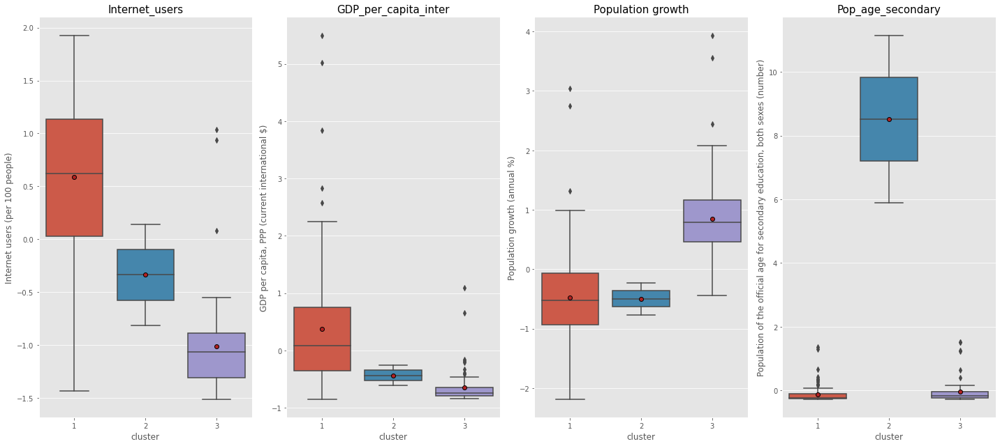

In [ ]:
# Comparer chaque clusters pour chaque dimensions

meanprops = {'marker':'o', 'markeredgecolor':'black',
            'markerfacecolor':'firebrick'}

_, axes = plt.subplots (1, 4 ,sharey = False, figsize = (20, 9)) 
sns.boxplot(x = 'cluster', y = 'Internet users (per 100 people)', 
            data = clus_centre_reduit, showmeans=True,meanprops=meanprops, ax = axes [0])
axes[0].set_title("Internet_users",size=15); 

plt.subplots_adjust(hspace=50)
sns.boxplot(x = 'cluster', y = 'GDP per capita, PPP (current international $)', 
               data =  clus_centre_reduit, showmeans=True,meanprops=meanprops, ax = axes [1])
axes[1].set_title("GDP_per_capita_inter",size=15);
plt.subplots_adjust(hspace=50)

sns.boxplot(x = 'cluster', y = 'Population growth (annual %)', 
               data = clus_centre_reduit ,showmeans=True,meanprops=meanprops, ax = axes [2])
axes[2].set_title("Population growth",size=15);
plt.subplots_adjust(hspace=50)


sns.boxplot(x = 'cluster', y = 'Population of the official age for secondary education, both sexes (number)', 
               data = clus_centre_reduit ,showmeans=True,meanprops=meanprops, ax = axes [3])
axes[3].set_title("Pop_age_secondary", size=15);


plt.tight_layout()


(array([0, 1, 2, 3]), <a list of 4 Text major ticklabel objects>)

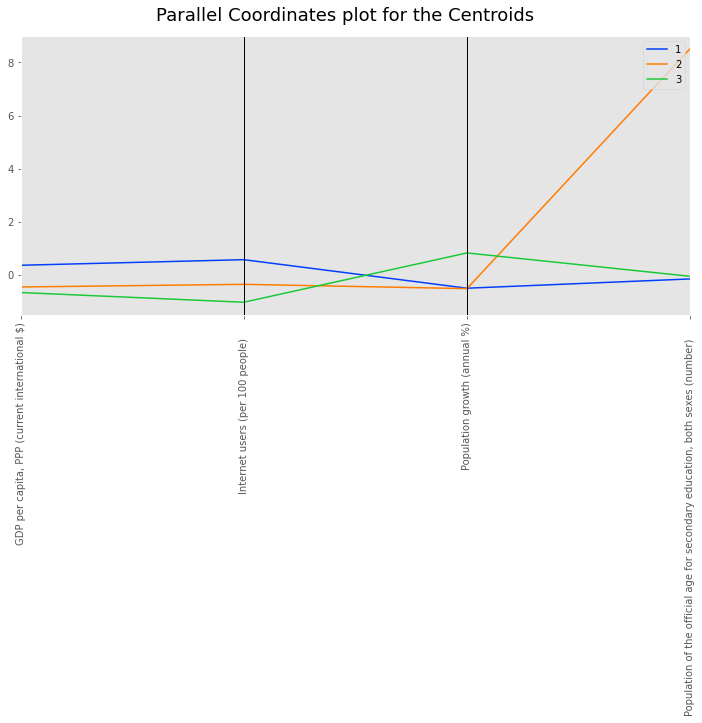

In [ ]:
# les centroïdes des groupes et leurs coordonnées dans chacune des dimensions
display_parallel_coordinates_centroids(centroide_CAH.reset_index(), 2)
plt.xticks(rotation=90)

###  ACP pour CAH 

- [X] Conserver 95% de la variance expliquée


- [X] Projections des pays et des indicateurs 

In [ ]:
# Supprimer Country Name pour Cluster set_index
DF_ACP_CAH = DF1.drop('Country Name',axis=1).set_index('cluster')
DF_ACP_CAH

,"GDP per capita, PPP (current international $)",Internet users (per 100 people),Population growth (annual %),"Population of the official age for secondary education, both sexes (number)"
cluster,,,,
3,1875.44740,7.000000,3.183202,4676453.0
1,11332.50700,60.100000,-0.207047,345644.0
1,14203.29200,29.500000,2.000666,4140079.0
3,6594.39800,10.200000,3.485413,3430540.0
1,20618.99600,67.780000,1.068648,7894.0
1,19801.26000,64.700000,1.032709,4168223.0
1,46446.02700,84.000000,1.474288,1723758.0
1,49005.16400,80.995830,0.730867,702330.0
1,17607.62300,75.000015,1.248209,923476.0


In [ ]:
# voir les colonnes 
DF_ACP_CAH.columns

Index(['GDP per capita, PPP (current international $)',
       'Internet users (per 100 people)', 'Population growth (annual %)',
       'Population of the official age for secondary education, both sexes (number)'],
      dtype='object')

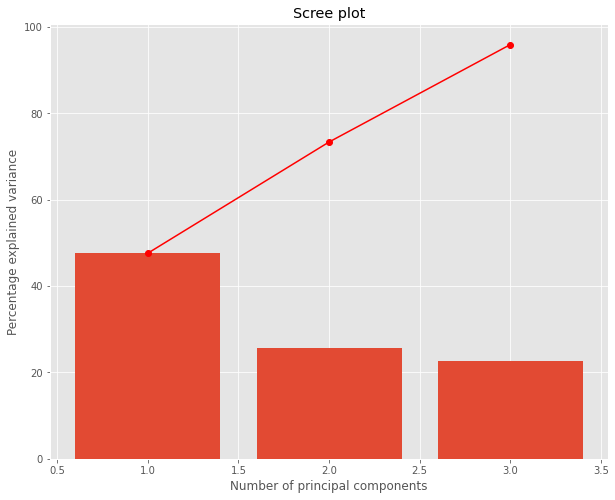

<Figure size 1080x864 with 0 Axes>

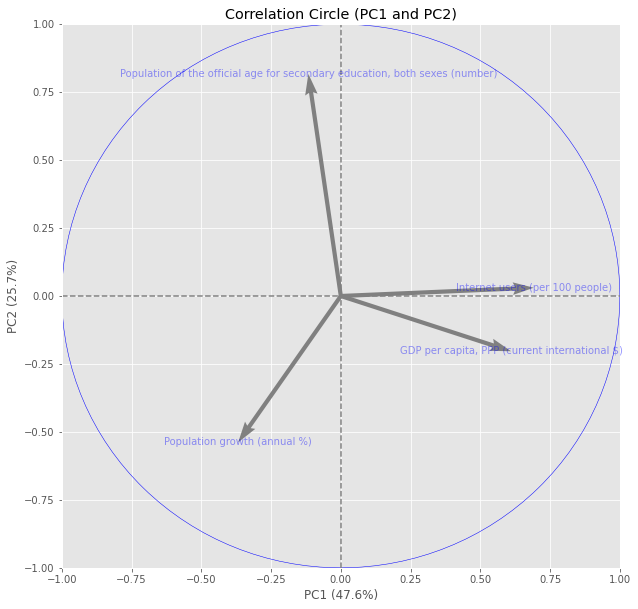

AttributeError: ignored

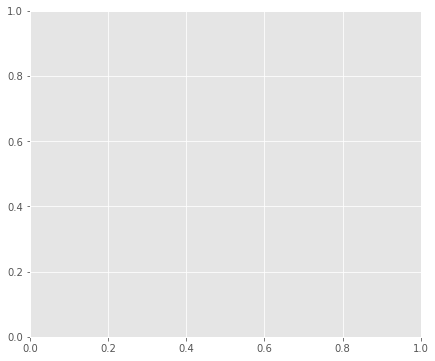

In [ ]:
# selection des colonnes à prendre en compte dans l'ACP
data_pca =DF_ACP_CAH[['GDP per capita, PPP (current international $)', 'Internet users (per 100 people)','Population growth (annual %)','Population of the official age for secondary education, both sexes (number)']]
X = data_pca.values
names = DF_ACP_CAH.index
features = DF_ACP_CAH.columns

# Centrage et Réduction
std_scale = preprocessing.StandardScaler().fit(X)
X_scaled = std_scale.transform(X)

# Calcul des composantes principales
pca = decomposition.PCA(n_components=0.95)
df_composantes= pca.fit_transform(X_scaled)

# Eboulis des valeurs propres
plt.figure(figsize=(10,8))
display_scree_plot(pca)


# Cercle des corrélations
plt.figure(figsize=(15,12))
pcs = pca.components_
display_circles(pcs,3, pca, [(0,1),(2,3),(4,5)], labels = np.array(features))



display_factorial_planes(df_composantes, 2, pca, [(0,1)], illustrative_var = clusters, alpha = 0.8)


#X_projected = pca.transform(X_scaled)
#display_factorial_planes(X_projected, 4, pca, [(0,1),(2,3),(4,5)], labels = np.array(names),cmap='coolwarm')

#plt.show()

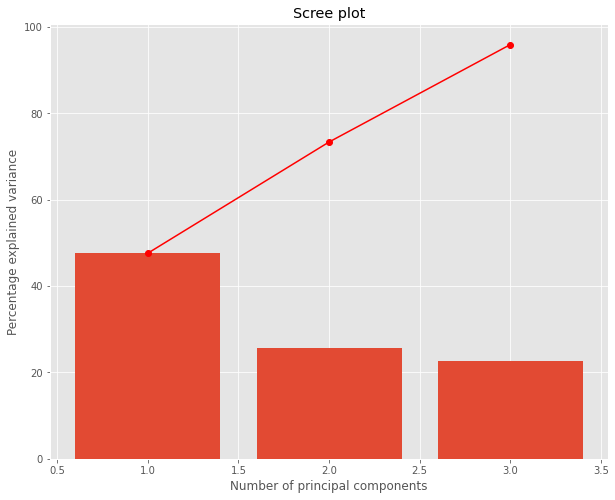

<Figure size 1080x864 with 0 Axes>

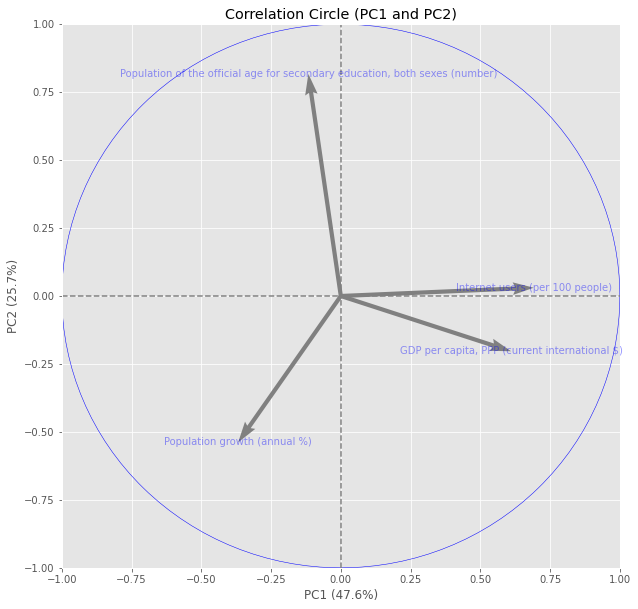

AttributeError: ignored

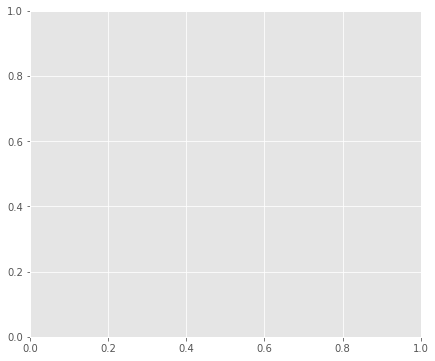

In [ ]:
# selection des colonnes à prendre en compte dans l'ACP
data_pca = DF_ACP_CAH[['GDP per capita, PPP (current international $)', 'Internet users (per 100 people)','Population growth (annual %)','Population of the official age for secondary education, both sexes (number)']]
X = data_pca.values
names = DF_ACP_CAH.index
features = DF_ACP_CAH.columns

# Centrage et Réduction
std_scale = preprocessing.StandardScaler().fit(X)
X_scaled = std_scale.transform(X)

# Calcul des composantes principales
pca = decomposition.PCA(n_components=0.95)
df_composantes= pca.fit_transform(X_scaled)

# Eboulis des valeurs propres
plt.figure(figsize=(10,8))
display_scree_plot(pca)


# Cercle des corrélations
plt.figure(figsize=(15,12))
pcs = pca.components_
display_circles(pcs,3, pca, [(0,1),(2,3),(4,5)], labels = np.array(features))



display_factorial_planes(df_composantes, 2, pca, [(0,1)], illustrative_var = clusters, alpha = 0.8)


Text(0.5, 1.0, 'Les corrélations entres les indicateurs ')

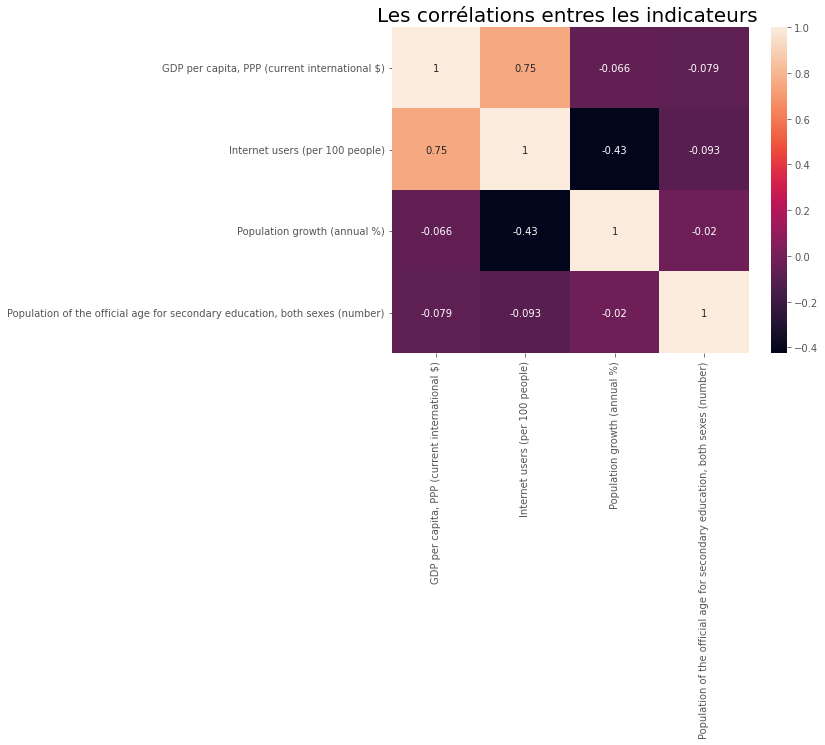

In [ ]:
#les corrélations entre les variables
plt.figure(figsize=(8,6))
plt.xticks(rotation = 45)
sns.heatmap(DF_ACP_CAH.corr(), annot=True)
plt.title('Les corrélations entres les indicateurs ', size=20)

Text(0.5, 1.0, 'Les corrélations sur les axes des plans factorielles ')

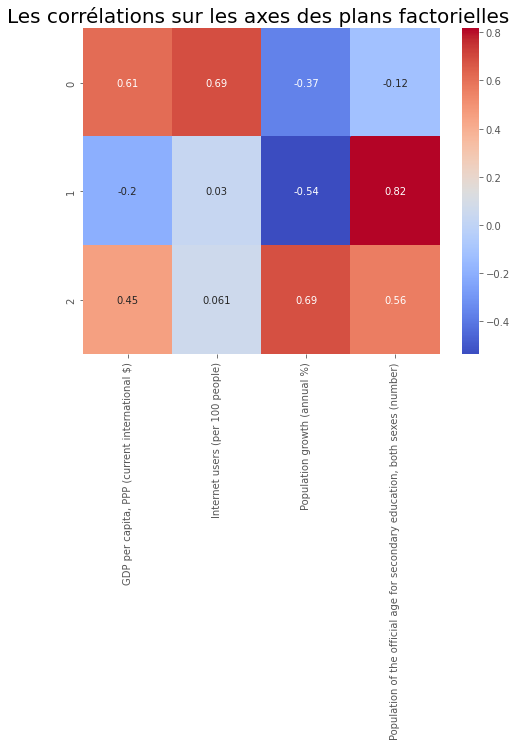

In [ ]:
# drop clusters pour avoir que les noms des vecteurs 
# dataframe avec colonnes et valeurs propres

df_comp = pd.DataFrame(pca.components_, columns=DF_ACP_CAH.columns)
# voir corrélation des valeurs propre avec les axes du plan factorielle 

plt.figure(figsize=(8,6))
plt.xticks(rotation = 45)
sns.heatmap(df_comp,annot=True,cmap='coolwarm',) 
plt.title('Les corrélations sur les axes des plans factorielles ', size=20)

In [ ]:
#Visualiser les pays sur le 1 er plan factoriel

import plotly.express as px
from sklearn.decomposition import PCA
#DF_ACP_CAH

features = ['GDP per capita, PPP (current international $)', 'Internet users (per 100 people)','Population growth (annual %)','Population of the official age for secondary education, both sexes (number)']
X = DF_ACP_CAH[features]


std_scale = preprocessing.StandardScaler().fit(X)
X_scaled = std_scale.transform(X)
pca = PCA(n_components=2)
components = pca.fit_transform(X_scaled)

loadings = pca.components_.T * np.sqrt(pca.explained_variance_)

fig = px.scatter(components, x=0, y=1, color=DF1['Country Name'])

for i, feature in enumerate(features):
    fig.add_shape(
        type='line',
        x0=0, y0=0,
        x1=loadings[i, 0],
        y1=loadings[i, 1]
    )
    fig.add_annotation(
        x=loadings[i, 0],
        y=loadings[i, 1],
        ax=0, ay=0,
        xanchor="center",
        yanchor="bottom",
        text=feature,
    )
HTML(fig.to_html())

Attention : pour des facilités d'affichage, les données sont centrées-réduites
Warning ! Le mode density actif n'apparait que si BigData est paramétré.


<Figure size 720x1008 with 0 Axes>

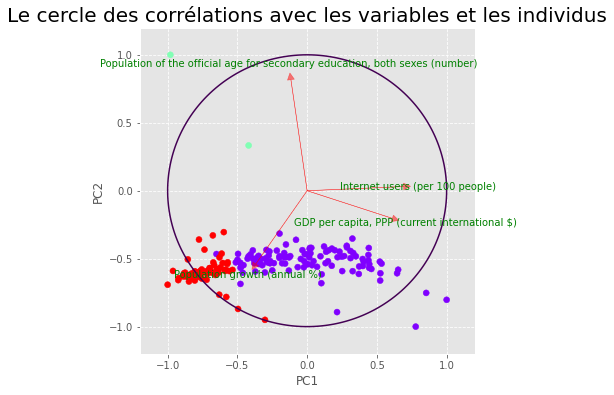

In [ ]:
#Le cercle des corrélations avec les variables et les individus
plt.figure(figsize=(10,14))
biplot(score=df_composantes[:,0:2],
    coeff=np.transpose(pca.components_[0:2, :]), cat=DF1.drop('Country Name',axis=1)['cluster'],coeff_labels=DF_ACP_CAH.columns,
    cmap='rainbow')

plt.title('Le cercle des corrélations avec les variables et les individus', size=20)
plt.show()


## Segmentation des pays (kmeans)

- [X] Choix du nombre cluster

> 3 car meilleur silhouette score (0.44)


- [X] Cluster 0

> plus PIB, plus utilissateurs internet et Growth similaire avec cluster 2

- [X] Cluster 2

> Chine et Inde avec le plus de Pop age secondary

> 2 eme position pour les autres indicateurs 


- [X] Cluster 1

> moins PIB, Moins utilisateurs internet, plus growth, pop age secondary assez similaire avec cluster 1


In [ ]:
#Voir df pour kmeans 
df_segmentation.head(1)

,"GDP per capita, PPP (current international $)",Internet users (per 100 people),Population growth (annual %),"Population of the official age for secondary education, both sexes (number)"
Country Name,,,,
Afghanistan,1875.4474,7.0,3.183202,4676453.0


In [ ]:
# Standardiser les données
from sklearn.preprocessing import StandardScaler
scaler = StandardScaler()
X_scaled = scaler.fit_transform(df_segmentation)


# Choix du nombre de clusters
from sklearn.cluster import KMeans
kmeans = KMeans(n_clusters=3, random_state=39)
kmeans.fit(X_scaled)

KMeans(algorithm='auto', copy_x=True, init='k-means++', max_iter=300,
       n_clusters=3, n_init=10, n_jobs=None, precompute_distances='auto',
       random_state=39, tol=0.0001, verbose=0)

In [ ]:
#Les prédictions 
clusters_kmeans = kmeans.labels_
clusters_kmeans

array([1, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 1, 1, 1, 1, 1, 0, 0,
       0, 1, 1, 1, 1, 1, 0, 1, 1, 0, 2, 0, 1, 1, 1, 0, 1, 0, 0, 0, 0, 1,
       0, 1, 1, 1, 1, 1, 0, 1, 1, 0, 0, 1, 1, 0, 0, 1, 0, 0, 1, 1, 1, 1,
       1, 1, 0, 0, 0, 2, 1, 1, 1, 0, 0, 0, 1, 0, 1, 0, 1, 1, 0, 0, 1, 1,
       0, 1, 1, 1, 0, 0, 0, 0, 1, 1, 0, 1, 1, 0, 1, 1, 0, 1, 1, 0, 1, 0,
       1, 1, 1, 1, 1, 0, 0, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 0, 0, 0, 0,
       0, 1, 1, 1, 0, 1, 0, 0, 1, 0, 0, 1, 1, 0, 1, 0, 0, 0, 1, 1, 1, 0,
       0, 1, 1, 1, 1, 1, 1, 0, 1, 0, 1, 1, 1, 0, 0, 0, 0, 0, 1, 1, 0, 1,
       1, 1, 1], dtype=int32)

Text(0.5, 1.0, ' La méthode du coude montre le nombre optimal de clusters')

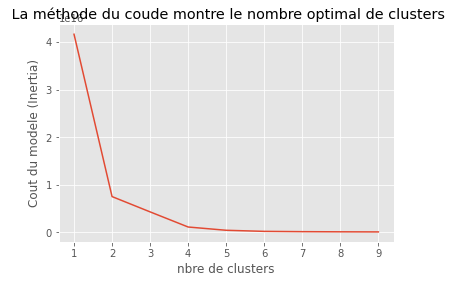

In [ ]:
# Visualisation méthode du coude pour trouver le nombre clusters optimal
inertia = []
K_range = range(1, 10)
for k in K_range:
    model = KMeans(n_clusters=k).fit(df_segmentation)
    inertia.append(model.inertia_)

plt.plot(K_range, inertia)
plt.xlabel('nbre de clusters')
plt.ylabel('Cout du modele (Inertia)')

plt.title(' La méthode du coude montre le nombre optimal de clusters')

Automatically created module for IPython interactive environment
For n_clusters = 2 The average silhouette_score is : 0.4190262237197234
For n_clusters = 3 The average silhouette_score is : 0.4400660107975494
For n_clusters = 4 The average silhouette_score is : 0.40747542701699485
For n_clusters = 5 The average silhouette_score is : 0.37873210253796663
For n_clusters = 6 The average silhouette_score is : 0.3505442913907025


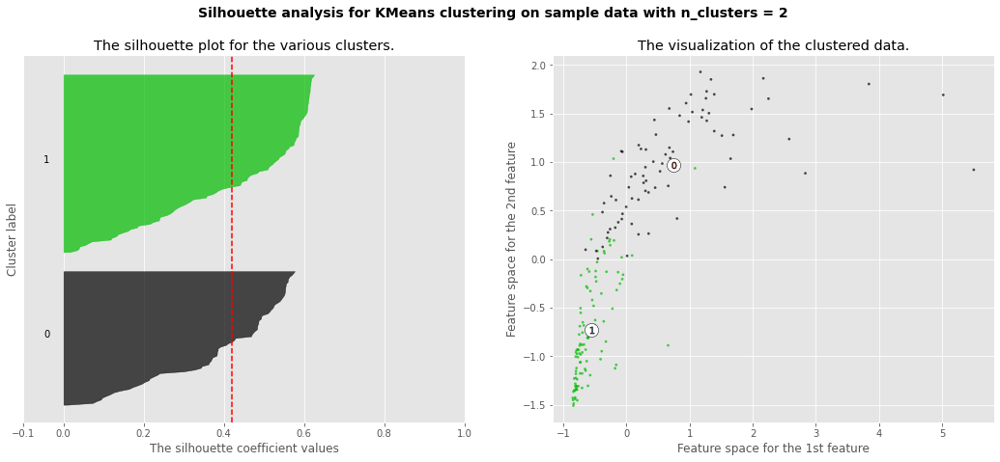

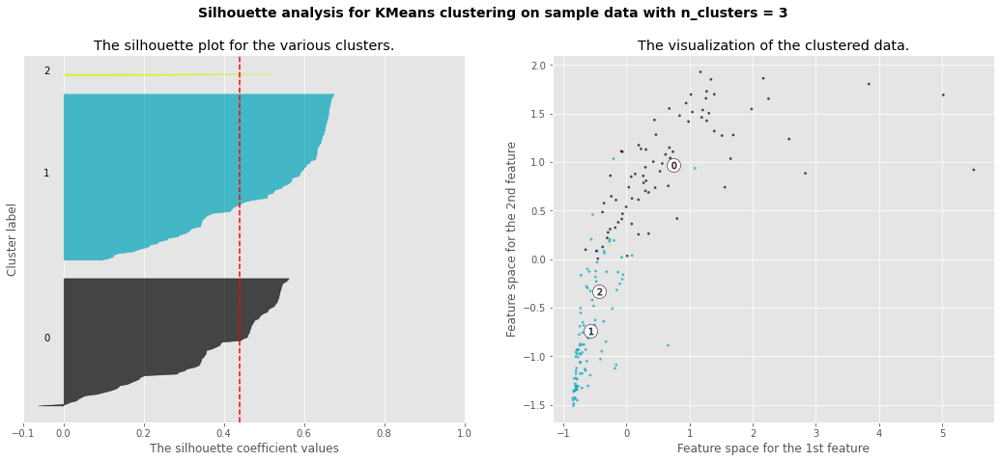

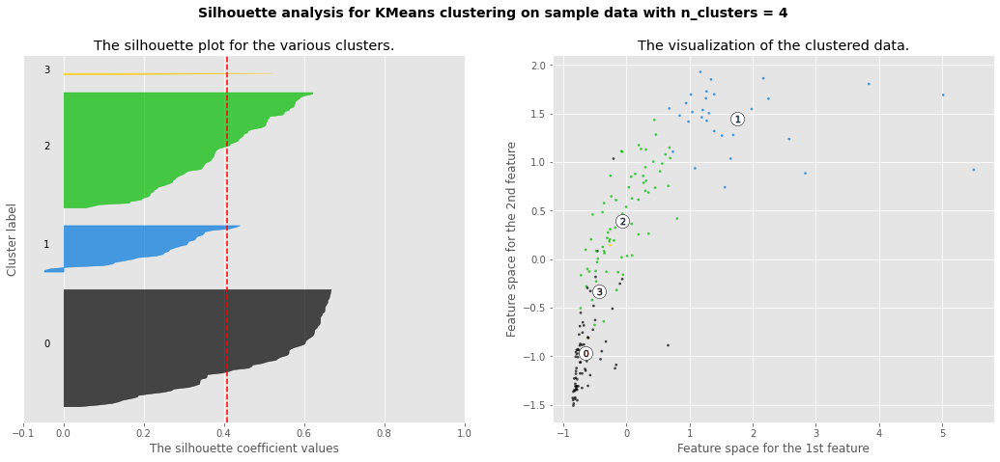

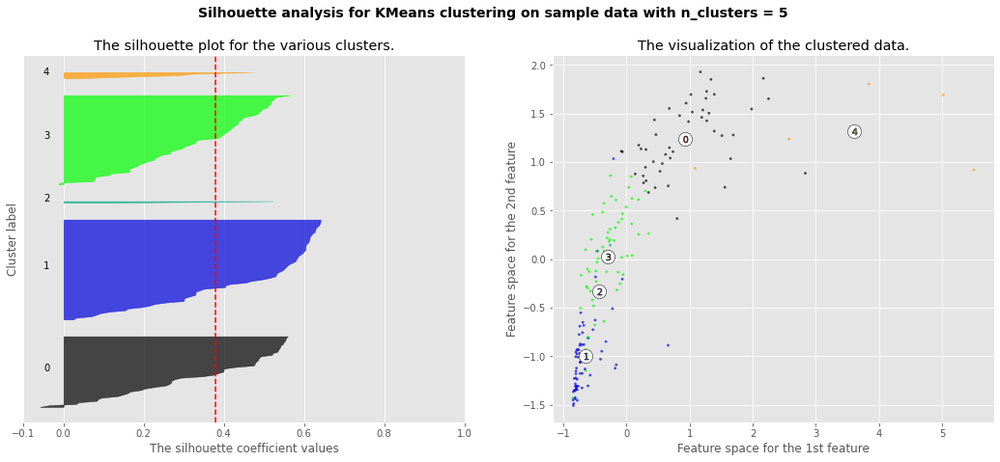

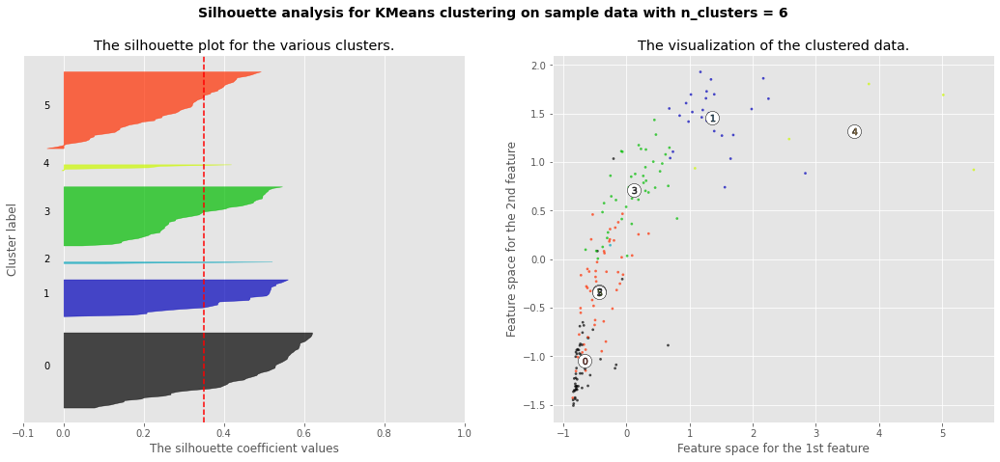

In [ ]:
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_samples, silhouette_score

import matplotlib.pyplot as plt
import matplotlib.cm as cm
import numpy as np

print(__doc__)

  # For reproducibility

range_n_clusters = [2, 3, 4, 5, 6]

for n_clusters in range_n_clusters:
    # Create a subplot with 1 row and 2 columns
    fig, (ax1, ax2) = plt.subplots(1, 2)
    fig.set_size_inches(18, 7)

    # The 1st subplot is the silhouette plot
    # The silhouette coefficient can range from -1, 1 but in this example all
    # lie within [-0.1, 1]
    ax1.set_xlim([-0.1, 1])
    # The (n_clusters+1)*10 is for inserting blank space between silhouette
    # plots of individual clusters, to demarcate them clearly.
    ax1.set_ylim([0, len(X) + (n_clusters + 1) * 10])

    # Initialize the clusterer with n_clusters value and a random generator
    # seed of 10 for reproducibility.
    clusterer = KMeans(n_clusters=n_clusters, random_state=39)
    cluster_labels = clusterer.fit_predict(X_scaled)

    # The silhouette_score gives the average value for all the samples.
    # This gives a perspective into the density and separation of the formed
    # clusters
    silhouette_avg = silhouette_score(X_scaled, cluster_labels)
    print("For n_clusters =", n_clusters,
          "The average silhouette_score is :", silhouette_avg)

    # Compute the silhouette scores for each sample
    sample_silhouette_values = silhouette_samples(X_scaled, cluster_labels)

    y_lower = 10
    for i in range(n_clusters):
        # Aggregate the silhouette scores for samples belonging to
        # cluster i, and sort them
        ith_cluster_silhouette_values = \
            sample_silhouette_values[cluster_labels == i]

        ith_cluster_silhouette_values.sort()

        size_cluster_i = ith_cluster_silhouette_values.shape[0]
        y_upper = y_lower + size_cluster_i

        color = cm.nipy_spectral(float(i) / n_clusters)
        ax1.fill_betweenx(np.arange(y_lower, y_upper),
                          0, ith_cluster_silhouette_values,
                          facecolor=color, edgecolor=color, alpha=0.7)

        # Label the silhouette plots with their cluster numbers at the middle
        ax1.text(-0.05, y_lower + 0.5 * size_cluster_i, str(i))

        # Compute the new y_lower for next plot
        y_lower = y_upper + 10  # 10 for the 0 samples

    ax1.set_title("The silhouette plot for the various clusters.")
    ax1.set_xlabel("The silhouette coefficient values")
    ax1.set_ylabel("Cluster label")

    # The vertical line for average silhouette score of all the values
    ax1.axvline(x=silhouette_avg, color="red", linestyle="--")

    ax1.set_yticks([])  # Clear the yaxis labels / ticks
    ax1.set_xticks([-0.1, 0, 0.2, 0.4, 0.6, 0.8, 1])

    # 2nd Plot showing the actual clusters formed
    colors = cm.nipy_spectral(cluster_labels.astype(float) / n_clusters)
    ax2.scatter(X_scaled[:, 0], X_scaled[:, 1], marker='.', s=30, lw=0, alpha=0.7,
                c=colors, edgecolor='k')

    # Labeling the clusters
    centers = clusterer.cluster_centers_
    # Draw white circles at cluster centers
    ax2.scatter(centers[:, 0], centers[:, 1], marker='o',
                c="white", alpha=1, s=200, edgecolor='k')

    for i, c in enumerate(centers):
        ax2.scatter(c[0], c[1], marker='$%d$' % i, alpha=1,
                    s=50, edgecolor='k')

    ax2.set_title("The visualization of the clustered data.")
    ax2.set_xlabel("Feature space for the 1st feature")
    ax2.set_ylabel("Feature space for the 2nd feature")

    plt.suptitle(("Silhouette analysis for KMeans clustering on sample data "
                  "with n_clusters = %d" % n_clusters),
                 fontsize=14, fontweight='bold')

plt.show()


In [ ]:
# Add labels clusters
X_scaled_clustered_kmeans = pd.DataFrame(X_scaled, columns=df_segmentation.columns, index=df_segmentation.index)
X_scaled_clustered_kmeans['cluster'] = clusters_kmeans
X_scaled_clustered_kmeans 

,"GDP per capita, PPP (current international $)",Internet users (per 100 people),Population growth (annual %),"Population of the official age for secondary education, both sexes (number)",cluster
Country Name,,,,,
Afghanistan,-0.789817,-1.309800,1.333867,0.033898,1
Albania,-0.352080,0.576213,-1.322808,-0.249966,0
Algeria,-0.219200,-0.510642,0.407206,-0.001259,1
Angola,-0.571392,-1.196142,1.570686,-0.047766,1
Antigua and Barbuda,0.077762,0.848993,-0.323144,-0.272104,0
Argentina,0.039912,0.739597,-0.351307,0.000586,0
Australia,1.273213,1.425097,-0.005276,-0.159637,0
Austria,1.391668,1.318394,-0.587837,-0.226587,0
Azerbaijan,-0.061625,1.105434,-0.182436,-0.212092,0


In [ ]:
X_scaled_clustered_kmeans[X_scaled_clustered_kmeans['cluster']==0].index

Index(['Albania', 'Antigua and Barbuda', 'Argentina', 'Australia', 'Austria',
       'Azerbaijan', 'Bahamas, The', 'Bahrain', 'Barbados', 'Belarus',
       'Belgium', 'Brazil', 'Brunei Darussalam', 'Bulgaria', 'Canada', 'Chile',
       'Colombia', 'Costa Rica', 'Croatia', 'Cyprus', 'Czech Republic',
       'Denmark', 'Dominica', 'Estonia', 'Finland', 'France', 'Georgia',
       'Germany', 'Greece', 'Grenada', 'Hong Kong SAR, China', 'Hungary',
       'Iceland', 'Ireland', 'Israel', 'Italy', 'Japan', 'Kazakhstan',
       'Korea, Rep.', 'Kuwait', 'Latvia', 'Lithuania', 'Luxembourg',
       'Macao SAR, China', 'Macedonia, FYR', 'Malaysia', 'Malta', 'Mauritius',
       'Moldova', 'Montenegro', 'Netherlands', 'New Zealand', 'Norway',
       'Poland', 'Portugal', 'Qatar', 'Romania', 'Russian Federation',
       'Saudi Arabia', 'Serbia', 'Seychelles', 'Slovak Republic', 'Slovenia',
       'Spain', 'St. Kitts and Nevis', 'St. Lucia',
       'St. Vincent and the Grenadines', 'Sweden', 'Switzerl

In [ ]:
#Création dataframe pour les clusters 
segmen_kmeans = pd.DataFrame(clusters_kmeans)
DF_kmeans = df_segmentation.reset_index()
DF1_kmeans= pd.concat([DF_kmeans, segmen_kmeans], axis=1)
DF2_kmeans = DF1_kmeans.rename(columns={0:'cluster'})
DF2_kmeans

,Country Name,"GDP per capita, PPP (current international $)",Internet users (per 100 people),Population growth (annual %),"Population of the official age for secondary education, both sexes (number)",cluster
0,Afghanistan,1875.44740,7.000000,3.183202,4676453.0,1
1,Albania,11332.50700,60.100000,-0.207047,345644.0,0
2,Algeria,14203.29200,29.500000,2.000666,4140079.0,1
3,Angola,6594.39800,10.200000,3.485413,3430540.0,1
4,Antigua and Barbuda,20618.99600,67.780000,1.068648,7894.0,0
5,Argentina,19801.26000,64.700000,1.032709,4168223.0,0
6,Australia,46446.02700,84.000000,1.474288,1723758.0,0
7,Austria,49005.16400,80.995830,0.730867,702330.0,0
8,Azerbaijan,17607.62300,75.000015,1.248209,923476.0,0
9,"Bahamas, The",23190.25200,76.920000,1.298133,34098.0,0


In [ ]:
# les centroïdes des groupes et leurs coordonnées dans chacune des dimensions
centroide_kmeans = X_scaled_clustered_kmeans.groupby('cluster').mean()
centroide_kmeans

,"GDP per capita, PPP (current international $)",Internet users (per 100 people),Population growth (annual %),"Population of the official age for secondary education, both sexes (number)"
cluster,,,,
0,0.740477,0.969241,-0.613325,-0.141604
1,-0.561484,-0.739619,0.482184,-0.061363
2,-0.434179,-0.334827,-0.496190,8.519932


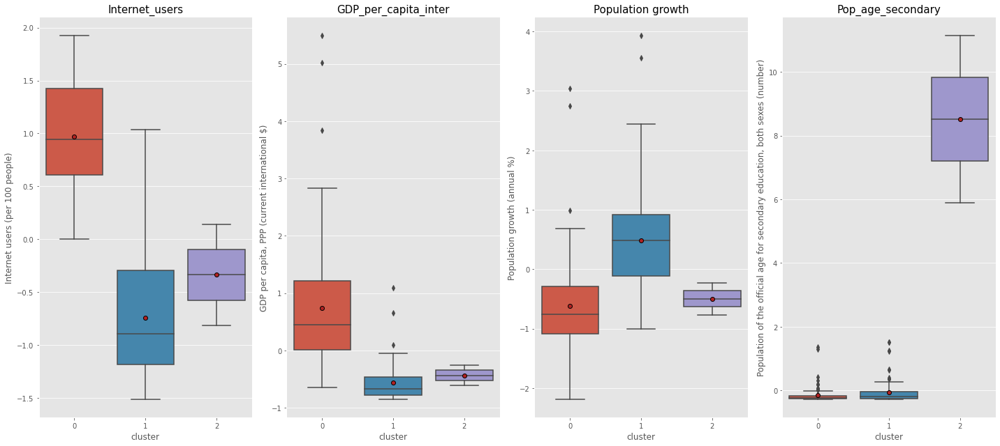

In [ ]:
# Comparer chaque clusters pour chaque dimensions

meanprops = {'marker':'o', 'markeredgecolor':'black',
            'markerfacecolor':'firebrick'}

_, axes = plt.subplots (1, 4 ,sharey = False, figsize = (20, 9)) 
sns.boxplot(x = 'cluster', y = 'Internet users (per 100 people)', 
            data = X_scaled_clustered_kmeans, showmeans=True,meanprops=meanprops, ax = axes [0])
axes[0].set_title("Internet_users",size=15); 

plt.subplots_adjust(hspace=50)
sns.boxplot(x = 'cluster', y = 'GDP per capita, PPP (current international $)', 
               data =  X_scaled_clustered_kmeans, showmeans=True,meanprops=meanprops, ax = axes [1])
axes[1].set_title("GDP_per_capita_inter",size=15);
plt.subplots_adjust(hspace=50)

sns.boxplot(x = 'cluster', y = 'Population growth (annual %)', 
               data = X_scaled_clustered_kmeans ,showmeans=True,meanprops=meanprops, ax = axes [2])
axes[2].set_title("Population growth",size=15);
plt.subplots_adjust(hspace=50)


sns.boxplot(x = 'cluster', y = 'Population of the official age for secondary education, both sexes (number)', 
               data = X_scaled_clustered_kmeans ,showmeans=True,meanprops=meanprops, ax = axes [3])
axes[3].set_title("Pop_age_secondary", size=15);


plt.tight_layout()


(array([0, 1, 2, 3]), <a list of 4 Text major ticklabel objects>)

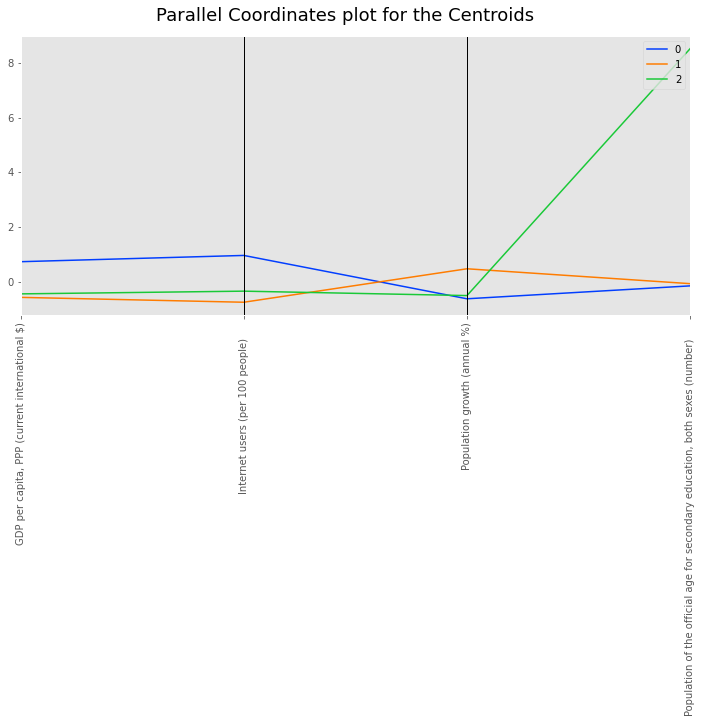

In [ ]:
# les centroïdes des groupes et leurs coordonnées dans chacune des dimensions
display_parallel_coordinates_centroids(centroide_kmeans.reset_index(), 4)
plt.xticks(rotation=90)

### ACP pour kmeans

- [X] Conserver 95% de la variance expliquée


- [X] Projections des pays et des indicateurs

In [ ]:
# supprimer Country Name et mettre les clusters en set_index afin de pouvoir visualiser les clusters 
DF_ACP_KMEANS = DF2_kmeans.drop('Country Name',axis=1).set_index('cluster')
DF_ACP_KMEANS

,"GDP per capita, PPP (current international $)",Internet users (per 100 people),Population growth (annual %),"Population of the official age for secondary education, both sexes (number)"
cluster,,,,
1,1875.44740,7.000000,3.183202,4676453.0
0,11332.50700,60.100000,-0.207047,345644.0
1,14203.29200,29.500000,2.000666,4140079.0
1,6594.39800,10.200000,3.485413,3430540.0
0,20618.99600,67.780000,1.068648,7894.0
0,19801.26000,64.700000,1.032709,4168223.0
0,46446.02700,84.000000,1.474288,1723758.0
0,49005.16400,80.995830,0.730867,702330.0
0,17607.62300,75.000015,1.248209,923476.0


In [ ]:
# selection des colonnes à prendre en compte dans l'ACP
data_pca = DF_ACP_KMEANS[['GDP per capita, PPP (current international $)', 'Internet users (per 100 people)','Population growth (annual %)','Population of the official age for secondary education, both sexes (number)']]
X = data_pca.values
names = DF_ACP_KMEANS.index
features = DF_ACP_KMEANS.columns

# Centrage et Réduction
std_scale = preprocessing.StandardScaler().fit(X)
X_scaled = std_scale.transform(X)

# Calcul des composantes principales
pca = decomposition.PCA(n_components=0.95)
df_composantes= pca.fit_transform(X_scaled)


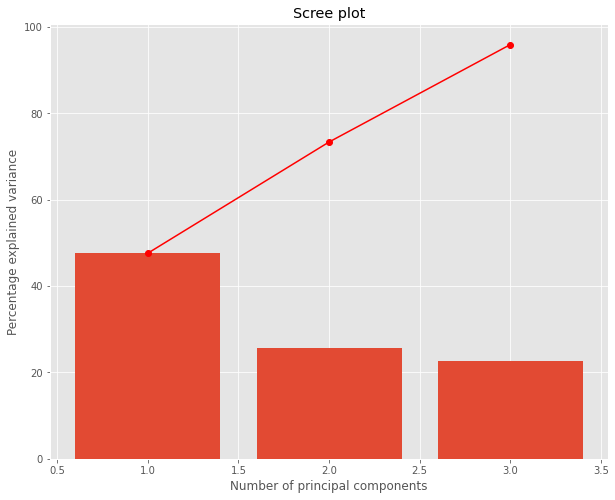

In [ ]:
# Eboulis des valeurs propres
plt.figure(figsize=(10,8))
display_scree_plot(pca)


<Figure size 1080x864 with 0 Axes>

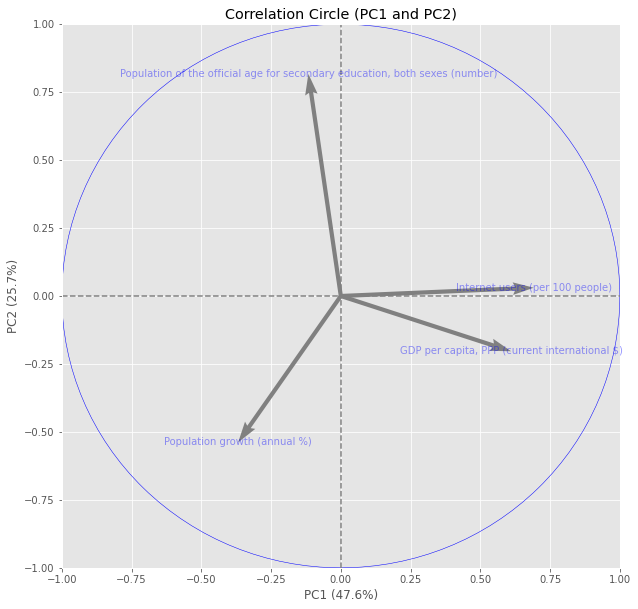

In [ ]:
# Cercle des corrélations
plt.figure(figsize=(15,12))
pcs = pca.components_
display_circles(pcs,3, pca, [(0,1),(2,3),(4,5)], labels = np.array(features))



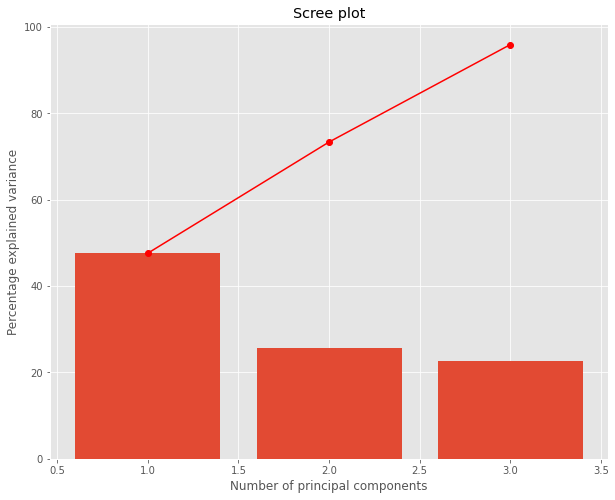

<Figure size 1080x864 with 0 Axes>

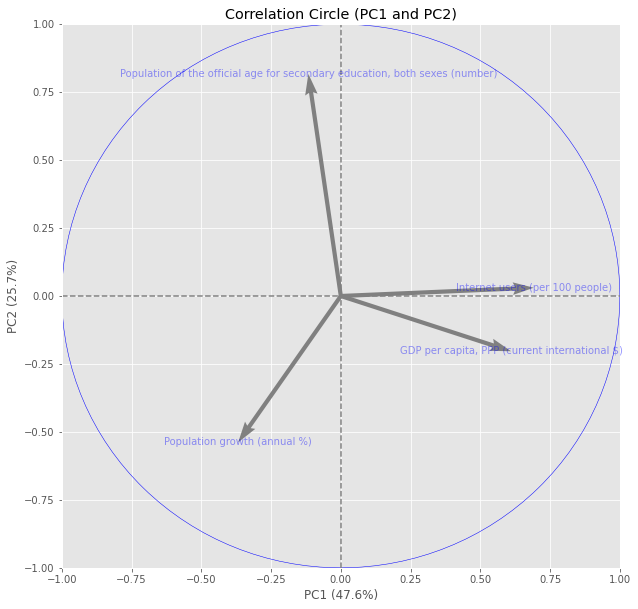

AttributeError: ignored

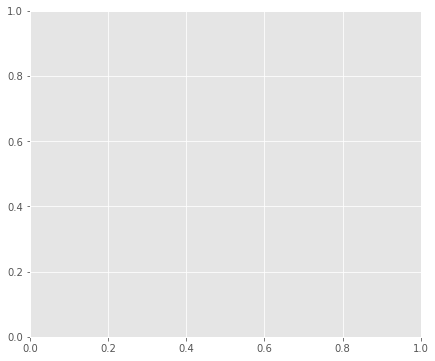

In [ ]:
# selection des colonnes à prendre en compte dans l'ACP
data_pca = DF_ACP_KMEANS[['GDP per capita, PPP (current international $)', 'Internet users (per 100 people)','Population growth (annual %)','Population of the official age for secondary education, both sexes (number)']]
X = data_pca.values
names = DF_ACP_KMEANS.index
features = DF_ACP_KMEANS.columns

# Centrage et Réduction
std_scale = preprocessing.StandardScaler().fit(X)
X_scaled = std_scale.transform(X)

# Calcul des composantes principales
pca = decomposition.PCA(n_components=0.95)
df_composantes= pca.fit_transform(X_scaled)

# Eboulis des valeurs propres
plt.figure(figsize=(10,8))
display_scree_plot(pca)


# Cercle des corrélations
plt.figure(figsize=(15,12))
pcs = pca.components_
display_circles(pcs,3, pca, [(0,1),(2,3),(4,5)], labels = np.array(features))



display_factorial_planes(df_composantes, 4, pca, [(0,1)], illustrative_var = clusters, alpha = 0.8,labels=names)


#X_projected = pca.transform(X_scaled)
#display_factorial_planes(X_projected, 4, pca, [(0,1),(2,3),(4,5)], labels = np.array(names))
plt.legend()
plt.show()

# **Déterminer les pays à forts potentiels pour l'expansion**


- [X] Conservation du cluster 0 de la segmentation Kmeans


- [X] Création d'un score attractivté en donnant des poids plus ou moins important aux indicateurs

> Effectuer sur le cluster 0 de la segmentation du Kmeans 

- [X] Les pays à fort potentiels 

> United states , les pays nordiques , les pays du golfes 

In [ ]:
# afficher les informations pour segmentation CAH 
print(colored('Les clusters pour segmentation CAH', 'blue'))
print(f"Le nombre de pays dans le cluster 1:", len(DF1[DF1['cluster']==1]['Country Name']))
list_CAH = list(DF1[DF1['cluster']==1]['Country Name'])
print(list_CAH)
print('')
# les pays qui sont dans cluster 1 pour CAH 
print("Le nombre de pays dans le cluster 2 :", len(DF1[DF1['cluster']==2]['Country Name']))
list_CAH = list(DF1[DF1['cluster']==2]['Country Name'])
print(list_CAH)

# les pays qui sont dans cluster 1 pour CAH 
print("Le nombre de pays dans le cluster 3 :", len(DF1[DF1['cluster']==3]['Country Name']))
list_CAH = list(DF1[DF1['cluster']==3]['Country Name'])
print(list_CAH)

Les clusters pour segmentation CAH
Le nombre de pays dans le cluster 1: 112
['Albania', 'Algeria', 'Antigua and Barbuda', 'Argentina', 'Australia', 'Austria', 'Azerbaijan', 'Bahamas, The', 'Bahrain', 'Barbados', 'Belarus', 'Belgium', 'Belize', 'Bhutan', 'Bolivia', 'Botswana', 'Brazil', 'Brunei Darussalam', 'Bulgaria', 'Cabo Verde', 'Canada', 'Central African Republic', 'Chile', 'Colombia', 'Costa Rica', 'Croatia', 'Cyprus', 'Czech Republic', 'Denmark', 'Dominica', 'Dominican Republic', 'Ecuador', 'Egypt, Arab Rep.', 'El Salvador', 'Estonia', 'Fiji', 'Finland', 'France', 'Gabon', 'Georgia', 'Germany', 'Greece', 'Grenada', 'Guyana', 'Hong Kong SAR, China', 'Hungary', 'Iceland', 'Iran, Islamic Rep.', 'Ireland', 'Israel', 'Italy', 'Jamaica', 'Japan', 'Kazakhstan', 'Korea, Rep.', 'Kuwait', 'Latvia', 'Lithuania', 'Luxembourg', 'Macao SAR, China', 'Macedonia, FYR', 'Malaysia', 'Maldives', 'Malta', 'Marshall Islands', 'Mauritius', 'Mexico', 'Micronesia, Fed. Sts.', 'Moldova', 'Montenegro', 'Mo

In [ ]:
# afficher les informations pour segmentation KMEANS 
print(colored('Les clusters pour segmentation Kmeans', 'blue'))
print("Le nombre de pays dans le cluster 0 :", len(DF2_kmeans[DF2_kmeans['cluster']==0]['Country Name']))
kmeans_C0 = list(DF2_kmeans[DF2_kmeans['cluster']== 0]['Country Name'])
print(kmeans_C0)
print("Le nombre de pays dans le cluster 1 :", len(DF2_kmeans[DF2_kmeans['cluster']==1]['Country Name']))
kmeans_C1 = list(DF2_kmeans[DF2_kmeans['cluster']==1]['Country Name'])
print(kmeans_C1)

print("Le nombre de pays dans le cluster 2 :", len(DF2_kmeans[DF2_kmeans['cluster']==2]['Country Name']))
kmeans_C2 = list(DF2_kmeans[DF2_kmeans['cluster']==2]['Country Name'])
print(kmeans_C2)

Les clusters pour segmentation Kmeans
Le nombre de pays dans le cluster 0 : 77
['Albania', 'Antigua and Barbuda', 'Argentina', 'Australia', 'Austria', 'Azerbaijan', 'Bahamas, The', 'Bahrain', 'Barbados', 'Belarus', 'Belgium', 'Brazil', 'Brunei Darussalam', 'Bulgaria', 'Canada', 'Chile', 'Colombia', 'Costa Rica', 'Croatia', 'Cyprus', 'Czech Republic', 'Denmark', 'Dominica', 'Estonia', 'Finland', 'France', 'Georgia', 'Germany', 'Greece', 'Grenada', 'Hong Kong SAR, China', 'Hungary', 'Iceland', 'Ireland', 'Israel', 'Italy', 'Japan', 'Kazakhstan', 'Korea, Rep.', 'Kuwait', 'Latvia', 'Lithuania', 'Luxembourg', 'Macao SAR, China', 'Macedonia, FYR', 'Malaysia', 'Malta', 'Mauritius', 'Moldova', 'Montenegro', 'Netherlands', 'New Zealand', 'Norway', 'Poland', 'Portugal', 'Qatar', 'Romania', 'Russian Federation', 'Saudi Arabia', 'Serbia', 'Seychelles', 'Slovak Republic', 'Slovenia', 'Spain', 'St. Kitts and Nevis', 'St. Lucia', 'St. Vincent and the Grenadines', 'Sweden', 'Switzerland', 'Trinidad an

In [ ]:
kmeans_C0

['Albania',
 'Antigua and Barbuda',
 'Argentina',
 'Australia',
 'Austria',
 'Azerbaijan',
 'Bahamas, The',
 'Bahrain',
 'Barbados',
 'Belarus',
 'Belgium',
 'Brazil',
 'Brunei Darussalam',
 'Bulgaria',
 'Canada',
 'Chile',
 'Colombia',
 'Costa Rica',
 'Croatia',
 'Cyprus',
 'Czech Republic',
 'Denmark',
 'Dominica',
 'Estonia',
 'Finland',
 'France',
 'Georgia',
 'Germany',
 'Greece',
 'Grenada',
 'Hong Kong SAR, China',
 'Hungary',
 'Iceland',
 'Ireland',
 'Israel',
 'Italy',
 'Japan',
 'Kazakhstan',
 'Korea, Rep.',
 'Kuwait',
 'Latvia',
 'Lithuania',
 'Luxembourg',
 'Macao SAR, China',
 'Macedonia, FYR',
 'Malaysia',
 'Malta',
 'Mauritius',
 'Moldova',
 'Montenegro',
 'Netherlands',
 'New Zealand',
 'Norway',
 'Poland',
 'Portugal',
 'Qatar',
 'Romania',
 'Russian Federation',
 'Saudi Arabia',
 'Serbia',
 'Seychelles',
 'Slovak Republic',
 'Slovenia',
 'Spain',
 'St. Kitts and Nevis',
 'St. Lucia',
 'St. Vincent and the Grenadines',
 'Sweden',
 'Switzerland',
 'Trinidad and Tobago',

In [ ]:
# voir les colonnes 
DF2_kmeans.columns

Index(['Country Name', 'GDP per capita, PPP (current international $)',
       'Internet users (per 100 people)', 'Population growth (annual %)',
       'Population of the official age for secondary education, both sexes (number)',
       'cluster'],
      dtype='object')

In [ ]:
# fonction pour scoring pour mettre les valeurs entre 0 et 1 
def scoring_col(x):
    return x / x.max()

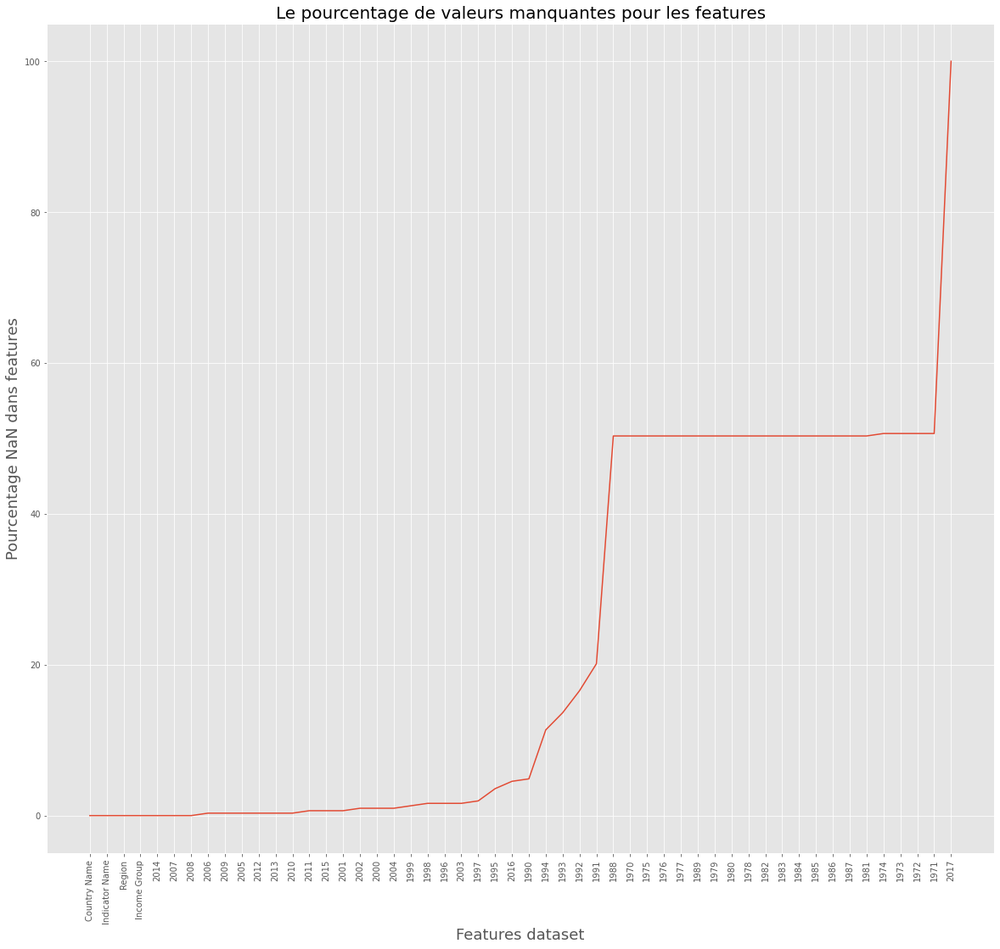

,Pct_NaN_colonne
2017,100.000000
1971,50.649351
1972,50.649351
1973,50.649351
1974,50.649351
1981,50.324675
1987,50.324675
1986,50.324675
1985,50.324675
1984,50.324675


In [ ]:
df_attractive = df_indicator2[df_indicator2['Indicator Name'].isin(['GDP per capita, PPP (current international $)',
       'Internet users (per 100 people)', 'Population growth (annual %)',
       'Population of the official age for secondary education, both sexes (number)'])]
df_attractive1 = df_attractive[df_attractive['Country Name'].isin(kmeans_C0)]
df_attractive1
df_attractive1.drop(['Country Code', 'Topic', 'Long definition'], axis=1, inplace=True)
df_attractive1#.dropna(axis='columns')
#df_attractive1 = df_attractive1.melt(id_vars=["Country Name",'Indicator Name',"Region","Income Group"])
#sns.heatmap(df_attractive1.notnull().groupby(df_indicator_filter_Year['Indicator Name'], sort=False, dropna=False).sum())
plot_pourcentage_NaN_features(df_attractive1)

#sns.heatmap(df_indicator_filter_Year.notnull().groupby(df_indicator_filter_Year['Indicator Name'], sort=False, dropna=False).sum())

In [ ]:
#Selectionner le cluster afin de lui appliquer unee methode scoring
df_expansion_kmeans = DF2_kmeans[DF2_kmeans['cluster']==0]
data_table.DataTable(df_expansion_kmeans, include_index=False, num_rows_per_page=77)

,Country Name,"GDP per capita, PPP (current international $)",Internet users (per 100 people),Population growth (annual %),"Population of the official age for secondary education, both sexes (number)",cluster
1,Albania,11332.5070,60.100000,-0.207047,345644.0,0
4,Antigua and Barbuda,20618.9960,67.780000,1.068648,7894.0,0
5,Argentina,19801.2600,64.700000,1.032709,4168223.0,0
6,Australia,46446.0270,84.000000,1.474288,1723758.0,0
7,Austria,49005.1640,80.995830,0.730867,702330.0,0
8,Azerbaijan,17607.6230,75.000015,1.248209,923476.0,0
9,"Bahamas, The",23190.2520,76.920000,1.298133,34098.0,0
10,Bahrain,46178.0800,90.503136,1.582802,91101.0,0
12,Barbados,17234.1400,75.160000,0.309599,18859.0,0
13,Belarus,18902.3550,59.020000,0.089903,605933.0,0


In [ ]:
# appliquer la fonction scoring sur les colonnes 
df_scoring = df_expansion_kmeans.set_index('Country Name')[['GDP per capita, PPP (current international $)', 'Internet users (per 100 people)','Population growth (annual %)','Population of the official age for secondary education, both sexes (number)']].apply(scoring_col)
#attribuer des poids pour les colonnes afin de déterminer les colonnes qui ont le plus d'importance pour le ranking 
df_scoring['scoring'] = (df_scoring['Internet users (per 100 people)']*5 + df_scoring['GDP per capita, PPP (current international $)']*4 + df_scoring['Population of the official age for secondary education, both sexes (number)']*3 + df_scoring['Population growth (annual %)']*2)/14
data_table.DataTable(df_scoring, include_index=True, num_rows_per_page=77)

,"GDP per capita, PPP (current international $)",Internet users (per 100 people),Population growth (annual %),"Population of the official age for secondary education, both sexes (number)",scoring
Country Name,,,,,
Albania,0.082276,0.612266,-0.038619,0.013918,0.239639
Antigua and Barbuda,0.149698,0.690505,0.199329,0.000318,0.317924
Argentina,0.143761,0.659128,0.192625,0.167840,0.339961
Australia,0.337208,0.855746,0.274990,0.069410,0.456126
Austria,0.355788,0.825141,0.136324,0.028280,0.421882
Azerbaijan,0.127835,0.764059,0.232821,0.037185,0.350631
"Bahamas, The",0.168366,0.783619,0.242133,0.001373,0.362853
Bahrain,0.335263,0.921996,0.295231,0.003668,0.468036
Barbados,0.125124,0.765689,0.057748,0.000759,0.317622


In [ ]:
df_expansion_CAH = DF1[DF1['cluster']==1]
# appliquer la fonction scoring sur les colonnes 
df_scoring2 = df_expansion_CAH.set_index('Country Name')[['GDP per capita, PPP (current international $)', 'Internet users (per 100 people)','Population growth (annual %)','Population of the official age for secondary education, both sexes (number)']].apply(scoring_col)
#attribuer des poids pour les colonnes afin de déterminer les colonnes qui ont le plus d
# d'importance pour le ranking 
df_scoring2['scoring'] = (df_scoring2['Internet users (per 100 people)']*5 + df_scoring2['GDP per capita, PPP (current international $)']*4 + df_scoring2['Population of the official age for secondary education, both sexes (number)']*3 + df_scoring2['Population growth (annual %)']*2)/14
data_table.DataTable(df_scoring2, include_index=True, num_rows_per_page=77)

,"GDP per capita, PPP (current international $)",Internet users (per 100 people),Population growth (annual %),"Population of the official age for secondary education, both sexes (number)",scoring
Country Name,,,,,
Albania,0.082276,0.612266,-0.038619,0.013918,0.239639
Algeria,0.103119,0.300530,0.373173,0.166706,0.225828
Antigua and Barbuda,0.149698,0.690505,0.199329,0.000318,0.317924
Argentina,0.143761,0.659128,0.192625,0.167840,0.339961
Australia,0.337208,0.855746,0.274990,0.069410,0.456126
Austria,0.355788,0.825141,0.136324,0.028280,0.421882
Azerbaijan,0.127835,0.764059,0.232821,0.037185,0.350631
"Bahamas, The",0.168366,0.783619,0.242133,0.001373,0.362853
Bahrain,0.335263,0.921996,0.295231,0.003668,0.468036


In [ ]:
# sélectionner cluster 1 
df_expansion_CAH = DF1[DF1['cluster']==1]
# appliquer la fonction scoring sur les colonnes 
df_scoring2 = df_expansion_CAH.set_index('Country Name')[['GDP per capita, PPP (current international $)', 'Internet users (per 100 people)','Population growth (annual %)','Population of the official age for secondary education, both sexes (number)']].apply(scoring_col)
#attribuer des poids pour les colonnes afin de déterminer les colonnes qui ont le plus d
# d'importance pour le ranking 
df_scoring2['scoring'] = (df_scoring2['Internet users (per 100 people)']*30 + df_scoring2['GDP per capita, PPP (current international $)']*30 + df_scoring2['Population of the official age for secondary education, both sexes (number)']*30 + df_scoring2['Population growth (annual %)']*10)/100
data_table.DataTable(df_scoring2, include_index=True, num_rows_per_page=77)

,"GDP per capita, PPP (current international $)",Internet users (per 100 people),Population growth (annual %),"Population of the official age for secondary education, both sexes (number)",scoring
Country Name,,,,,
Albania,0.082276,0.612266,-0.038619,0.013918,0.208676
Algeria,0.103119,0.300530,0.373173,0.166706,0.208424
Antigua and Barbuda,0.149698,0.690505,0.199329,0.000318,0.272089
Argentina,0.143761,0.659128,0.192625,0.167840,0.310481
Australia,0.337208,0.855746,0.274990,0.069410,0.406208
Austria,0.355788,0.825141,0.136324,0.028280,0.376395
Azerbaijan,0.127835,0.764059,0.232821,0.037185,0.302006
"Bahamas, The",0.168366,0.783619,0.242133,0.001373,0.310221
Bahrain,0.335263,0.921996,0.295231,0.003668,0.407801


In [ ]:
#Création df pour mapper les pays sur la carte du monde
df_Country_code = df_filter_ind[['Country Name', 'Country Code']]
list_target_country = ['Qatar','Luxembourg', 'United States', 'Macao SAR, China', 'Kuwait', 'Norway', 'United Arab Emirates', 'Switzerland', 'Germany', 'United Kingdom', 'Iceland', 'Bahrain', 'Denmark', 'Sweden']
df_scoring2 = df_scoring2.reset_index()

df_target_country = df_scoring2[df_scoring2['Country Name'].isin(list_target_country)]
df_world_map = df_target_country.merge(df_Country_code, how='inner', on='Country Name').drop_duplicates()

In [ ]:
 #Création carte du monde pour voir les pays cibles  
import plotly.graph_objs as go 
from plotly.offline import download_plotlyjs, init_notebook_mode, plot, iplot
import chart_studio.plotly


init_notebook_mode(connected=True) 


data = dict(
        type = 'choropleth',
        locations = df_world_map['Country Code'],
        z = df_world_map['scoring'],
        text = df_world_map['Country Name'],
        colorbar = {'title' : 'Score attractivité'},
      ) 


layout = dict(
    title = "Les pays avec un fort potentiel de clients pour nos services",
    geo = dict(
        showframe = False,
        #projection = {'type':'Mercator'}
    )
)


choromap = go.Figure(data = [data],layout = layout)
HTML(choromap.to_html())

# Evolution des pays pour l'expansion

- [X] Les meilleurs évolutions pour les indicateurs :

> GDP per capita (tendance positives pour la plupart des pays) 

Qatar 

> internet user (tendance positives pour la plupart des pays)

Iceland, Norway, Luxembourg

> Pop Growth (variations à la hausse ou à la baisse pour les pays ou range)``

Qatar


> Pop age secondary ( Différence entre les pays)

3 pays se détachent :

1) United States , 2) Germany, 3) United kingdom




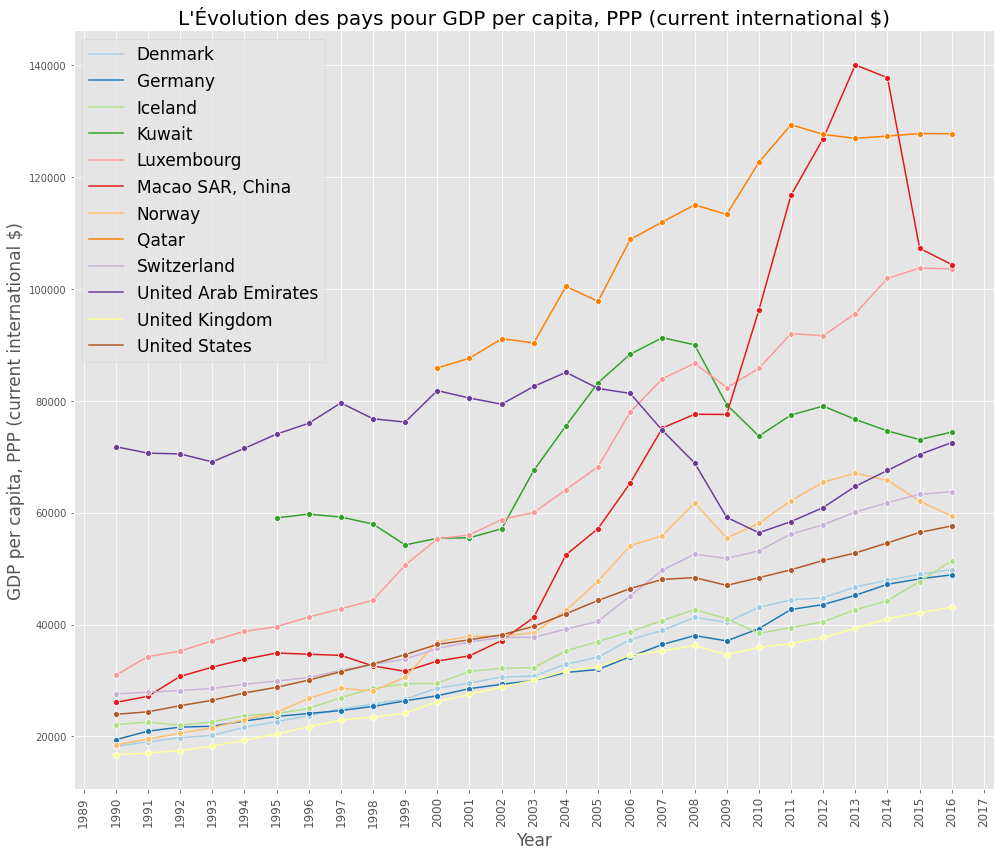

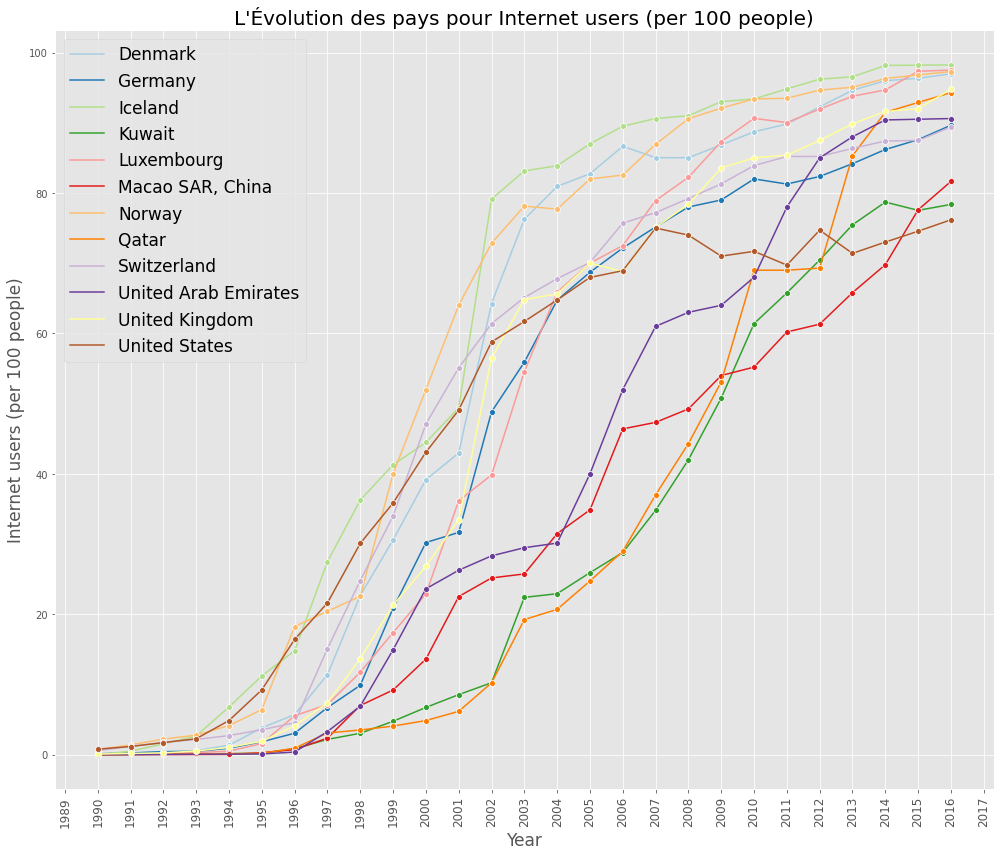

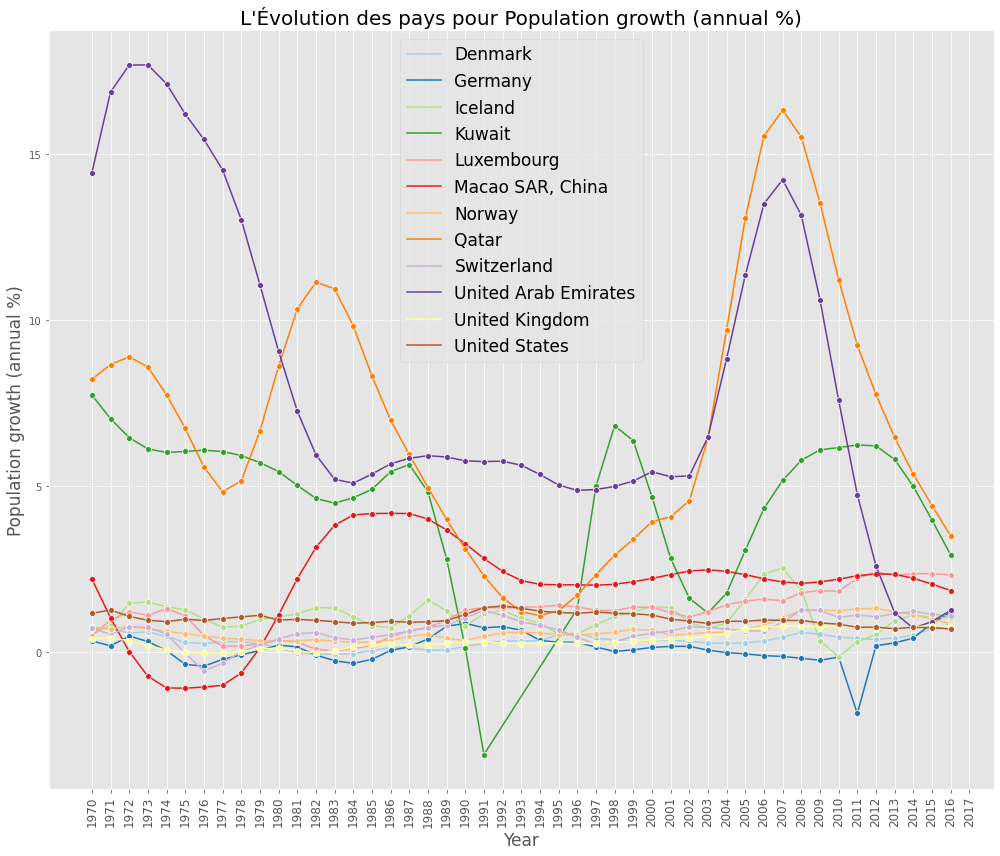

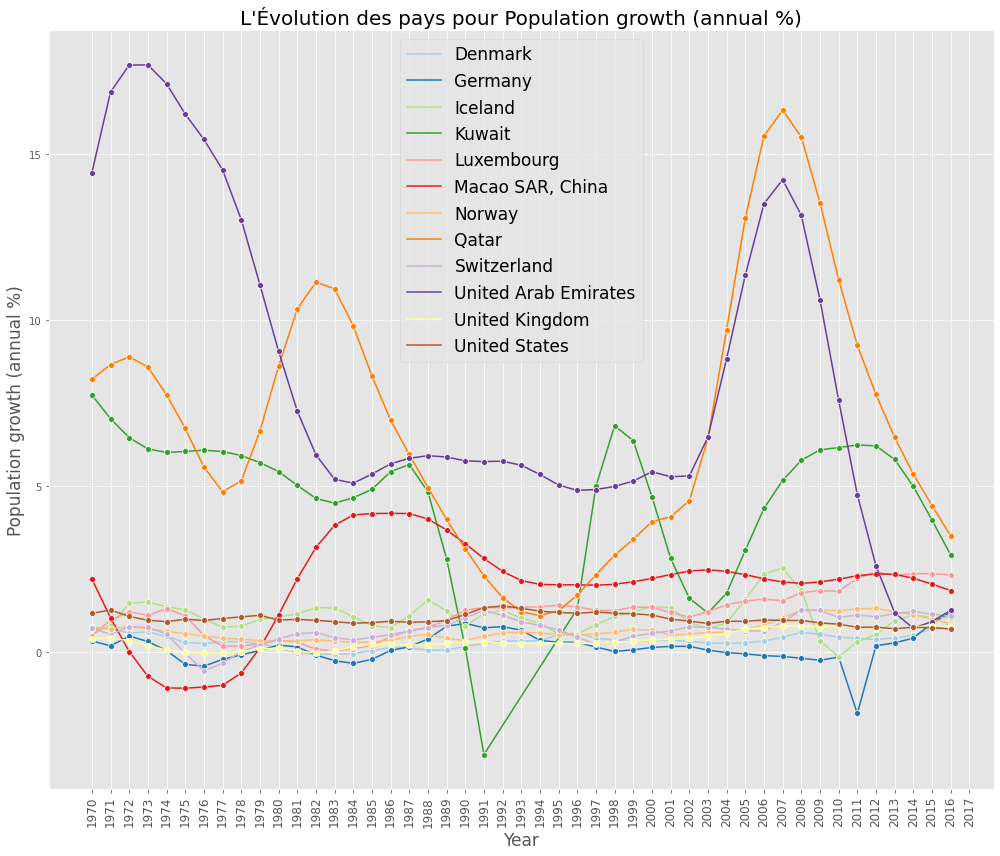

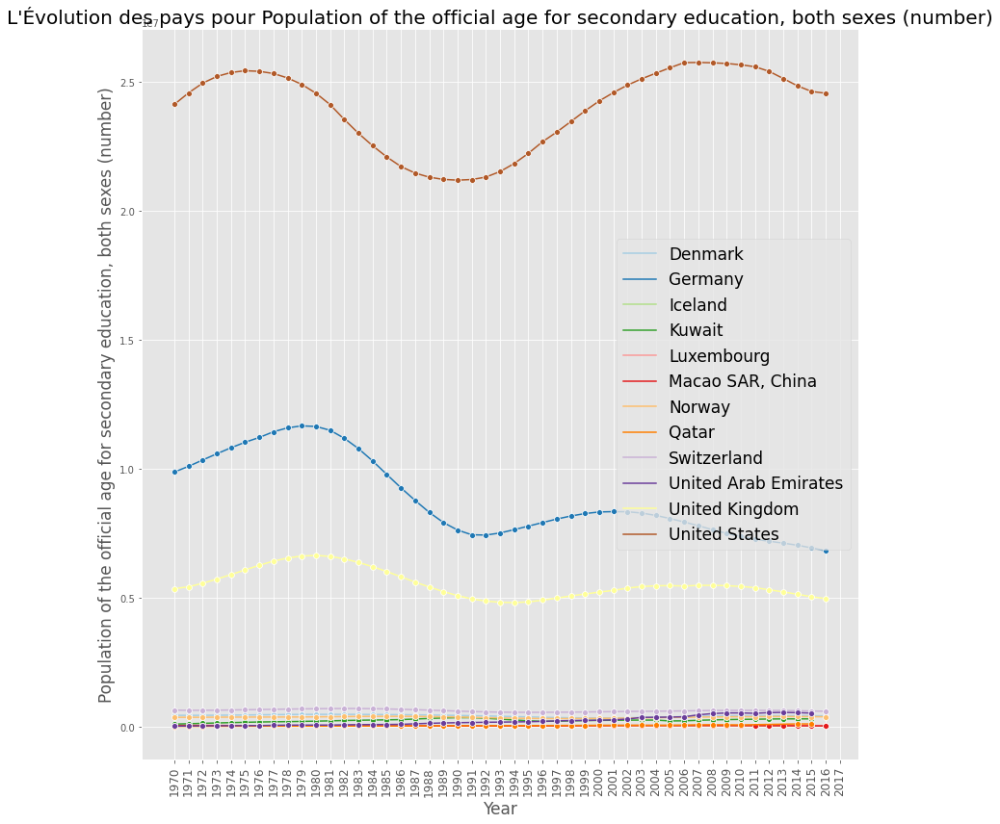

In [ ]:
#Création liste des incidateurs
sns.color_palette("tab10")
list_ind_evolution = ['GDP per capita, PPP (current international $)',
       'Internet users (per 100 people)', 'Population growth (annual %)',
       'Population growth (annual %)','Population of the official age for secondary education, both sexes (number)']


list_pays_target=['Qatar', 'Luxembourg','United States', 'Macao SAR, China', 'Kuwait','Norway', 'United Arab Emirates',
'Switzerland', 'Germany', 'United Kingdom', 'Iceland', 'Denmark']
#Itération pour afficher chaque indicateur selon les années et en hue la region 
for ind in list_ind_evolution:
  df_ind_evol = df_indicator2[df_indicator2['Indicator Name'].isin(list_ind_evolution)]
  df_ind_evol1 = df_ind_evol[df_ind_evol['Country Name'].isin(list_pays_target)]
  df_ind_evol1.drop(['Country Code', 'Topic', 'Long definition'], axis=1, inplace=True)
  
  df_ind_evol_final = df_ind_evol1.melt(id_vars=["Country Name",'Indicator Name',"Region","Income Group"])
  df_ind_evol_final = df_ind_evol_final.rename(columns={'variable':'Year'})
  
  df_ind_evol_final1 = df_ind_evol_final[df_ind_evol_final['Indicator Name']==ind]
  plt.figure(figsize=(14,12))
  plt.title(f"L'Évolution des pays pour {ind}", size=20)
  fig = sns.lineplot(data= df_ind_evol_final1,x='Year', y= 'value', hue='Country Name',marker=('o'), ci = None, palette = "Paired" )
  plt.legend(fontsize=17)
  plt.xlabel('Year',fontsize=17)
  plt.ylabel(ind, fontsize=17)
  plt.xticks(rotation= 90,fontsize=12)
  plt.tight_layout()


# Les Projections de la World Bank  

In [ ]:
projections2.columns

Index(['index', 'Country Name', 'Country Code', 'Topic', 'Indicator Name',
       'Long definition', 'Region', 'Income Group', '1970', '1971', '1972',
       '1973', '1974', '1975', '1976', '1977', '1978', '1979', '1980', '1981',
       '1982', '1983', '1984', '1985', '1986', '1987', '1988', '1989', '1990',
       '1991', '1992', '1993', '1994', '1995', '1996', '1997', '1998', '1999',
       '2000', '2001', '2002', '2003', '2004', '2005', '2006', '2007', '2008',
       '2009', '2010', '2011', '2012', '2013', '2014', '2015', '2016', '2017',
       '2020', '2025', '2030', '2035', '2040', '2045', '2050', '2055', '2060',
       '2065', '2070', '2075', '2080', '2085', '2090', '2095', '2100'],
      dtype='object')

In [ ]:

projections = df_topic_NaN_STR[df_topic_NaN_STR['Topic']=='NaN']
projections1 = projections[projections['Indicator Name']=='Wittgenstein Projection: Percentage of the population age 15+ by highest level of educational attainment. Upper Secondary. Total']
projections2 = projections1[projections1['Country Name'].isin(list_pays_target)]
projections3 = projections2[['Country Name', 'Country Code', 'Topic', 'Indicator Name',
       'Long definition', 'Region', 'Income Group','2020', '2025', '2030', '2035', '2040', '2045', '2050', '2055', '2060',
       '2065', '2070', '2075', '2080', '2085', '2090', '2095', '2100']]
projections3.drop(['Country Code', 'Topic', 'Long definition'], axis=1, inplace=True)